In [1]:
import torch
from torch import nn
import torch.utils.data as Data
import torch.optim as optim
import numpy as np
from os.path import join as PJ
import matplotlib.pyplot as plt 

In [2]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image,ImageOps

In [3]:
import tensorflow as tf

In [5]:
def LoadFiles(mode="train"):
    if mode == "train":
        with open(TrainFile, 'r') as trainf:
            image_info = trainf.readlines()
            image_info = [path.strip().split() for path in image_info]
            image_info = np.asarray(image_info)

            # Split to image path and label
            image_paths = image_info[:, 0]
            label_ids = image_info[:, 1].astype(int)

#             labels = tf.one_hot(label_ids, num_class, dtype=tf.int32)
            print("in Load : ", label_ids.shape)
            return image_paths, label_ids
    else:
        with open(TestFile, 'r') as testf:
            image_info = testf.readlines()
            image_info = [path.strip().split() for path in image_info]
            image_info = np.asarray(image_info)

            # Split to image path and label
            image_paths = image_info[:, 0]
            label_ids = image_info[:, 1].astype(int)
#             labels = tf.one_hot(label_ids, num_class, dtype=tf.int32)
            return image_paths, label_ids

In [6]:
import cv2
class TermiteDataset(Dataset):
    def __init__(self, data_file, transform):
        with open(data_file, 'r') as f:
            image_info = f.readlines()
        image_info = [path.strip().split() for path in image_info]
        image_info = np.asarray(image_info)

        # Split to image path and label
        self.image_paths = image_info[:, 0]
        self.label_ids = image_info[:, 1].astype(int)
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
#         print(idx, self.label_ids.shape, self.label_ids[idx])
        label = self.label_ids[idx]
        image_path = self.image_paths[idx]
        original_image = Image.open(image_path).convert('RGB')
        
#         print(original_image.size)
        
        if original_image.size[0] > 1000:
            original_image = original_image.resize((1000, original_image.size[1]*1000//original_image.size[0]))
        elif original_image.size[1] > 1000:
            original_image = original_image.resize((original_image.size[0]*1000//original_image.size[1], 1000))
#         print(original_image.shape)
        left = 500-original_image.size[0]//2
        right = 500-original_image.size[0]//2
        top = 500-original_image.size[1]//2
        bottom = 500-original_image.size[1]//2
        
        if left + right + original_image.size[0] != 1000:
            right = 1000 - left - original_image.size[0]
        if top + bottom + original_image.size[1] != 1000:
            top = 1000 - bottom - original_image.size[1]
        
#         original_image= cv2.copyMakeBorder(original_image,left,right,top,bottom,cv2.BORDER_CONSTANT,value=(0, 0, 0))
        original_image = ImageOps.expand(original_image, border=(left,top,right,bottom), fill=0)##left,top,right,bottom
        original_image = original_image.resize((130,130))
        transform1 = transforms.Compose([transforms.ToTensor()])
        original_image = transform1(original_image)
#         print(original_image.shape)
        
        
#         original_image = self.transform(original_image)
#         original_image.permute(2,0,1)
#         print(original_image.shape, answer.shape)
        return label, original_image, self.image_paths[idx]

def transform_set(train, new_size=None, pad=None):
    """
    train: True or False
    new_size: int or tuple
    
    """
#     transform_list = [transforms.ToTensor(),
#                       transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])]
    transform_list = [transforms.ToTensor()]
    # replace centercrop to padding
#     transform_list = [transforms.CenterCrop((crop_h, crop_w))] + transform_list if crop else transform_list
#     transform_list = [transforms.Resize(new_size)] + transform_list if new_size is not None else transform_list

#     transform_list = [transforms.RandomHorizontalFlip()] + transform_list if train else transform_list
    transform = transforms.Compose(transform_list)
    return transform

In [7]:
def CheckFile(filename):
    with open(filename, 'r') as f:
            image_info = f.readlines()
    image_info = [path.strip().split() for path in image_info]
    image_info = np.asarray(image_info)
    counts = {"台灣土白蟻兵蟻" : 0,
             "台灣土白蟻工蟻" : 0,
             "台灣家白蟻兵蟻" : 0,
             "台灣家白蟻工蟻" : 0,
             "截頭堆沙兵蟻" : 0,
             "截頭堆沙工蟻" : 0,
             "黃肢散工蟻" : 0,
             "黃肢散兵蟻" : 0,
             "背景": 0}
        
    Locations = {"L1" : 0,
             "L2" : 0,
             "L3" : 0}
    for line in image_info:
        path = line[0]
        if "L1" in path:
            Locations["L1"] += 1
        if "L2" in path:
            Locations["L2"] += 1
        if "L3" in path:
            Locations["L3"] += 1
        if "台灣土白蟻兵蟻" in path:
            counts["台灣土白蟻兵蟻"] += 1
        if "台灣土白蟻工蟻" in path:
            counts["台灣土白蟻工蟻"] += 1
        if "台灣家白蟻兵蟻" in path:
            counts["台灣家白蟻兵蟻"] += 1
        if "台灣家白蟻工蟻" in path:
            counts["台灣家白蟻工蟻"] += 1
        if "截頭堆沙兵蟻" in path:
            counts["截頭堆沙兵蟻"] += 1
        if "截頭堆沙工蟻" in path:
            counts["截頭堆沙工蟻"] += 1
        if "黃肢散兵蟻" in path:
            counts["黃肢散兵蟻"] += 1
        if "黃肢散工蟻" in path:
            counts["黃肢散工蟻"] += 1
        if "背景" in path:
            counts["背景"] += 1
    print(Locations, counts)

In [8]:
BATCH_SIZE = 64
EPOCH = 100
LearningRate = 0.0001
Momentum = 0.9
TrainFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_trainfile_3.txt"
ValFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_valfile_3.txt"
TestFile = "/home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_testfile_3.txt"
# classes = ["O. formosanus Army","O. formosanus Worker", "C. formosanus Army","C. formosanus Worker", "C. domesticus Army","C. domesticus Worker", "R. flaviceps Worker", "R. flaviceps Army"]
classes = ["O.f Soldier","O.f Worker", "C.f Soldier","C.f Worker", "C.d Soldier","C.d Worker", "R.f Soldier", "R.f Worker"]
#"台灣土白蟻兵蟻", "台灣土白蟻工蟻", "台灣家白蟻兵蟻", "台灣家白蟻工蟻","截頭堆沙兵蟻", "截頭堆沙工蟻", "黃肢散兵蟻",   "黃肢散工蟻"
model_directory = "/home/ytliu/Termite-Bonnie/PAPER_termite/*BENCH_test_time/"
temp_directory = "/home/ytliu/Termite-Bonnie/PAPER_termite/*BENCH_test_time/"

In [ ]:
print("TrainFile : ", TrainFile)
print("ValidationFile : ", ValFile)
print("TestFile : ", TestFile)
CheckFile(TrainFile)
CheckFile(ValFile)
CheckFile(TestFile)

TrainFile :  /home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_trainfile_L12_CFselected.txt
ValidationFile :  /home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_valfile_L12_CFselected.txt
TestFile :  /home/ytliu/Termite-Bonnie/PAPER_termite/BENCHMARK-LARGE_Ind_testfile_L12.txt
{'L1': 6400, 'L2': 6400, 'L3': 0} {'台灣土白蟻兵蟻': 1600, '台灣土白蟻工蟻': 1600, '台灣家白蟻兵蟻': 1600, '台灣家白蟻工蟻': 1600, '截頭堆沙兵蟻': 1600, '截頭堆沙工蟻': 1600, '黃肢散工蟻': 1600, '黃肢散兵蟻': 1600, '背景': 0}
{'L1': 1600, 'L2': 1600, 'L3': 0} {'台灣土白蟻兵蟻': 400, '台灣土白蟻工蟻': 400, '台灣家白蟻兵蟻': 400, '台灣家白蟻工蟻': 400, '截頭堆沙兵蟻': 400, '截頭堆沙工蟻': 400, '黃肢散工蟻': 400, '黃肢散兵蟻': 400, '背景': 0}
{'L1': 0, 'L2': 0, 'L3': 8000} {'台灣土白蟻兵蟻': 1000, '台灣土白蟻工蟻': 1000, '台灣家白蟻兵蟻': 1000, '台灣家白蟻工蟻': 1000, '截頭堆沙兵蟻': 1000, '截頭堆沙工蟻': 1000, '黃肢散工蟻': 1000, '黃肢散兵蟻': 1000, '背景': 0}


In [ ]:
import torchvision.models as models
import os
# from MobileNetV2 import MobileNetV2
print(torch.__version__)
torch.cuda.set_device(0)
print(torch.cuda.current_device())
# mobilenet =  MobileNetV2(n_class=len(classes)).cuda()
mobilenet =  nn.Sequential(models.mobilenet_v2(pretrained=True), nn.Linear(1000, len(classes))).cuda()

1.3.0
0


In [ ]:
model = mobilenet
# model = MobileNet(len(classes))
# model.to(cuda)
# model = model.cuda()
model = model
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=LearningRate, momentum=Momentum)

In [ ]:
transform = transform_set(train=True)
trainset = TermiteDataset(TrainFile, transform)
trainloader = Data.DataLoader(
    dataset=trainset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)

In [ ]:
transform2 = transform_set(train=False)
valset = TermiteDataset(ValFile, transform2)
valloader = Data.DataLoader(
    dataset=valset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)

In [ ]:
# for labels, images in loader:
#     print(labels.shape)
#     print(images.shape)
#     ssssss

# TRAIN
### 
### validation

Train
[1, 00020] loss: 44.077 acc: 0.259
[1, 00040] loss: 64.452 acc: 0.449
[1, 00060] loss: 77.547 acc: 0.556
[1, 00080] loss: 88.226 acc: 0.619
[1, 00100] loss: 96.583 acc: 0.665
[1, 00120] loss: 103.410 acc: 0.702
[1, 00140] loss: 109.313 acc: 0.731
[1, 00160] loss: 114.680 acc: 0.753
[1, 00180] loss: 119.273 acc: 0.771
[1, 00200] loss: 123.873 acc: 0.787
[0.786953125]
[123.87349117547274]


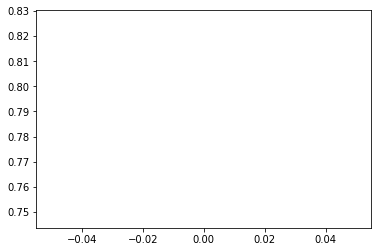

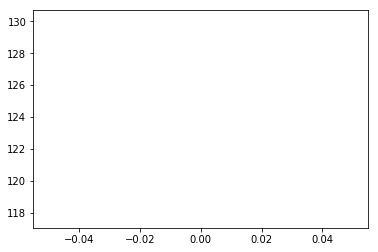

Validation
[0.9209375]
[11.838936403393745]


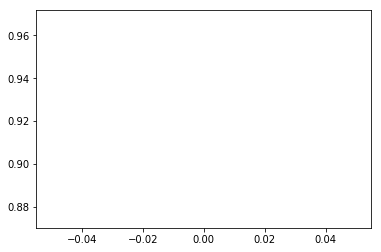

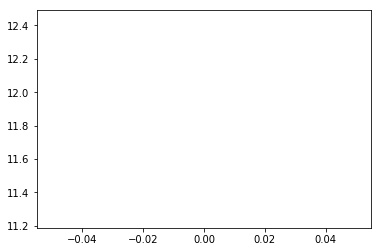


[1] accuracy: 0.921 loss: 11.839

runtime :  131.1338164806366
Train
[2, 00020] loss: 3.666 acc: 0.943
[2, 00040] loss: 6.852 acc: 0.950
[2, 00060] loss: 10.166 acc: 0.950
[2, 00080] loss: 13.161 acc: 0.949
[2, 00100] loss: 16.089 acc: 0.951
[2, 00120] loss: 18.981 acc: 0.951
[2, 00140] loss: 21.376 acc: 0.953
[2, 00160] loss: 23.804 acc: 0.954
[2, 00180] loss: 26.261 acc: 0.955
[2, 00200] loss: 28.854 acc: 0.956
[0.786953125, 0.95578125]
[123.87349117547274, 28.854025166481733]


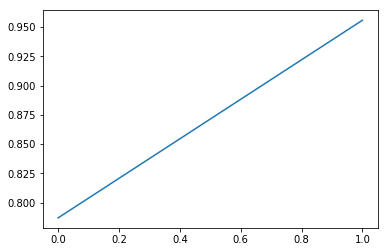

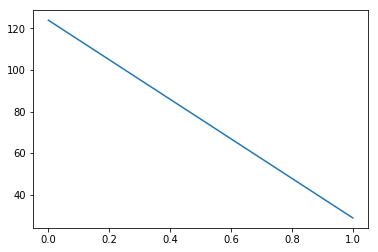

Validation
[0.9209375, 0.946875]
[11.838936403393745, 7.899137392640114]


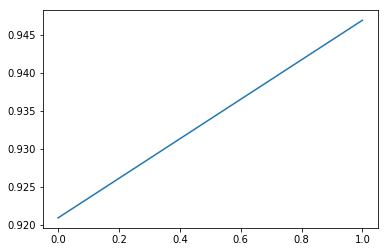

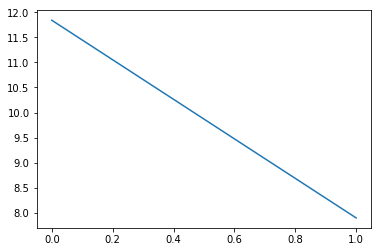


[2] accuracy: 0.947 loss: 7.899

runtime :  262.93299984931946
Train
[3, 00020] loss: 2.029 acc: 0.969
[3, 00040] loss: 3.794 acc: 0.972
[3, 00060] loss: 5.556 acc: 0.974
[3, 00080] loss: 7.095 acc: 0.975
[3, 00100] loss: 8.732 acc: 0.975
[3, 00120] loss: 10.511 acc: 0.975
[3, 00140] loss: 11.914 acc: 0.976
[3, 00160] loss: 13.437 acc: 0.976
[3, 00180] loss: 15.014 acc: 0.976
[3, 00200] loss: 16.380 acc: 0.976
[0.786953125, 0.95578125, 0.97640625]
[123.87349117547274, 28.854025166481733, 16.38015726581216]


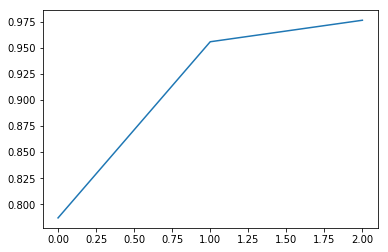

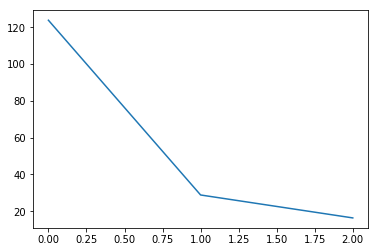

Validation
[0.9209375, 0.946875, 0.9609375]
[11.838936403393745, 7.899137392640114, 5.662443086504936]


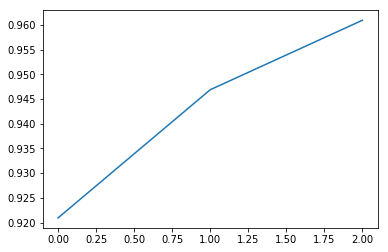

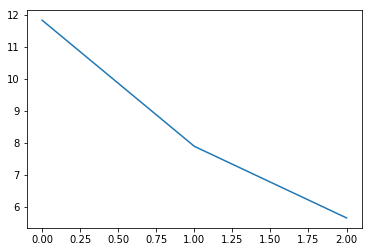


[3] accuracy: 0.961 loss: 5.662

runtime :  394.86250138282776
Train
[4, 00020] loss: 1.378 acc: 0.982
[4, 00040] loss: 2.486 acc: 0.983
[4, 00060] loss: 3.727 acc: 0.983
[4, 00080] loss: 4.763 acc: 0.983
[4, 00100] loss: 5.776 acc: 0.984
[4, 00120] loss: 6.793 acc: 0.983
[4, 00140] loss: 8.136 acc: 0.983
[4, 00160] loss: 9.110 acc: 0.983
[4, 00180] loss: 10.150 acc: 0.984
[4, 00200] loss: 11.078 acc: 0.984
[0.786953125, 0.95578125, 0.97640625, 0.9840625]
[123.87349117547274, 28.854025166481733, 16.38015726581216, 11.078045301139355]


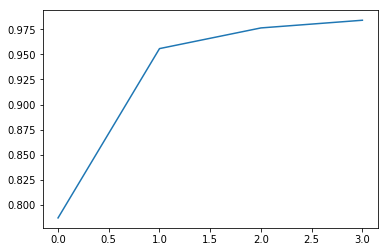

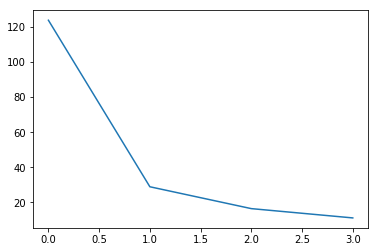

Validation
[0.9209375, 0.946875, 0.9609375, 0.96625]
[11.838936403393745, 7.899137392640114, 5.662443086504936, 5.020834535360336]


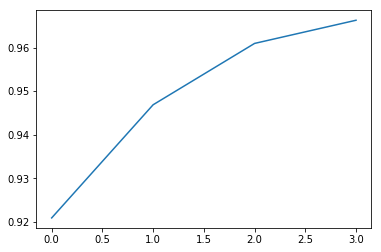

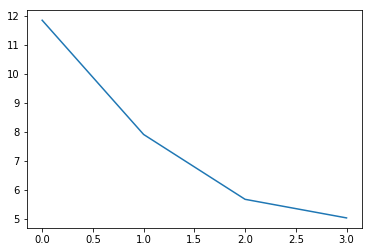


[4] accuracy: 0.966 loss: 5.021

runtime :  526.3344326019287
Train
[5, 00020] loss: 0.997 acc: 0.985
[5, 00040] loss: 1.691 acc: 0.989
[5, 00060] loss: 2.858 acc: 0.986
[5, 00080] loss: 3.724 acc: 0.987
[5, 00100] loss: 4.538 acc: 0.988
[5, 00120] loss: 5.391 acc: 0.988
[5, 00140] loss: 6.048 acc: 0.988
[5, 00160] loss: 6.812 acc: 0.989
[5, 00180] loss: 7.772 acc: 0.988
[5, 00200] loss: 8.448 acc: 0.989
[0.786953125, 0.95578125, 0.97640625, 0.9840625, 0.988671875]
[123.87349117547274, 28.854025166481733, 16.38015726581216, 11.078045301139355, 8.447661241516471]


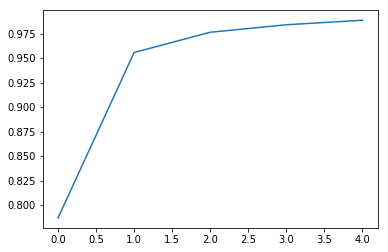

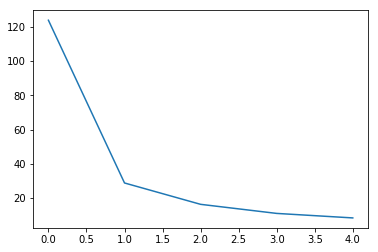

Validation
[0.9209375, 0.946875, 0.9609375, 0.96625, 0.97125]
[11.838936403393745, 7.899137392640114, 5.662443086504936, 5.020834535360336, 4.413106143474579]


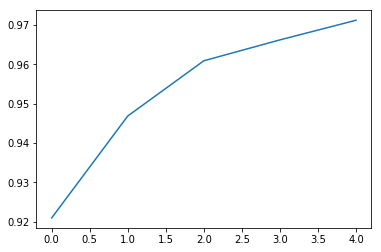

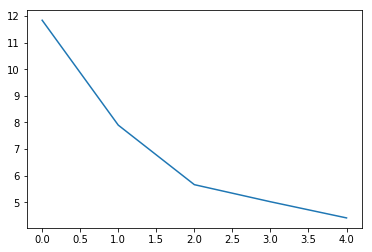


[5] accuracy: 0.971 loss: 4.413

runtime :  658.1584966182709
Train
[6, 00020] loss: 0.615 acc: 0.992
[6, 00040] loss: 1.184 acc: 0.993
[6, 00060] loss: 1.891 acc: 0.992
[6, 00080] loss: 2.363 acc: 0.994
[6, 00100] loss: 3.094 acc: 0.993
[6, 00120] loss: 3.758 acc: 0.992
[6, 00140] loss: 4.539 acc: 0.992
[6, 00160] loss: 5.059 acc: 0.993
[6, 00180] loss: 5.557 acc: 0.993
[6, 00200] loss: 6.200 acc: 0.993
[0.786953125, 0.95578125, 0.97640625, 0.9840625, 0.988671875, 0.9925]
[123.87349117547274, 28.854025166481733, 16.38015726581216, 11.078045301139355, 8.447661241516471, 6.200404569506645]


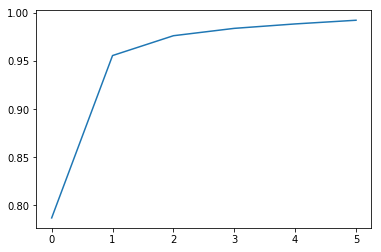

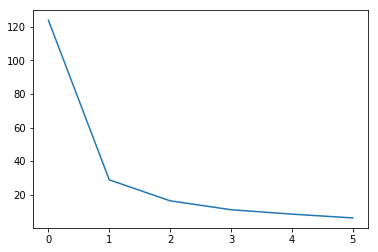

Validation
[0.9209375, 0.946875, 0.9609375, 0.96625, 0.97125, 0.971875]
[11.838936403393745, 7.899137392640114, 5.662443086504936, 5.020834535360336, 4.413106143474579, 4.094917252659798]


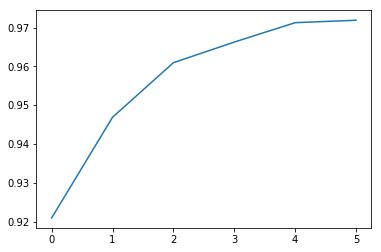

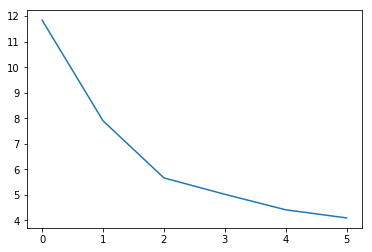


[6] accuracy: 0.972 loss: 4.095

runtime :  789.1996614933014
Train
[7, 00020] loss: 0.603 acc: 0.991
[7, 00040] loss: 1.113 acc: 0.993


In [ ]:
train_acc = []
train_loss = []
val_acc = []
val_loss = []
import time
start_time = time.time()
for epoch in range(EPOCH):
    print("Train")
    total = 0
    correct = 0
    running_loss = 0.0
    for step, (labels, images,_) in enumerate(trainloader):
        optimizer.zero_grad()
#         print("in Train: ", images.shape, labels.shape)
#         images = images.detach()
#         labels = labels.detach()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
        outputs = model(images)
        
        # loss
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        
        # accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        acc = correct / total

        if step % 20 == 19:    # print every 2000 mini-batches
            print('[%d, %05d] loss: %.3f acc: %.3f' %
                  (epoch + 1, step + 1, running_loss, acc))

    train_acc.append(acc)
    train_loss.append(running_loss)
    print(train_acc)
    print(train_loss)
    plt.figure()
    plt.plot(range(0,epoch+1), train_acc)
    plt.savefig(model_directory + "train_acc_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,epoch+1), train_loss)
    plt.savefig(model_directory + "train_loss_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    
    # Evaluate validation set
    print("Validation")
    total = 0
    correct = 0
    running_loss = 0.0
    for step, (labels, images,_) in enumerate(valloader):
        optimizer.zero_grad()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
#         images = images.detach()
#         labels = labels.detach()
        outputs = model(images)
        loss = criterion(outputs, labels)
        _, predicted = torch.max(outputs.data, 1)
        running_loss += loss.item()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        acc = correct / total
    
    val_acc.append(acc)
    val_loss.append(running_loss)
    print(val_acc)
    print(val_loss)
    plt.figure()
    plt.plot(range(0,epoch+1), val_acc)
    plt.savefig(model_directory + "val_acc_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,epoch+1), val_loss)
    plt.savefig(model_directory + "val_loss_E%03d.jpg" % (epoch+1), dpi=500)
    plt.show()
    
    print('\n[%d] accuracy: %.3f loss: %.3f\n' % (epoch + 1, acc, running_loss))
    running_loss = 0.0
    # Saving model
    model_path = PJ(model_directory, "%03d_weights.pt" % (epoch+1))
    torch.save(model.state_dict(), model_path)
    runtime = time.time() - start_time
    print("runtime : ", runtime)

In [35]:
resultfile = open(model_directory+"train_results.txt", "a")
resultfile.write("train")
resultfile.write(str(train_acc))
resultfile.write("\n")
resultfile.write(str(train_loss))
resultfile.write("\n")
resultfile.write("validation")
resultfile.write("\n")
resultfile.write(str(val_acc))
resultfile.write("\n")
resultfile.write(str(val_loss))
resultfile.write("\n")
resultfile.write("runtime : ", runtime)
resultfile.close()

runtime :  38017.49330973625


# TEST
### evaluate
### test every model
### saliency map

In [36]:
transform = transform_set(train=False)
testset = TermiteDataset(TestFile, transform)
testloader = Data.DataLoader(
    dataset=testset,      # torch TensorDataset format
    batch_size=BATCH_SIZE,      # mini batch size
    shuffle=True,               # 要不要打乱数据 (打乱比较好)
    num_workers=0,              # 多线程来读数据
)


[1] accuracy: 0.795 loss: 78.902

[0.79525]
[78.90227195620537]


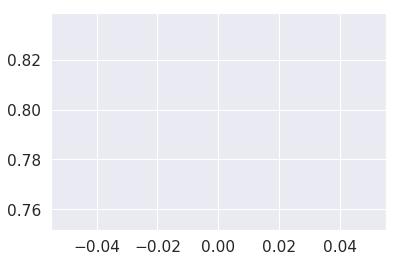

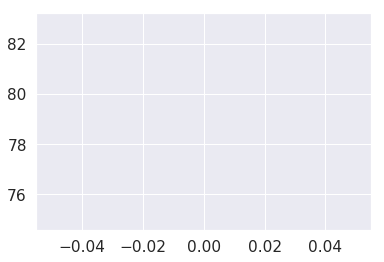

[7, 7, 0, 4, 7, 3, 2, 7, 2, 7, 0, 1, 1, 1, 3, 1, 5, 2, 6, 1, 0, 0, 7, 2, 7, 3, 0, 0, 0, 7, 0, 1, 3, 0, 5, 1, 0, 0, 2, 1, 7, 1, 1, 0, 0, 3, 5, 0, 7, 0, 2, 7, 2, 4, 5, 1, 7, 2, 0, 6, 5, 7, 3, 0, 2, 3, 0, 7, 1, 7, 0, 0, 0, 5, 0, 1, 0, 6, 7, 1, 1, 2, 1, 2, 3, 3, 1, 2, 6, 7, 6, 3, 0, 2, 3, 3, 0, 7, 0, 3, 6, 6, 1, 1, 3, 6, 0, 6, 6, 3, 6, 7, 0, 6, 7, 0, 2, 0, 7, 6, 3, 0, 1, 6, 3, 1, 4, 1, 4, 3, 2, 4, 7, 1, 3, 7, 7, 1, 0, 0, 1, 6, 0, 6, 7, 0, 7, 0, 3, 7, 0, 5, 0, 3, 7, 1, 0, 7, 1, 6, 6, 6, 3, 3, 1, 1, 0, 5, 7, 0, 3, 2, 1, 3, 6, 7, 0, 6, 0, 7, 1, 2, 4, 1, 2, 2, 0, 5, 1, 3, 7, 4, 0, 0, 0, 3, 5, 7, 2, 0, 1, 0, 3, 1, 0, 7, 3, 6, 0, 2, 1, 3, 0, 7, 6, 0, 0, 4, 0, 1, 3, 6, 3, 5, 0, 7, 5, 6, 0, 2, 1, 6, 7, 2, 3, 1, 7, 7, 0, 0, 3, 1, 3, 0, 4, 6, 1, 3, 0, 0, 2, 0, 0, 7, 3, 7, 3, 0, 0, 0, 1, 2, 7, 3, 7, 0, 0, 1, 6, 7, 6, 7, 7, 6, 7, 0, 0, 3, 5, 7, 1, 7, 7, 6, 2, 4, 7, 1, 7, 7, 6, 7, 1, 1, 4, 1, 0, 0, 0, 0, 7, 4, 7, 1, 7, 5, 5, 5, 6, 5, 7, 1, 6, 4, 5, 1, 3, 1, 2, 7, 6, 6, 3, 1, 7, 7, 0, 7, 1, 7, 7, 7, 2, 

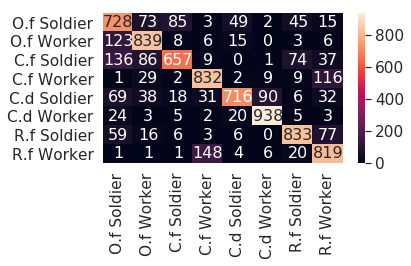

runtime :  231.97979593276978

[2] accuracy: 0.843 loss: 65.223

[0.79525, 0.843375]
[78.90227195620537, 65.22312009334564]


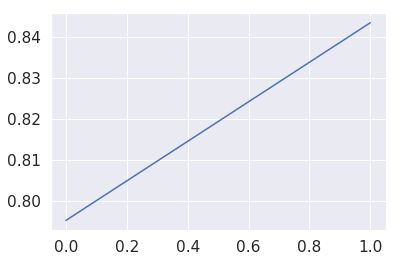

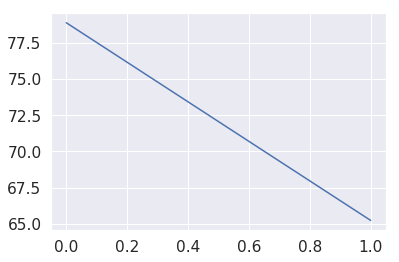

[3, 2, 1, 0, 2, 6, 3, 7, 6, 7, 2, 4, 0, 7, 5, 7, 3, 7, 0, 5, 0, 7, 1, 7, 6, 5, 6, 5, 0, 1, 1, 6, 2, 0, 6, 1, 3, 2, 1, 2, 0, 7, 0, 1, 6, 7, 0, 1, 6, 5, 5, 1, 3, 1, 5, 6, 0, 3, 2, 4, 7, 1, 2, 0, 0, 1, 2, 7, 6, 7, 3, 5, 3, 2, 1, 0, 4, 0, 1, 1, 3, 4, 0, 3, 3, 1, 2, 1, 3, 1, 0, 1, 6, 3, 2, 1, 4, 3, 7, 4, 0, 1, 7, 1, 0, 5, 0, 0, 0, 0, 3, 0, 6, 7, 0, 4, 7, 0, 0, 0, 4, 4, 6, 1, 1, 1, 2, 3, 6, 5, 7, 0, 6, 2, 1, 5, 1, 0, 0, 6, 6, 7, 6, 7, 6, 5, 7, 5, 0, 0, 6, 1, 1, 1, 7, 1, 2, 3, 6, 2, 0, 6, 0, 2, 1, 7, 7, 3, 7, 7, 2, 3, 0, 6, 5, 7, 5, 0, 2, 2, 5, 0, 7, 2, 6, 6, 1, 0, 4, 0, 3, 1, 1, 3, 3, 3, 1, 2, 5, 0, 0, 0, 5, 1, 0, 5, 3, 6, 0, 3, 0, 1, 0, 5, 5, 7, 3, 3, 0, 1, 3, 4, 0, 6, 4, 0, 4, 6, 7, 7, 0, 4, 0, 3, 0, 1, 2, 3, 3, 0, 1, 2, 1, 4, 7, 7, 0, 0, 2, 7, 0, 0, 7, 1, 7, 5, 4, 6, 2, 0, 6, 6, 7, 6, 0, 7, 7, 0, 1, 1, 7, 0, 0, 7, 3, 7, 0, 7, 4, 6, 1, 3, 4, 3, 7, 3, 0, 7, 2, 0, 6, 7, 6, 6, 1, 1, 7, 0, 1, 0, 6, 7, 6, 0, 5, 7, 0, 3, 6, 6, 1, 6, 1, 0, 7, 3, 2, 1, 6, 0, 1, 1, 1, 3, 3, 0, 3, 4, 7, 0, 3, 4, 1, 

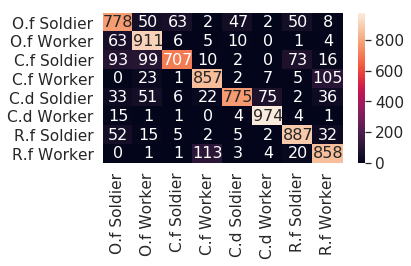

runtime :  465.6997320652008

[3] accuracy: 0.856 loss: 59.953

[0.79525, 0.843375, 0.856125]
[78.90227195620537, 65.22312009334564, 59.95338340103626]


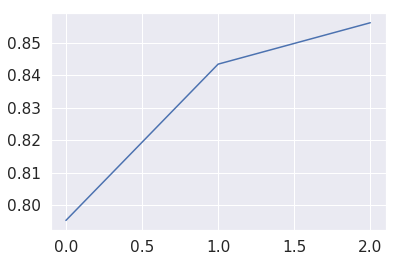

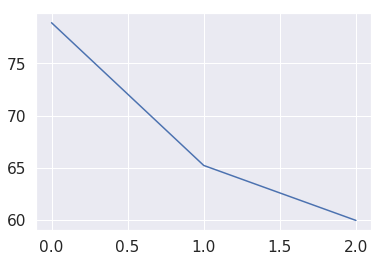

[0, 3, 1, 3, 2, 3, 7, 3, 7, 3, 0, 0, 1, 0, 7, 4, 5, 5, 0, 4, 2, 2, 1, 1, 0, 7, 1, 6, 1, 3, 0, 5, 6, 3, 1, 7, 5, 2, 3, 1, 2, 5, 3, 3, 0, 2, 7, 0, 7, 0, 7, 4, 2, 0, 7, 1, 1, 5, 3, 6, 6, 7, 1, 7, 7, 1, 7, 5, 3, 0, 2, 1, 5, 3, 7, 6, 0, 1, 0, 7, 3, 0, 7, 2, 5, 1, 3, 4, 5, 6, 1, 1, 5, 5, 0, 1, 1, 6, 3, 0, 7, 7, 7, 7, 1, 1, 1, 0, 0, 0, 1, 3, 5, 6, 4, 1, 6, 1, 1, 0, 3, 5, 3, 0, 0, 5, 0, 2, 4, 1, 0, 7, 1, 6, 2, 1, 0, 0, 2, 2, 7, 2, 0, 0, 1, 0, 0, 1, 3, 3, 7, 1, 1, 5, 1, 4, 4, 1, 1, 5, 7, 1, 0, 2, 0, 2, 0, 6, 3, 7, 1, 0, 7, 0, 5, 0, 7, 0, 0, 6, 3, 7, 6, 3, 7, 3, 1, 7, 3, 6, 6, 3, 1, 6, 0, 4, 6, 1, 1, 0, 0, 1, 0, 6, 1, 4, 1, 1, 0, 1, 5, 0, 6, 6, 2, 7, 3, 4, 3, 4, 3, 3, 3, 7, 6, 1, 7, 2, 1, 3, 3, 6, 1, 3, 7, 6, 5, 2, 2, 3, 6, 0, 1, 3, 4, 3, 3, 1, 4, 3, 2, 3, 3, 1, 3, 3, 7, 1, 1, 7, 6, 7, 7, 0, 7, 3, 1, 3, 0, 1, 6, 2, 1, 4, 0, 0, 6, 4, 0, 2, 0, 2, 2, 6, 3, 1, 6, 0, 7, 1, 1, 3, 1, 5, 5, 0, 0, 6, 2, 0, 0, 1, 1, 2, 3, 5, 7, 0, 6, 1, 1, 5, 1, 0, 3, 3, 0, 0, 1, 0, 0, 7, 3, 1, 1, 7, 1, 1, 1, 0, 4, 0, 0, 

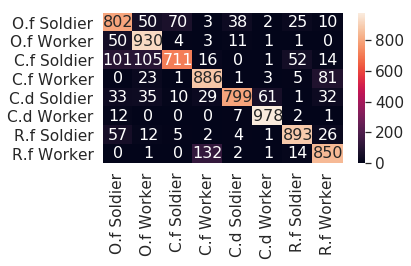

runtime :  700.580855846405

[4] accuracy: 0.864 loss: 57.363

[0.79525, 0.843375, 0.856125, 0.86425]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156]


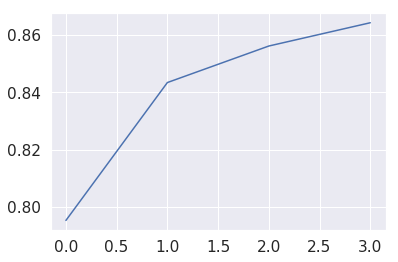

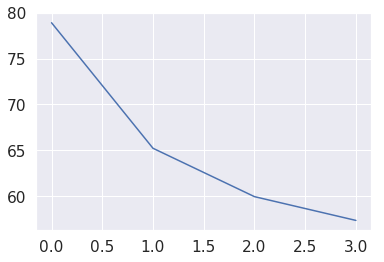

[3, 1, 0, 7, 1, 1, 3, 1, 0, 7, 1, 6, 1, 3, 0, 2, 7, 7, 1, 5, 1, 6, 2, 5, 3, 3, 1, 1, 1, 3, 1, 7, 5, 0, 0, 7, 7, 1, 7, 5, 3, 1, 6, 0, 7, 0, 6, 1, 1, 1, 1, 2, 6, 3, 4, 1, 0, 0, 1, 3, 1, 7, 7, 7, 4, 6, 3, 0, 5, 3, 6, 3, 7, 5, 3, 0, 2, 6, 1, 1, 1, 3, 2, 3, 1, 7, 5, 7, 0, 0, 3, 7, 3, 7, 0, 2, 6, 0, 1, 0, 3, 1, 0, 7, 0, 3, 6, 3, 2, 7, 3, 0, 7, 7, 6, 2, 1, 1, 1, 7, 2, 7, 6, 0, 0, 7, 2, 7, 7, 7, 0, 6, 4, 5, 1, 0, 7, 0, 3, 0, 4, 7, 1, 5, 0, 4, 3, 2, 0, 3, 3, 1, 5, 1, 0, 7, 3, 1, 3, 0, 7, 5, 0, 6, 7, 1, 0, 1, 6, 0, 1, 4, 6, 4, 7, 0, 6, 7, 6, 5, 7, 0, 2, 3, 0, 5, 0, 0, 3, 1, 3, 0, 3, 0, 7, 3, 3, 2, 5, 1, 3, 1, 3, 3, 1, 0, 0, 0, 5, 1, 3, 3, 7, 0, 3, 1, 0, 4, 7, 0, 0, 7, 2, 4, 1, 0, 0, 3, 7, 2, 4, 7, 3, 3, 7, 0, 0, 2, 3, 6, 1, 0, 0, 6, 3, 5, 4, 6, 0, 6, 6, 7, 0, 1, 5, 5, 0, 2, 7, 1, 7, 0, 6, 0, 2, 7, 0, 1, 4, 2, 7, 5, 1, 0, 1, 0, 0, 3, 2, 7, 3, 0, 0, 0, 1, 3, 0, 1, 0, 0, 1, 2, 0, 5, 0, 2, 0, 0, 0, 1, 6, 7, 1, 4, 5, 7, 1, 7, 3, 2, 4, 0, 7, 1, 7, 7, 1, 0, 7, 2, 7, 5, 7, 3, 6, 1, 1, 0, 1, 3, 4, 2, 1, 

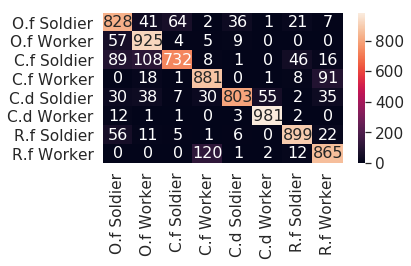

runtime :  933.4799139499664

[5] accuracy: 0.875 loss: 55.744

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913]


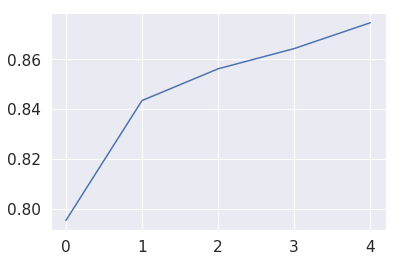

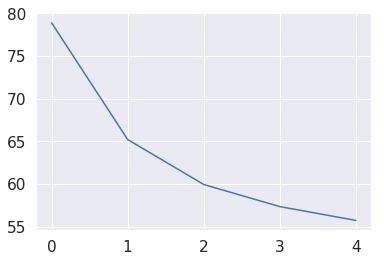

[4, 6, 0, 1, 2, 0, 7, 7, 1, 6, 1, 4, 6, 3, 0, 7, 3, 2, 6, 0, 1, 0, 6, 7, 7, 5, 4, 1, 1, 7, 7, 3, 4, 1, 7, 1, 3, 1, 3, 1, 2, 1, 3, 0, 7, 1, 7, 1, 7, 0, 0, 5, 7, 3, 1, 6, 1, 7, 7, 7, 7, 6, 5, 0, 2, 7, 7, 7, 0, 0, 4, 0, 0, 0, 1, 3, 3, 7, 0, 3, 5, 7, 1, 6, 0, 6, 6, 6, 3, 7, 0, 3, 3, 1, 6, 0, 3, 0, 2, 0, 0, 7, 0, 0, 3, 5, 0, 1, 1, 0, 1, 3, 0, 0, 0, 6, 5, 0, 3, 1, 5, 0, 0, 0, 0, 0, 0, 1, 0, 3, 7, 2, 0, 1, 6, 1, 3, 0, 0, 3, 0, 7, 1, 6, 3, 1, 1, 7, 4, 6, 7, 0, 7, 0, 3, 1, 0, 3, 1, 6, 5, 3, 0, 6, 1, 5, 0, 0, 1, 7, 0, 5, 6, 7, 4, 0, 0, 0, 1, 4, 1, 7, 0, 0, 1, 7, 3, 0, 6, 3, 4, 7, 1, 0, 3, 0, 4, 0, 5, 4, 7, 3, 7, 7, 3, 1, 6, 0, 1, 1, 7, 0, 0, 1, 3, 0, 6, 3, 0, 7, 3, 7, 0, 7, 6, 7, 0, 0, 0, 0, 7, 6, 6, 6, 2, 7, 7, 1, 6, 1, 7, 6, 1, 0, 3, 5, 7, 0, 0, 3, 0, 1, 1, 0, 1, 7, 0, 5, 7, 4, 1, 6, 1, 4, 3, 3, 6, 0, 0, 7, 7, 0, 0, 0, 7, 1, 7, 3, 1, 0, 0, 0, 0, 7, 5, 1, 4, 7, 1, 2, 6, 0, 7, 1, 0, 6, 5, 7, 7, 5, 0, 0, 6, 0, 1, 0, 3, 3, 3, 3, 6, 3, 3, 2, 6, 0, 1, 7, 7, 0, 0, 5, 0, 6, 5, 7, 7, 6, 6, 3, 0, 6, 1, 

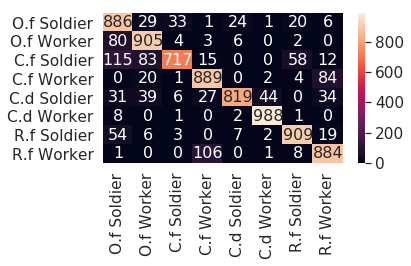

runtime :  1166.7099032402039

[6] accuracy: 0.877 loss: 54.268

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054]


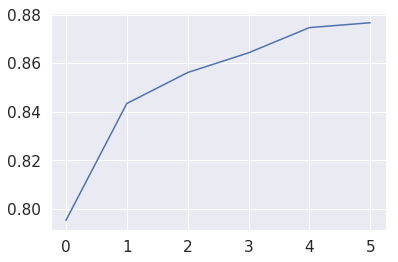

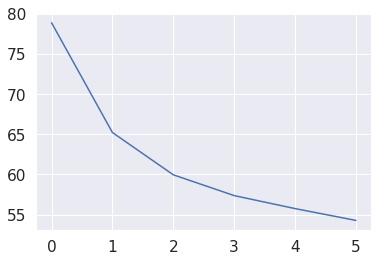

[4, 5, 3, 2, 1, 1, 0, 4, 7, 0, 1, 6, 1, 7, 3, 3, 0, 0, 0, 0, 3, 1, 3, 2, 3, 3, 0, 0, 1, 0, 7, 2, 1, 1, 3, 0, 0, 2, 2, 0, 0, 0, 1, 6, 7, 1, 2, 3, 1, 0, 6, 2, 7, 0, 0, 1, 1, 1, 2, 1, 7, 0, 5, 1, 3, 0, 3, 3, 3, 5, 7, 2, 3, 1, 7, 6, 0, 3, 2, 5, 3, 6, 3, 3, 2, 0, 7, 0, 7, 6, 3, 1, 2, 2, 2, 1, 6, 5, 0, 7, 4, 2, 6, 3, 7, 0, 1, 3, 7, 3, 7, 5, 2, 2, 1, 0, 1, 7, 7, 3, 1, 0, 1, 7, 7, 0, 7, 5, 0, 0, 3, 7, 3, 0, 1, 1, 4, 6, 7, 1, 1, 0, 7, 3, 2, 5, 7, 3, 6, 0, 1, 1, 7, 3, 7, 3, 1, 6, 7, 1, 4, 1, 2, 7, 0, 7, 0, 0, 4, 3, 1, 0, 0, 3, 4, 3, 3, 3, 0, 2, 3, 0, 0, 3, 3, 1, 3, 3, 3, 7, 7, 1, 0, 7, 0, 1, 3, 2, 3, 0, 1, 3, 3, 1, 6, 0, 5, 0, 7, 3, 5, 3, 3, 1, 7, 1, 1, 1, 4, 1, 0, 1, 5, 6, 6, 6, 0, 5, 6, 6, 0, 7, 2, 0, 0, 4, 7, 1, 3, 0, 0, 7, 2, 7, 1, 0, 7, 3, 2, 0, 2, 1, 1, 3, 2, 1, 0, 1, 7, 7, 3, 0, 0, 1, 1, 0, 1, 0, 3, 3, 7, 0, 3, 0, 3, 3, 1, 2, 0, 5, 3, 0, 6, 3, 3, 1, 0, 1, 4, 6, 3, 7, 1, 5, 7, 7, 7, 3, 6, 1, 4, 1, 6, 3, 0, 6, 1, 3, 1, 6, 3, 3, 0, 1, 0, 0, 7, 2, 0, 7, 0, 7, 7, 3, 1, 4, 1, 4, 1, 6, 1, 0, 2, 

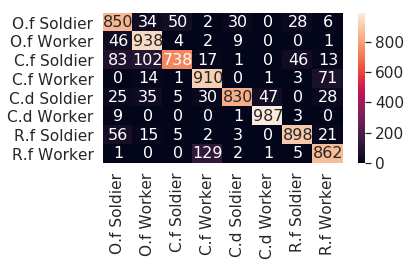

runtime :  1398.8775615692139

[7] accuracy: 0.876 loss: 54.331

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905]


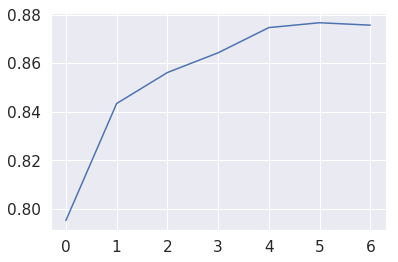

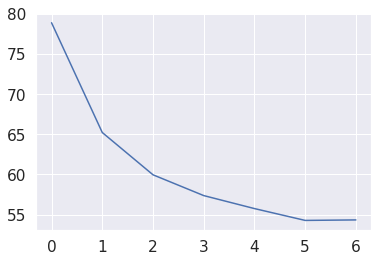

[1, 0, 1, 2, 1, 3, 0, 0, 3, 1, 3, 3, 1, 2, 5, 1, 0, 7, 6, 2, 6, 3, 7, 2, 7, 1, 0, 4, 0, 0, 7, 0, 6, 6, 1, 6, 6, 6, 7, 0, 3, 3, 0, 2, 0, 7, 1, 1, 1, 1, 1, 3, 0, 4, 3, 7, 7, 5, 0, 2, 0, 7, 1, 7, 6, 1, 7, 7, 3, 0, 1, 1, 3, 7, 1, 0, 6, 1, 2, 7, 1, 1, 6, 2, 4, 1, 1, 5, 1, 0, 3, 1, 1, 3, 7, 1, 6, 1, 1, 1, 4, 0, 7, 0, 1, 1, 3, 1, 0, 1, 0, 0, 0, 0, 3, 4, 3, 3, 6, 4, 3, 7, 1, 6, 3, 3, 0, 6, 2, 0, 3, 0, 3, 0, 0, 1, 0, 2, 5, 2, 0, 0, 1, 1, 0, 1, 6, 1, 1, 1, 2, 6, 6, 5, 3, 7, 3, 1, 6, 2, 0, 7, 1, 3, 3, 3, 3, 2, 2, 3, 6, 2, 0, 0, 3, 0, 1, 5, 0, 0, 1, 3, 0, 2, 3, 7, 3, 0, 0, 0, 6, 0, 2, 6, 6, 7, 7, 7, 0, 7, 6, 0, 2, 1, 4, 0, 1, 6, 0, 1, 6, 7, 3, 0, 0, 1, 3, 0, 3, 0, 4, 5, 0, 0, 0, 3, 3, 0, 7, 2, 7, 2, 6, 5, 3, 1, 7, 3, 6, 1, 7, 6, 0, 7, 7, 5, 0, 1, 2, 0, 2, 5, 1, 0, 0, 1, 7, 3, 4, 4, 2, 7, 4, 3, 1, 6, 7, 0, 6, 7, 0, 0, 0, 0, 5, 1, 7, 7, 0, 7, 7, 7, 6, 1, 3, 3, 7, 7, 3, 1, 6, 6, 2, 0, 1, 3, 7, 7, 7, 0, 7, 2, 3, 3, 1, 0, 5, 1, 0, 3, 1, 7, 0, 2, 3, 3, 7, 1, 1, 7, 3, 6, 1, 2, 7, 6, 1, 0, 1, 3, 5, 7, 6, 

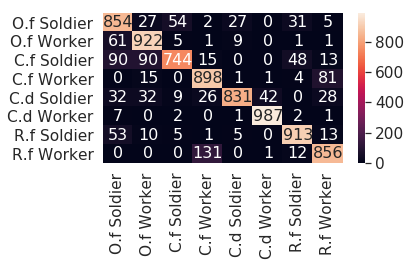

runtime :  1632.4731209278107

[8] accuracy: 0.884 loss: 52.618

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285]


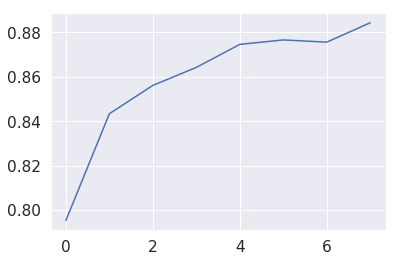

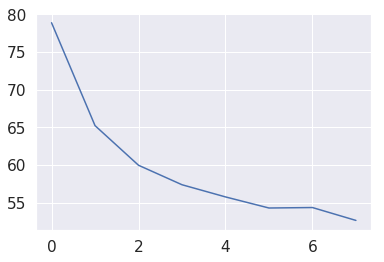

[7, 0, 7, 0, 1, 1, 7, 1, 4, 7, 0, 1, 6, 7, 6, 1, 5, 4, 6, 0, 1, 0, 7, 2, 7, 6, 3, 7, 1, 0, 7, 0, 4, 0, 0, 7, 3, 7, 0, 7, 7, 3, 1, 2, 7, 3, 2, 3, 0, 1, 3, 3, 7, 0, 2, 0, 0, 4, 7, 7, 1, 6, 6, 0, 1, 5, 3, 3, 6, 7, 4, 4, 1, 1, 6, 3, 6, 0, 4, 3, 1, 4, 3, 1, 0, 1, 0, 5, 6, 3, 5, 3, 5, 0, 0, 0, 3, 0, 0, 6, 6, 3, 7, 4, 1, 0, 1, 0, 4, 0, 3, 1, 5, 7, 0, 2, 0, 0, 6, 1, 0, 0, 1, 7, 1, 7, 0, 3, 2, 3, 0, 6, 6, 1, 7, 1, 3, 4, 4, 7, 1, 2, 1, 3, 0, 1, 3, 3, 6, 3, 3, 1, 1, 3, 3, 3, 0, 7, 2, 0, 7, 5, 7, 6, 1, 3, 0, 0, 1, 7, 6, 7, 0, 6, 0, 1, 0, 3, 5, 0, 0, 1, 0, 7, 3, 2, 4, 3, 3, 0, 1, 5, 3, 0, 7, 3, 6, 1, 3, 1, 1, 1, 1, 3, 7, 1, 6, 3, 0, 5, 3, 3, 3, 0, 0, 7, 0, 3, 0, 3, 0, 6, 1, 0, 2, 5, 6, 0, 4, 1, 2, 7, 1, 6, 0, 4, 0, 6, 2, 0, 7, 3, 4, 6, 0, 4, 7, 0, 0, 1, 1, 3, 7, 1, 1, 1, 6, 1, 3, 0, 5, 7, 0, 5, 4, 0, 1, 1, 1, 7, 7, 1, 1, 3, 0, 7, 3, 0, 7, 0, 7, 1, 7, 0, 1, 4, 3, 3, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 4, 1, 3, 0, 1, 1, 7, 7, 0, 1, 3, 0, 4, 7, 3, 1, 3, 1, 3, 3, 0, 2, 3, 1, 0, 3, 2, 0, 2, 3, 2, 1, 3, 1, 1, 

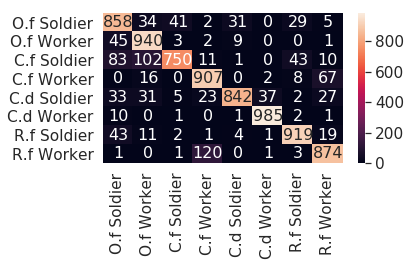

runtime :  1863.8713610172272

[9] accuracy: 0.884 loss: 52.946

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796]


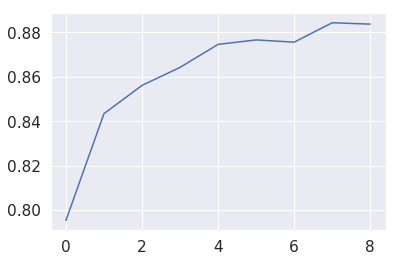

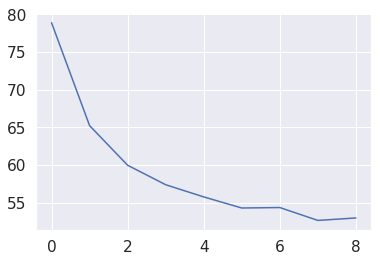

[3, 0, 5, 1, 0, 7, 1, 1, 3, 1, 3, 0, 3, 3, 1, 1, 1, 7, 3, 4, 0, 0, 0, 1, 7, 6, 0, 1, 4, 6, 0, 0, 3, 3, 7, 0, 0, 0, 6, 1, 7, 3, 1, 7, 6, 7, 4, 3, 7, 7, 0, 0, 1, 7, 1, 3, 0, 0, 0, 2, 1, 3, 1, 1, 3, 3, 0, 0, 0, 3, 1, 6, 6, 3, 3, 0, 1, 2, 3, 0, 3, 1, 2, 3, 0, 2, 7, 1, 1, 0, 6, 7, 0, 7, 6, 6, 6, 1, 1, 7, 1, 0, 6, 3, 0, 3, 7, 3, 4, 0, 0, 4, 7, 1, 1, 7, 7, 7, 6, 7, 6, 0, 1, 3, 0, 2, 6, 0, 0, 3, 2, 0, 6, 1, 2, 7, 2, 3, 0, 1, 3, 2, 5, 1, 1, 6, 0, 5, 0, 0, 0, 3, 3, 5, 0, 3, 0, 1, 1, 3, 5, 7, 2, 2, 1, 3, 0, 7, 7, 1, 6, 0, 0, 0, 7, 6, 5, 6, 7, 7, 1, 3, 2, 0, 0, 0, 0, 0, 7, 1, 7, 3, 1, 6, 0, 1, 6, 1, 7, 3, 6, 6, 4, 7, 2, 0, 7, 3, 1, 4, 7, 5, 2, 1, 6, 6, 6, 1, 5, 0, 7, 0, 3, 0, 3, 0, 1, 0, 7, 5, 0, 2, 0, 2, 7, 6, 2, 7, 5, 6, 4, 4, 0, 4, 2, 1, 3, 2, 0, 1, 7, 0, 3, 1, 0, 1, 5, 1, 1, 0, 1, 1, 3, 1, 3, 7, 0, 3, 3, 3, 2, 7, 3, 0, 0, 7, 6, 2, 1, 3, 7, 1, 2, 7, 0, 4, 7, 7, 3, 3, 0, 7, 0, 6, 1, 1, 0, 0, 5, 4, 7, 0, 6, 6, 3, 6, 2, 3, 3, 0, 7, 7, 0, 3, 4, 0, 1, 7, 0, 7, 1, 7, 5, 7, 0, 2, 0, 1, 3, 1, 1, 0, 0, 

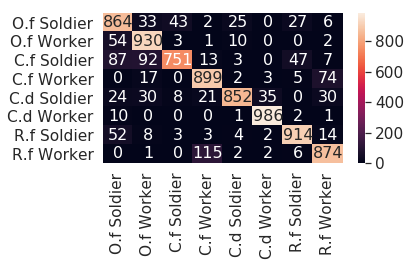

runtime :  2099.043872833252

[10] accuracy: 0.890 loss: 53.047

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283]


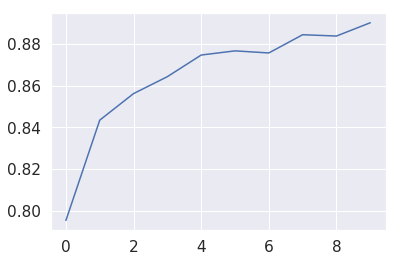

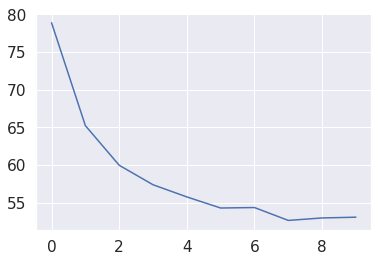

[6, 1, 5, 6, 2, 7, 6, 2, 1, 0, 1, 1, 7, 3, 7, 1, 4, 3, 3, 7, 4, 7, 6, 6, 3, 3, 0, 3, 0, 3, 1, 1, 0, 0, 0, 2, 1, 0, 1, 4, 0, 7, 7, 0, 3, 0, 0, 7, 0, 7, 0, 6, 5, 0, 0, 3, 7, 0, 3, 0, 3, 7, 0, 0, 7, 3, 5, 0, 0, 0, 0, 4, 1, 3, 6, 0, 1, 1, 0, 6, 7, 3, 3, 1, 3, 1, 3, 0, 6, 2, 6, 1, 3, 6, 1, 1, 4, 2, 3, 5, 1, 1, 3, 0, 0, 6, 3, 4, 0, 2, 2, 1, 2, 6, 2, 3, 7, 7, 2, 7, 6, 3, 7, 2, 0, 3, 0, 2, 7, 0, 1, 6, 0, 0, 2, 6, 0, 0, 6, 3, 0, 2, 0, 7, 3, 0, 0, 6, 7, 6, 3, 1, 5, 0, 5, 3, 1, 6, 0, 2, 6, 1, 3, 5, 3, 0, 7, 0, 1, 3, 4, 3, 1, 7, 7, 1, 7, 6, 0, 7, 0, 1, 7, 7, 7, 7, 1, 7, 3, 0, 2, 1, 1, 1, 3, 7, 1, 1, 0, 0, 4, 3, 0, 3, 6, 1, 3, 1, 2, 3, 1, 1, 0, 3, 0, 7, 0, 1, 1, 3, 3, 2, 6, 1, 7, 0, 5, 2, 6, 3, 7, 1, 4, 1, 5, 1, 7, 7, 0, 0, 0, 6, 7, 1, 1, 3, 7, 6, 2, 3, 0, 1, 1, 1, 3, 0, 0, 1, 7, 6, 7, 1, 7, 7, 6, 7, 0, 0, 0, 0, 6, 1, 7, 6, 7, 3, 6, 0, 3, 0, 6, 4, 3, 5, 2, 7, 0, 0, 1, 0, 6, 6, 0, 6, 1, 4, 0, 1, 7, 2, 1, 1, 3, 3, 7, 7, 0, 6, 1, 0, 3, 6, 6, 3, 5, 7, 0, 0, 4, 6, 3, 2, 1, 1, 3, 1, 3, 0, 0, 0, 3, 1, 1, 

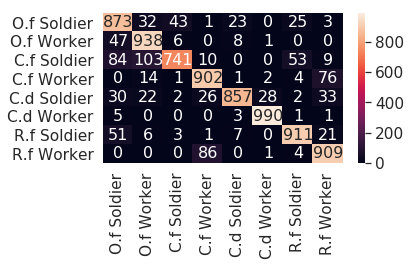

runtime :  2331.4928925037384

[11] accuracy: 0.887 loss: 52.730

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276]


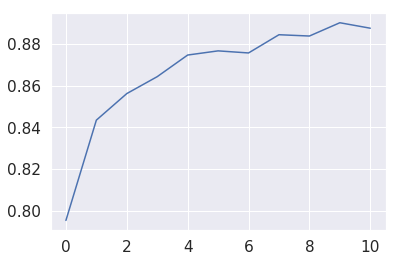

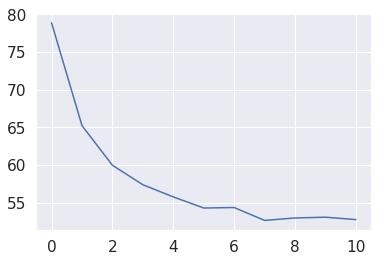

[1, 7, 7, 0, 0, 1, 6, 6, 2, 2, 2, 0, 0, 3, 1, 7, 3, 6, 7, 1, 7, 7, 2, 1, 0, 0, 0, 1, 3, 0, 4, 7, 0, 7, 1, 1, 3, 2, 7, 0, 1, 0, 4, 3, 0, 2, 1, 7, 6, 0, 6, 3, 0, 6, 7, 0, 6, 6, 4, 6, 7, 4, 6, 4, 0, 0, 1, 7, 7, 0, 0, 0, 5, 3, 7, 0, 1, 0, 2, 7, 0, 1, 6, 0, 1, 1, 0, 3, 1, 0, 2, 7, 0, 0, 3, 0, 1, 1, 0, 0, 1, 0, 0, 7, 7, 0, 6, 0, 4, 0, 6, 3, 6, 5, 0, 1, 1, 4, 0, 3, 1, 0, 1, 1, 0, 7, 6, 1, 5, 0, 2, 0, 7, 7, 0, 0, 4, 7, 4, 6, 2, 7, 1, 6, 7, 6, 7, 6, 2, 1, 0, 1, 0, 3, 2, 0, 0, 4, 5, 3, 5, 6, 6, 0, 0, 3, 5, 1, 1, 6, 4, 4, 7, 3, 0, 3, 3, 1, 3, 3, 6, 7, 1, 0, 0, 1, 6, 3, 7, 7, 1, 7, 1, 4, 1, 0, 0, 3, 2, 7, 2, 1, 7, 3, 6, 1, 3, 3, 7, 2, 1, 4, 6, 1, 4, 4, 1, 7, 1, 3, 0, 2, 3, 1, 0, 5, 0, 3, 1, 1, 3, 0, 1, 1, 3, 3, 3, 3, 6, 1, 0, 0, 3, 7, 0, 0, 7, 1, 0, 0, 1, 0, 3, 4, 3, 3, 1, 3, 3, 5, 2, 3, 1, 0, 1, 6, 1, 1, 6, 0, 0, 0, 3, 1, 6, 3, 5, 6, 7, 3, 0, 6, 0, 4, 1, 0, 3, 7, 0, 3, 1, 6, 2, 0, 0, 4, 0, 0, 0, 5, 0, 7, 7, 1, 0, 0, 2, 5, 7, 1, 1, 7, 0, 7, 5, 1, 2, 1, 3, 1, 0, 1, 3, 1, 0, 1, 0, 4, 6, 1, 7, 7, 7, 

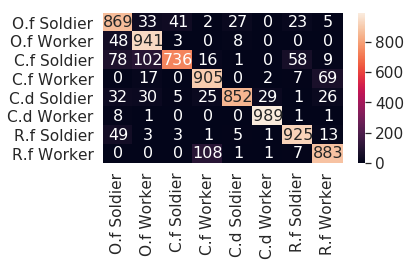

runtime :  2564.6388235092163

[12] accuracy: 0.889 loss: 52.896

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762]


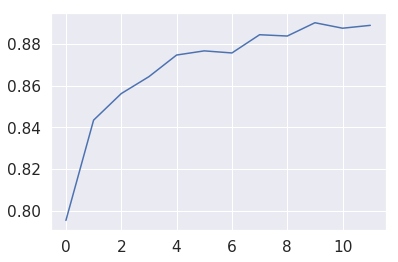

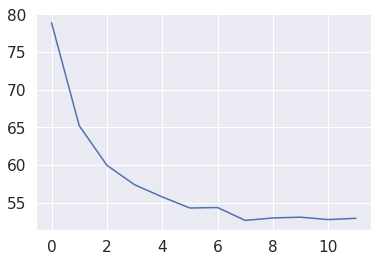

[3, 2, 6, 0, 4, 7, 6, 0, 7, 3, 3, 0, 1, 0, 0, 6, 3, 1, 7, 0, 7, 1, 0, 0, 7, 7, 0, 6, 3, 6, 0, 0, 0, 6, 6, 0, 0, 1, 0, 7, 6, 1, 0, 0, 0, 7, 6, 6, 7, 3, 7, 6, 6, 0, 3, 1, 1, 0, 4, 1, 1, 1, 4, 1, 2, 0, 3, 1, 0, 1, 6, 3, 1, 4, 0, 6, 0, 6, 7, 7, 7, 7, 3, 4, 7, 4, 7, 2, 7, 3, 7, 1, 7, 0, 0, 6, 3, 3, 3, 1, 4, 7, 7, 6, 0, 1, 2, 7, 4, 7, 3, 0, 1, 2, 6, 1, 5, 3, 4, 1, 0, 0, 7, 1, 0, 3, 5, 4, 0, 1, 7, 2, 7, 6, 1, 0, 1, 1, 6, 5, 7, 1, 6, 3, 7, 6, 3, 1, 3, 1, 3, 3, 3, 3, 6, 7, 3, 2, 6, 1, 7, 0, 1, 3, 0, 6, 2, 6, 5, 3, 2, 1, 1, 4, 7, 3, 1, 3, 1, 1, 3, 2, 7, 0, 7, 1, 7, 1, 1, 0, 0, 4, 0, 5, 0, 6, 3, 0, 3, 3, 0, 7, 7, 0, 3, 0, 3, 1, 2, 7, 3, 0, 2, 3, 7, 3, 0, 1, 0, 0, 3, 0, 4, 0, 0, 0, 7, 0, 2, 0, 0, 7, 0, 2, 1, 0, 1, 2, 7, 5, 7, 7, 0, 0, 0, 3, 2, 5, 6, 7, 1, 7, 6, 1, 0, 6, 7, 0, 0, 4, 3, 6, 0, 7, 3, 6, 1, 4, 7, 1, 7, 0, 5, 7, 0, 0, 3, 0, 6, 5, 7, 1, 5, 0, 0, 3, 7, 2, 1, 3, 3, 2, 1, 2, 3, 7, 2, 1, 0, 0, 0, 2, 1, 0, 6, 7, 0, 1, 3, 0, 2, 1, 0, 0, 3, 3, 0, 2, 0, 0, 1, 6, 6, 7, 3, 1, 1, 0, 0, 1, 6, 0, 7, 

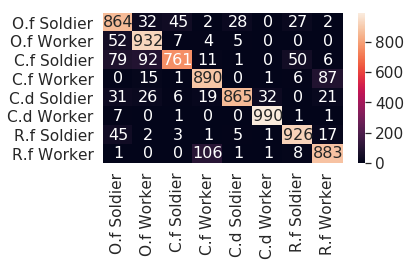

runtime :  2797.2510538101196

[13] accuracy: 0.893 loss: 52.064

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835]


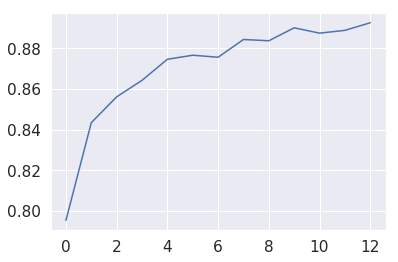

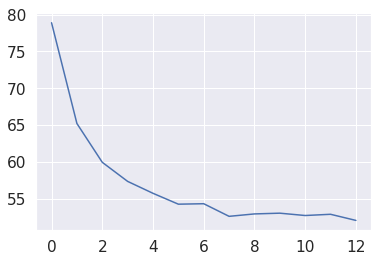

[0, 3, 6, 1, 4, 1, 0, 6, 3, 1, 1, 7, 3, 7, 6, 1, 7, 1, 1, 6, 5, 2, 6, 6, 1, 1, 3, 1, 1, 7, 3, 0, 6, 1, 1, 7, 7, 7, 2, 6, 7, 2, 3, 4, 3, 1, 6, 2, 1, 6, 0, 0, 3, 1, 3, 6, 0, 7, 3, 6, 6, 6, 0, 0, 0, 4, 1, 5, 2, 1, 1, 0, 0, 7, 2, 0, 6, 6, 1, 4, 4, 1, 4, 3, 3, 0, 7, 2, 3, 3, 3, 3, 1, 3, 3, 6, 0, 0, 4, 7, 1, 1, 2, 0, 0, 4, 6, 7, 6, 1, 0, 6, 0, 0, 3, 0, 3, 3, 3, 2, 7, 1, 2, 0, 3, 6, 0, 1, 1, 7, 2, 3, 7, 2, 0, 1, 7, 0, 0, 5, 1, 0, 7, 1, 3, 0, 7, 4, 7, 1, 2, 0, 1, 0, 6, 5, 4, 1, 7, 1, 0, 2, 6, 3, 3, 7, 1, 0, 2, 2, 3, 4, 3, 1, 3, 1, 6, 2, 2, 0, 3, 3, 0, 3, 0, 7, 1, 0, 0, 6, 0, 7, 1, 0, 0, 1, 0, 0, 7, 6, 3, 1, 7, 6, 6, 7, 4, 0, 2, 0, 1, 2, 3, 0, 1, 1, 0, 7, 1, 1, 7, 0, 7, 7, 3, 7, 6, 2, 3, 0, 7, 1, 1, 0, 3, 4, 3, 3, 7, 0, 1, 1, 7, 0, 7, 6, 3, 0, 0, 6, 0, 7, 7, 1, 3, 0, 1, 1, 3, 1, 6, 4, 3, 0, 1, 1, 3, 0, 3, 7, 0, 0, 6, 7, 1, 7, 7, 0, 5, 6, 4, 6, 7, 0, 1, 3, 7, 7, 6, 7, 5, 0, 1, 6, 3, 5, 1, 4, 4, 7, 2, 0, 1, 1, 7, 1, 3, 0, 3, 0, 3, 0, 3, 3, 7, 1, 7, 1, 1, 7, 0, 1, 0, 1, 2, 0, 1, 4, 0, 2, 1, 1, 7, 

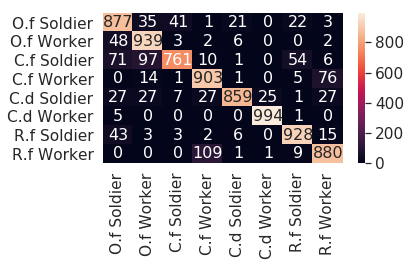

runtime :  3028.3950622081757

[14] accuracy: 0.890 loss: 53.250

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157]


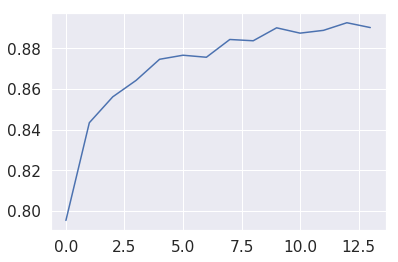

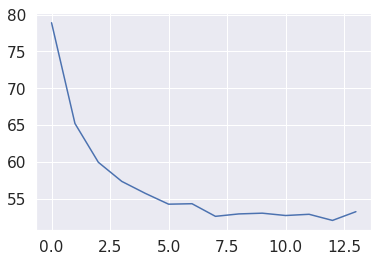

[1, 7, 7, 1, 1, 1, 3, 0, 0, 0, 2, 2, 6, 7, 0, 6, 7, 2, 0, 0, 0, 1, 1, 6, 2, 0, 6, 2, 3, 1, 0, 0, 0, 5, 0, 3, 6, 6, 3, 0, 3, 2, 3, 4, 0, 3, 7, 3, 7, 1, 2, 1, 1, 7, 6, 7, 3, 0, 1, 7, 7, 4, 7, 3, 4, 1, 3, 2, 0, 0, 2, 1, 6, 7, 0, 3, 0, 6, 3, 1, 0, 1, 0, 5, 1, 1, 5, 3, 1, 1, 3, 4, 7, 7, 1, 0, 3, 0, 3, 6, 6, 6, 6, 5, 0, 7, 5, 7, 3, 1, 6, 7, 1, 6, 5, 3, 7, 7, 0, 7, 3, 2, 7, 3, 0, 4, 7, 6, 3, 0, 1, 6, 6, 2, 1, 1, 7, 1, 1, 3, 4, 7, 6, 2, 3, 0, 7, 2, 0, 0, 0, 3, 1, 7, 1, 6, 3, 0, 7, 4, 3, 3, 0, 7, 0, 6, 1, 6, 0, 7, 4, 0, 1, 3, 1, 7, 3, 3, 1, 1, 0, 0, 7, 1, 6, 3, 7, 1, 1, 2, 0, 1, 4, 7, 7, 0, 1, 5, 3, 4, 2, 0, 1, 3, 7, 0, 7, 7, 7, 1, 7, 0, 2, 7, 2, 0, 0, 2, 1, 1, 1, 3, 2, 5, 0, 1, 0, 7, 3, 0, 0, 0, 4, 3, 2, 2, 3, 3, 0, 6, 2, 4, 3, 6, 0, 7, 6, 0, 3, 7, 0, 7, 4, 3, 1, 0, 0, 7, 0, 7, 1, 6, 4, 2, 0, 7, 0, 3, 5, 0, 0, 3, 0, 7, 2, 7, 5, 1, 0, 0, 1, 1, 3, 6, 2, 2, 7, 7, 6, 7, 7, 0, 6, 0, 5, 2, 1, 7, 0, 6, 7, 7, 0, 6, 0, 0, 7, 1, 3, 0, 2, 4, 1, 0, 0, 0, 0, 0, 0, 7, 0, 0, 3, 6, 1, 3, 7, 7, 1, 0, 2, 6, 7, 

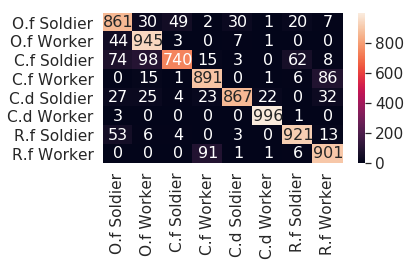

runtime :  3260.762279510498

[15] accuracy: 0.891 loss: 52.242

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145]


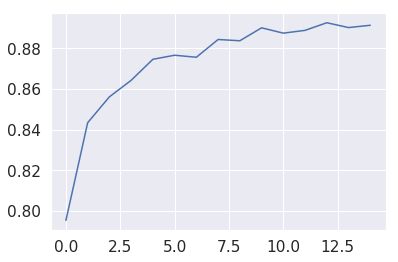

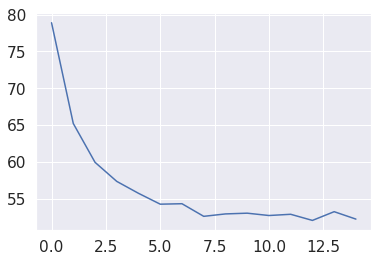

[0, 7, 7, 0, 7, 0, 3, 1, 2, 0, 0, 6, 0, 1, 0, 3, 0, 3, 0, 7, 0, 2, 4, 4, 6, 6, 4, 0, 6, 0, 3, 1, 0, 0, 3, 1, 0, 7, 1, 7, 3, 3, 6, 1, 1, 3, 0, 1, 2, 1, 3, 1, 0, 1, 5, 0, 0, 1, 1, 1, 0, 7, 7, 0, 5, 0, 7, 7, 0, 7, 4, 4, 2, 7, 7, 1, 7, 7, 7, 1, 3, 7, 0, 0, 3, 1, 6, 1, 1, 6, 1, 4, 1, 0, 1, 3, 3, 7, 2, 0, 3, 3, 0, 3, 3, 0, 7, 1, 1, 2, 1, 6, 1, 1, 6, 0, 1, 3, 3, 1, 3, 3, 0, 3, 0, 7, 3, 0, 0, 0, 0, 7, 0, 1, 1, 7, 0, 1, 1, 7, 2, 1, 3, 0, 3, 0, 1, 0, 0, 3, 3, 0, 7, 7, 3, 1, 1, 4, 3, 1, 1, 6, 0, 7, 6, 1, 3, 3, 6, 6, 2, 7, 3, 6, 3, 0, 7, 2, 1, 3, 3, 1, 7, 7, 0, 3, 0, 3, 7, 0, 2, 1, 0, 3, 1, 2, 2, 5, 1, 0, 2, 1, 6, 3, 3, 7, 1, 0, 0, 7, 5, 3, 6, 6, 4, 3, 6, 1, 3, 1, 3, 2, 2, 0, 0, 6, 3, 2, 4, 3, 1, 7, 2, 2, 7, 0, 1, 3, 1, 5, 1, 0, 0, 7, 0, 0, 1, 1, 3, 3, 7, 7, 0, 0, 4, 1, 3, 6, 2, 0, 6, 7, 1, 3, 4, 3, 1, 3, 6, 7, 0, 7, 3, 0, 3, 0, 1, 3, 6, 6, 3, 5, 3, 3, 3, 0, 0, 7, 3, 5, 1, 7, 3, 6, 0, 7, 7, 6, 0, 0, 1, 6, 3, 0, 0, 1, 2, 7, 0, 0, 6, 1, 1, 1, 1, 2, 1, 3, 0, 2, 7, 6, 0, 7, 3, 3, 0, 2, 6, 1, 6, 3, 3, 

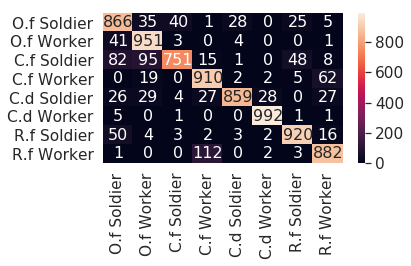

runtime :  3494.6006619930267

[16] accuracy: 0.894 loss: 50.564

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261]


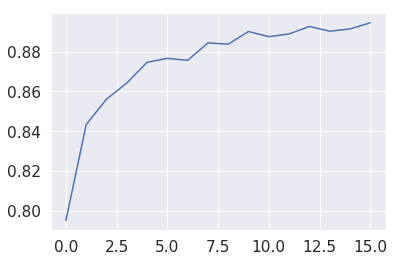

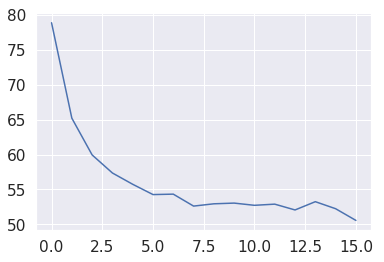

[7, 4, 3, 0, 0, 1, 1, 0, 3, 1, 0, 0, 1, 6, 5, 0, 6, 0, 2, 7, 0, 0, 3, 3, 7, 3, 1, 3, 6, 0, 0, 5, 3, 1, 0, 2, 3, 1, 1, 0, 4, 0, 7, 0, 2, 0, 2, 0, 3, 1, 3, 2, 4, 0, 7, 7, 1, 7, 1, 2, 3, 3, 0, 6, 3, 7, 0, 0, 7, 0, 1, 1, 7, 6, 1, 1, 0, 3, 6, 7, 3, 3, 3, 0, 1, 1, 0, 0, 3, 0, 7, 7, 1, 5, 3, 7, 7, 2, 2, 3, 3, 0, 3, 1, 4, 1, 6, 4, 3, 1, 0, 7, 7, 3, 0, 1, 0, 6, 1, 0, 4, 7, 3, 1, 6, 2, 0, 0, 3, 0, 6, 3, 1, 0, 0, 0, 0, 3, 3, 4, 0, 3, 3, 3, 7, 0, 3, 7, 0, 1, 1, 6, 0, 4, 6, 1, 2, 6, 3, 6, 7, 0, 6, 1, 0, 0, 7, 3, 0, 0, 4, 7, 3, 1, 0, 6, 1, 3, 3, 1, 1, 1, 1, 0, 1, 3, 3, 2, 0, 0, 0, 6, 0, 4, 3, 7, 7, 7, 6, 6, 0, 7, 1, 2, 0, 6, 3, 0, 3, 3, 1, 0, 7, 7, 1, 2, 7, 6, 0, 1, 5, 3, 4, 1, 1, 3, 0, 7, 6, 0, 2, 0, 1, 3, 2, 7, 7, 0, 6, 1, 0, 6, 6, 5, 1, 0, 1, 0, 0, 5, 1, 7, 3, 0, 7, 7, 0, 2, 4, 2, 0, 0, 6, 7, 0, 3, 7, 1, 1, 3, 0, 6, 0, 7, 1, 0, 0, 5, 1, 1, 7, 1, 3, 3, 1, 0, 0, 2, 0, 0, 7, 2, 0, 7, 1, 0, 6, 1, 3, 0, 0, 2, 0, 0, 7, 7, 1, 1, 2, 0, 7, 1, 0, 7, 0, 4, 7, 1, 5, 5, 3, 1, 3, 0, 7, 6, 7, 3, 1, 0, 1, 3, 4, 

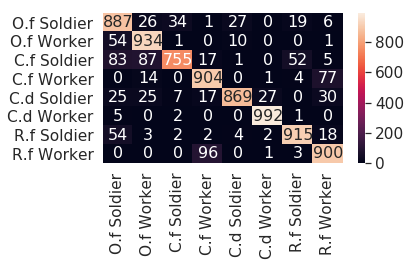

runtime :  3728.7163887023926

[17] accuracy: 0.898 loss: 50.784

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731]


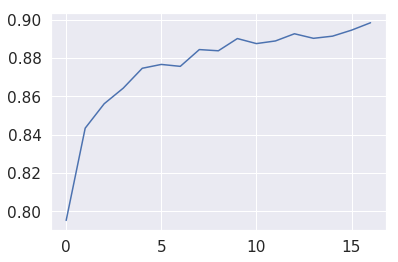

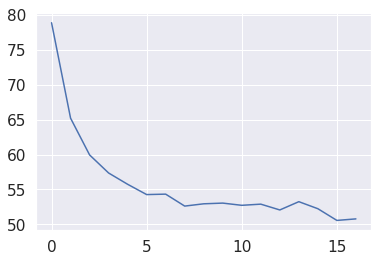

[1, 7, 1, 0, 0, 6, 6, 1, 7, 1, 3, 1, 0, 1, 2, 3, 0, 0, 4, 7, 4, 3, 0, 1, 7, 0, 5, 3, 7, 0, 0, 1, 4, 0, 3, 6, 1, 1, 1, 1, 6, 1, 0, 1, 0, 3, 0, 3, 1, 6, 7, 1, 4, 7, 6, 3, 0, 1, 3, 3, 3, 7, 6, 0, 6, 7, 6, 6, 6, 7, 0, 0, 2, 6, 0, 3, 2, 7, 6, 0, 0, 3, 7, 0, 7, 3, 5, 6, 1, 7, 4, 3, 2, 1, 5, 3, 1, 3, 3, 3, 4, 0, 4, 0, 7, 7, 3, 0, 0, 6, 1, 6, 2, 6, 0, 7, 0, 3, 0, 1, 0, 1, 3, 1, 5, 1, 0, 3, 3, 1, 1, 7, 7, 1, 1, 1, 1, 0, 0, 7, 5, 1, 1, 0, 1, 7, 4, 2, 3, 3, 1, 7, 0, 7, 6, 0, 7, 0, 0, 0, 6, 7, 1, 7, 1, 0, 1, 0, 2, 0, 1, 7, 1, 0, 0, 0, 7, 3, 3, 6, 6, 6, 7, 3, 2, 3, 7, 3, 3, 0, 1, 6, 1, 2, 1, 6, 6, 7, 7, 6, 1, 4, 2, 3, 3, 0, 0, 3, 1, 2, 3, 1, 2, 7, 0, 7, 3, 0, 6, 1, 6, 1, 1, 6, 1, 6, 3, 0, 5, 1, 1, 7, 7, 3, 0, 2, 1, 0, 6, 3, 1, 3, 4, 1, 1, 1, 1, 7, 3, 1, 3, 0, 0, 3, 1, 3, 1, 4, 3, 5, 0, 3, 0, 3, 0, 0, 1, 3, 3, 7, 3, 3, 3, 1, 4, 7, 1, 1, 1, 1, 1, 3, 3, 3, 5, 4, 6, 5, 0, 1, 7, 0, 7, 3, 7, 1, 7, 1, 0, 0, 6, 1, 6, 2, 3, 0, 0, 1, 2, 7, 1, 3, 5, 3, 6, 7, 0, 7, 7, 2, 1, 6, 1, 4, 0, 7, 3, 6, 0, 0, 0, 3, 3, 

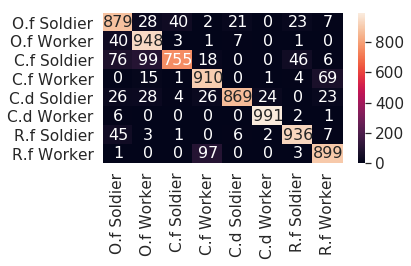

runtime :  3960.1405148506165

[18] accuracy: 0.896 loss: 52.266

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988]


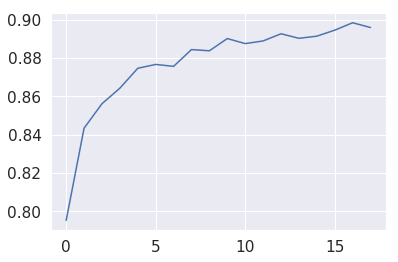

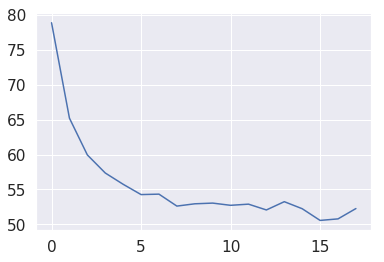

[4, 0, 1, 0, 0, 3, 0, 3, 6, 1, 6, 0, 7, 3, 1, 6, 0, 0, 7, 1, 7, 6, 6, 1, 0, 0, 0, 1, 5, 3, 6, 3, 1, 0, 3, 1, 6, 4, 3, 6, 4, 6, 0, 3, 6, 1, 1, 3, 6, 3, 7, 1, 1, 3, 0, 2, 7, 4, 1, 7, 5, 0, 7, 6, 1, 1, 0, 0, 0, 6, 0, 3, 0, 2, 3, 1, 0, 1, 1, 1, 0, 5, 2, 0, 3, 1, 1, 5, 1, 3, 3, 0, 0, 3, 1, 6, 0, 6, 7, 3, 1, 5, 1, 0, 0, 0, 1, 3, 7, 3, 1, 7, 2, 3, 3, 7, 0, 0, 1, 0, 4, 1, 0, 7, 3, 5, 1, 1, 2, 7, 2, 1, 0, 1, 3, 2, 1, 3, 0, 1, 3, 3, 3, 2, 0, 3, 5, 4, 0, 0, 3, 3, 0, 1, 0, 3, 1, 3, 3, 7, 4, 3, 2, 4, 3, 1, 7, 7, 3, 6, 3, 6, 1, 1, 6, 6, 1, 6, 3, 5, 6, 7, 1, 1, 7, 3, 1, 7, 2, 1, 7, 0, 3, 5, 3, 3, 1, 4, 7, 0, 7, 7, 5, 0, 0, 1, 2, 1, 0, 2, 0, 1, 3, 1, 7, 2, 1, 5, 5, 0, 0, 0, 1, 7, 6, 7, 3, 6, 0, 3, 0, 6, 7, 7, 0, 7, 4, 7, 4, 1, 7, 7, 3, 0, 1, 0, 6, 6, 1, 3, 4, 6, 3, 0, 3, 3, 2, 0, 1, 3, 1, 7, 7, 0, 6, 6, 5, 2, 7, 7, 5, 3, 1, 0, 3, 7, 0, 3, 1, 0, 0, 3, 0, 0, 1, 4, 3, 0, 3, 6, 1, 7, 3, 7, 0, 7, 1, 2, 3, 5, 7, 3, 0, 0, 1, 3, 0, 7, 4, 3, 0, 7, 0, 0, 1, 5, 1, 1, 3, 7, 6, 2, 1, 0, 0, 4, 7, 6, 2, 0, 2, 7, 1, 

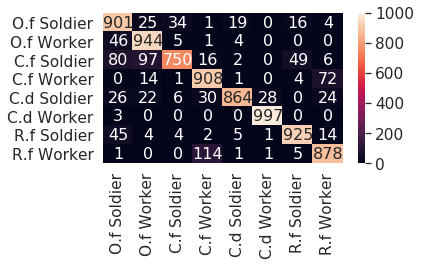

runtime :  4195.070954322815

[19] accuracy: 0.896 loss: 51.994

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801]


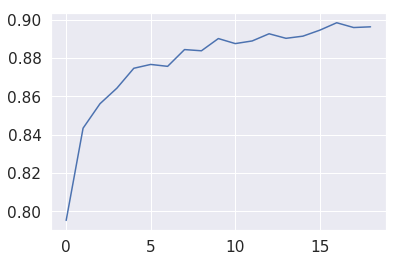

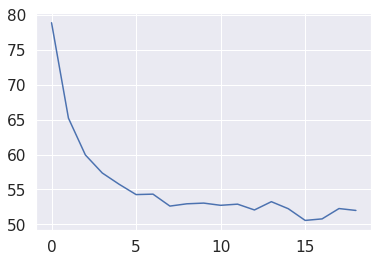

[1, 0, 7, 2, 3, 3, 7, 3, 2, 6, 6, 7, 0, 3, 3, 6, 6, 6, 3, 3, 2, 0, 1, 3, 6, 1, 3, 1, 7, 3, 4, 3, 1, 0, 1, 0, 0, 6, 2, 6, 5, 2, 3, 3, 6, 3, 0, 1, 0, 0, 6, 1, 7, 1, 0, 3, 0, 6, 7, 3, 0, 0, 7, 1, 4, 0, 6, 0, 7, 0, 0, 0, 0, 1, 0, 1, 3, 0, 7, 0, 0, 2, 5, 3, 7, 7, 6, 3, 2, 3, 1, 6, 0, 1, 1, 3, 7, 3, 0, 1, 5, 0, 7, 0, 0, 0, 6, 6, 0, 2, 6, 1, 7, 6, 2, 0, 7, 7, 7, 7, 0, 6, 7, 4, 1, 3, 0, 3, 4, 0, 1, 3, 0, 5, 1, 0, 7, 1, 0, 0, 0, 7, 0, 1, 0, 7, 1, 0, 7, 0, 1, 0, 5, 0, 1, 0, 1, 1, 1, 2, 3, 6, 7, 7, 3, 0, 7, 1, 3, 1, 6, 3, 1, 3, 3, 3, 1, 0, 1, 5, 1, 1, 4, 2, 0, 0, 1, 3, 4, 7, 7, 1, 3, 1, 6, 7, 0, 0, 2, 3, 7, 0, 3, 1, 1, 0, 7, 6, 7, 3, 4, 2, 3, 3, 6, 1, 0, 3, 0, 4, 0, 7, 4, 1, 1, 0, 7, 7, 3, 0, 3, 0, 1, 0, 3, 0, 0, 2, 6, 3, 1, 0, 4, 0, 7, 0, 1, 6, 7, 7, 7, 1, 3, 7, 3, 3, 1, 0, 6, 3, 0, 3, 7, 0, 6, 1, 3, 4, 0, 0, 1, 3, 2, 1, 0, 6, 0, 0, 6, 1, 1, 2, 0, 7, 1, 0, 0, 3, 7, 1, 2, 3, 6, 6, 3, 7, 0, 7, 7, 6, 1, 1, 3, 2, 3, 7, 6, 3, 0, 4, 3, 3, 3, 2, 7, 1, 3, 1, 0, 0, 0, 7, 5, 3, 3, 0, 5, 2, 0, 6, 0, 1, 4, 

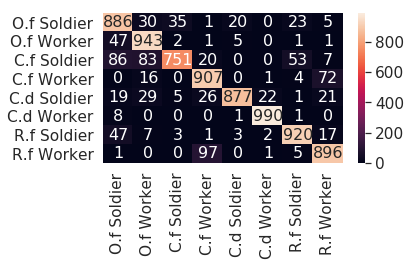

runtime :  4429.051431894302

[20] accuracy: 0.893 loss: 53.731

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685]


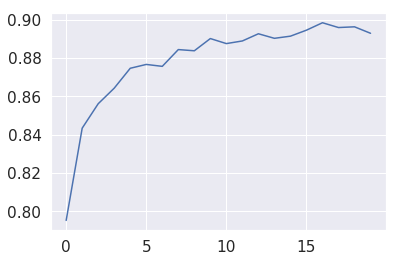

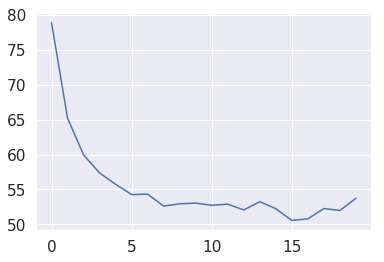

[1, 3, 1, 1, 1, 1, 3, 3, 0, 7, 3, 1, 1, 4, 0, 1, 1, 3, 5, 0, 1, 0, 1, 0, 0, 3, 1, 0, 3, 0, 1, 0, 7, 1, 0, 5, 6, 6, 2, 0, 0, 4, 3, 1, 4, 0, 0, 6, 7, 1, 0, 7, 2, 7, 2, 3, 5, 7, 6, 1, 5, 2, 1, 2, 0, 0, 3, 0, 2, 1, 1, 3, 3, 5, 2, 6, 3, 7, 0, 7, 1, 2, 1, 1, 1, 3, 0, 2, 3, 1, 7, 6, 5, 5, 3, 1, 3, 3, 3, 6, 7, 1, 1, 3, 2, 1, 0, 0, 6, 7, 0, 1, 0, 7, 7, 6, 6, 6, 6, 0, 0, 0, 3, 1, 7, 3, 2, 3, 4, 0, 1, 6, 0, 0, 6, 0, 0, 1, 6, 1, 7, 3, 7, 0, 7, 3, 0, 0, 1, 7, 0, 3, 0, 0, 0, 4, 7, 1, 0, 3, 0, 0, 0, 0, 7, 1, 3, 0, 0, 0, 1, 1, 0, 2, 1, 1, 7, 0, 7, 7, 0, 2, 6, 3, 6, 1, 2, 7, 7, 7, 6, 7, 0, 6, 1, 0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 1, 1, 3, 3, 1, 7, 2, 7, 1, 6, 4, 1, 0, 1, 4, 0, 3, 3, 0, 0, 1, 5, 6, 5, 1, 0, 6, 3, 0, 0, 1, 2, 2, 2, 6, 3, 3, 0, 0, 6, 6, 0, 1, 3, 0, 0, 6, 1, 6, 3, 6, 6, 6, 7, 0, 0, 0, 4, 7, 7, 0, 0, 2, 3, 1, 0, 0, 0, 0, 7, 1, 0, 4, 0, 2, 0, 0, 0, 1, 1, 1, 2, 3, 6, 0, 0, 1, 1, 7, 1, 1, 0, 6, 0, 1, 3, 0, 1, 4, 7, 5, 3, 0, 5, 0, 3, 1, 7, 7, 7, 0, 7, 5, 7, 5, 3, 6, 3, 3, 3, 0, 1, 0, 7, 2, 0, 3, 1, 

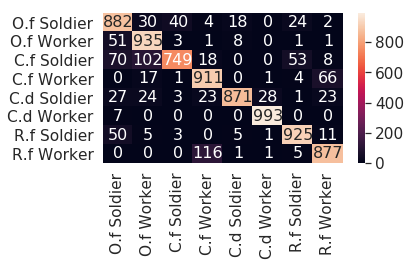

runtime :  4662.111480474472

[21] accuracy: 0.899 loss: 51.221

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339]


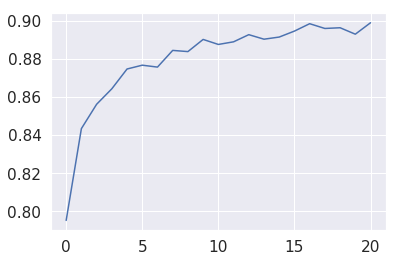

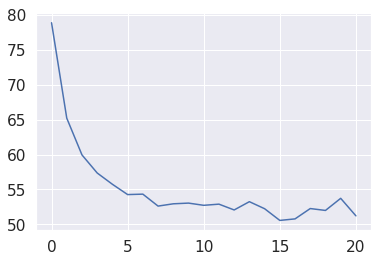

[0, 1, 7, 4, 3, 7, 5, 7, 7, 0, 0, 4, 1, 3, 1, 1, 1, 7, 5, 3, 1, 3, 1, 4, 0, 2, 7, 7, 0, 7, 1, 3, 6, 2, 3, 3, 3, 7, 0, 3, 4, 7, 1, 3, 7, 7, 0, 7, 0, 0, 1, 0, 2, 0, 7, 1, 0, 1, 6, 1, 1, 3, 1, 1, 7, 0, 0, 0, 5, 6, 3, 1, 6, 5, 5, 1, 0, 7, 5, 3, 6, 0, 6, 6, 2, 0, 1, 0, 7, 0, 0, 0, 7, 1, 6, 0, 1, 7, 0, 7, 5, 0, 3, 1, 7, 3, 6, 3, 7, 0, 7, 4, 1, 1, 3, 1, 0, 0, 0, 7, 1, 6, 7, 0, 0, 0, 3, 3, 7, 1, 1, 0, 1, 3, 1, 4, 0, 6, 6, 6, 3, 3, 0, 5, 1, 1, 1, 0, 6, 0, 1, 7, 1, 3, 1, 3, 1, 7, 0, 3, 3, 6, 0, 7, 7, 1, 0, 6, 7, 2, 3, 4, 1, 0, 1, 1, 4, 0, 1, 3, 7, 2, 2, 7, 1, 7, 1, 3, 1, 4, 0, 3, 0, 1, 6, 6, 6, 0, 7, 4, 1, 7, 0, 1, 6, 0, 1, 2, 2, 3, 7, 0, 3, 0, 7, 5, 7, 2, 1, 0, 6, 6, 6, 1, 1, 7, 3, 1, 6, 4, 7, 3, 2, 7, 0, 1, 0, 2, 3, 0, 3, 3, 0, 7, 0, 0, 0, 3, 7, 1, 1, 1, 1, 1, 0, 0, 1, 7, 1, 0, 7, 3, 3, 0, 0, 1, 2, 1, 3, 3, 2, 1, 5, 7, 3, 7, 1, 4, 1, 3, 3, 0, 0, 0, 0, 0, 1, 3, 0, 0, 1, 0, 4, 0, 3, 3, 1, 4, 5, 6, 1, 3, 0, 6, 3, 1, 0, 4, 1, 4, 0, 6, 7, 4, 0, 1, 0, 1, 3, 2, 0, 2, 7, 6, 6, 3, 3, 7, 1, 3, 3, 6, 1, 

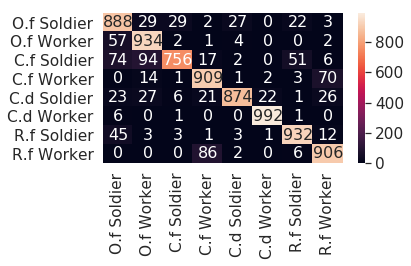

runtime :  4894.737326383591

[22] accuracy: 0.892 loss: 52.708

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209]


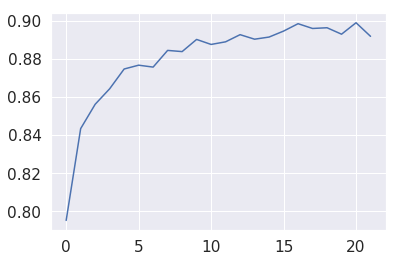

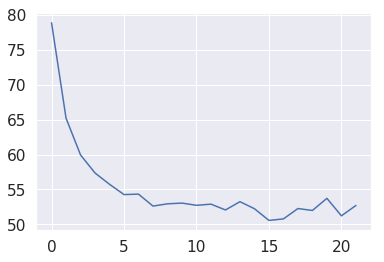

[2, 4, 5, 6, 3, 0, 7, 0, 0, 3, 6, 1, 5, 6, 7, 1, 3, 7, 3, 0, 3, 0, 2, 6, 6, 1, 6, 7, 1, 0, 0, 1, 6, 4, 1, 1, 6, 0, 3, 6, 0, 1, 0, 5, 0, 0, 3, 0, 1, 1, 3, 3, 3, 0, 6, 6, 6, 2, 1, 3, 1, 7, 2, 1, 1, 1, 0, 1, 1, 0, 1, 0, 5, 1, 0, 7, 0, 3, 1, 6, 1, 1, 7, 3, 7, 5, 4, 2, 4, 3, 6, 0, 3, 5, 3, 1, 1, 2, 0, 1, 1, 1, 6, 0, 3, 3, 0, 1, 0, 0, 0, 3, 0, 4, 1, 6, 1, 0, 7, 7, 0, 1, 0, 0, 7, 1, 1, 5, 7, 7, 0, 4, 7, 3, 5, 6, 3, 0, 7, 1, 2, 0, 0, 0, 1, 4, 7, 3, 7, 7, 2, 3, 1, 3, 4, 5, 3, 0, 5, 0, 1, 7, 6, 3, 5, 5, 3, 0, 7, 1, 1, 0, 7, 3, 7, 6, 7, 2, 1, 0, 6, 4, 3, 0, 5, 6, 4, 1, 0, 5, 0, 6, 2, 2, 1, 3, 1, 2, 3, 2, 0, 0, 0, 0, 6, 6, 7, 7, 7, 1, 1, 1, 0, 2, 1, 3, 2, 1, 3, 6, 0, 7, 5, 1, 7, 6, 0, 2, 1, 0, 0, 6, 0, 0, 2, 3, 0, 7, 6, 1, 1, 7, 1, 0, 4, 1, 3, 0, 2, 0, 0, 1, 4, 1, 0, 0, 1, 3, 6, 0, 0, 7, 3, 0, 7, 1, 4, 1, 1, 3, 7, 3, 2, 0, 1, 2, 4, 1, 5, 7, 0, 1, 2, 1, 1, 0, 0, 1, 3, 0, 0, 3, 3, 7, 0, 6, 4, 6, 5, 1, 6, 0, 6, 7, 7, 6, 7, 6, 6, 0, 0, 3, 0, 1, 1, 6, 0, 6, 3, 7, 7, 3, 1, 3, 0, 3, 1, 1, 6, 1, 4, 1, 1, 

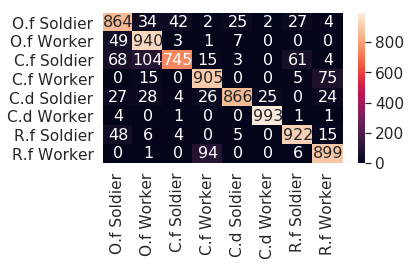

runtime :  5126.43230009079

[23] accuracy: 0.900 loss: 51.686

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096]


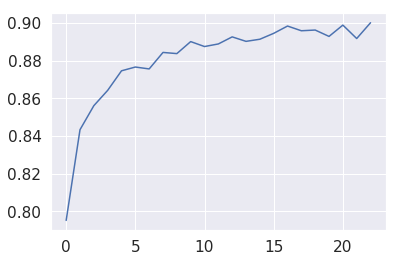

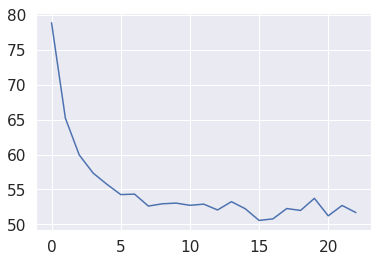

[3, 0, 3, 1, 0, 2, 7, 3, 0, 0, 7, 6, 7, 3, 0, 0, 3, 6, 1, 1, 7, 5, 1, 1, 7, 0, 0, 2, 6, 1, 3, 7, 3, 1, 6, 0, 7, 1, 1, 7, 3, 0, 7, 0, 0, 3, 7, 7, 2, 3, 6, 0, 1, 0, 1, 3, 7, 0, 1, 7, 7, 3, 1, 1, 0, 1, 3, 3, 6, 2, 7, 7, 3, 1, 0, 1, 0, 7, 1, 1, 1, 3, 1, 5, 6, 7, 0, 0, 6, 6, 0, 3, 7, 6, 7, 7, 0, 0, 0, 6, 1, 0, 6, 5, 3, 0, 0, 6, 7, 7, 3, 2, 0, 4, 3, 3, 0, 1, 1, 0, 0, 0, 1, 4, 3, 2, 7, 3, 3, 5, 1, 1, 7, 1, 1, 1, 2, 0, 7, 7, 5, 3, 6, 0, 0, 5, 6, 0, 0, 7, 7, 1, 3, 7, 6, 5, 3, 1, 0, 6, 7, 0, 0, 6, 1, 7, 3, 7, 0, 5, 0, 4, 1, 1, 7, 0, 7, 3, 3, 1, 1, 6, 7, 4, 1, 0, 0, 1, 3, 7, 3, 3, 3, 0, 5, 6, 1, 1, 5, 1, 2, 1, 0, 6, 0, 7, 0, 6, 7, 1, 7, 0, 1, 3, 1, 7, 7, 6, 4, 6, 6, 1, 1, 6, 0, 3, 4, 1, 3, 1, 6, 4, 0, 0, 0, 0, 6, 0, 0, 7, 3, 0, 0, 1, 1, 0, 0, 1, 1, 6, 0, 7, 2, 6, 7, 6, 4, 0, 0, 3, 3, 7, 7, 6, 0, 3, 1, 7, 5, 3, 4, 0, 1, 3, 5, 1, 7, 1, 0, 1, 0, 0, 7, 7, 6, 5, 7, 3, 0, 3, 0, 6, 3, 5, 7, 0, 2, 1, 0, 5, 0, 6, 2, 1, 3, 0, 0, 0, 2, 7, 0, 1, 0, 1, 1, 7, 1, 0, 2, 7, 7, 3, 1, 0, 0, 0, 0, 1, 7, 4, 0, 0, 0, 

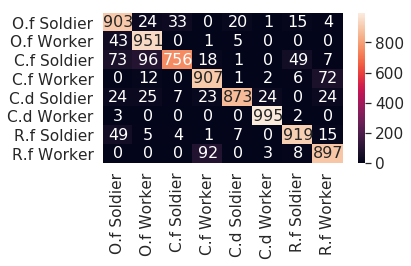

runtime :  5361.799527645111

[24] accuracy: 0.903 loss: 49.544

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274]


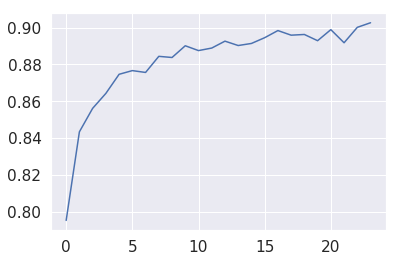

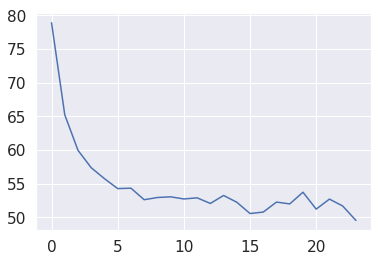

[6, 6, 6, 3, 0, 1, 7, 0, 3, 0, 7, 5, 1, 2, 6, 1, 0, 7, 7, 1, 3, 4, 3, 6, 6, 3, 0, 0, 1, 0, 0, 3, 1, 1, 7, 2, 0, 4, 3, 1, 1, 3, 3, 0, 6, 0, 2, 4, 0, 6, 7, 3, 3, 3, 1, 1, 4, 1, 7, 0, 2, 4, 2, 0, 3, 0, 7, 7, 6, 3, 6, 7, 0, 1, 7, 3, 3, 2, 1, 3, 6, 7, 0, 5, 7, 1, 1, 0, 0, 3, 7, 6, 1, 1, 7, 0, 7, 0, 4, 0, 0, 4, 0, 0, 0, 1, 5, 5, 1, 0, 0, 1, 7, 1, 0, 7, 0, 2, 5, 3, 3, 1, 0, 1, 0, 1, 0, 6, 4, 6, 1, 7, 1, 6, 6, 0, 3, 3, 1, 1, 3, 1, 3, 1, 0, 6, 3, 1, 1, 1, 7, 7, 5, 4, 1, 3, 1, 7, 0, 0, 7, 3, 0, 1, 3, 5, 0, 1, 6, 0, 0, 1, 6, 2, 0, 0, 1, 0, 1, 1, 1, 3, 0, 2, 4, 1, 2, 0, 1, 1, 0, 6, 1, 1, 3, 6, 6, 0, 3, 3, 6, 7, 2, 0, 1, 6, 2, 7, 3, 0, 6, 3, 7, 3, 4, 1, 7, 3, 1, 1, 0, 7, 3, 7, 1, 1, 7, 6, 0, 7, 6, 2, 3, 0, 4, 7, 3, 2, 2, 0, 1, 7, 0, 3, 6, 7, 0, 0, 7, 1, 5, 1, 1, 0, 4, 0, 0, 0, 0, 3, 2, 6, 0, 6, 0, 3, 4, 1, 1, 1, 0, 7, 6, 0, 1, 3, 0, 1, 1, 2, 6, 7, 0, 7, 5, 0, 0, 1, 7, 4, 6, 0, 5, 3, 6, 3, 6, 2, 0, 7, 7, 1, 0, 6, 0, 7, 0, 0, 1, 7, 7, 0, 0, 0, 1, 1, 7, 6, 0, 7, 6, 6, 0, 6, 7, 6, 4, 3, 7, 0, 7, 6, 1, 

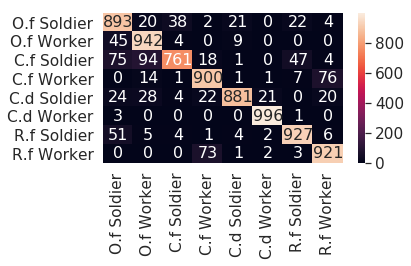

runtime :  5593.738780736923

[25] accuracy: 0.899 loss: 51.410

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342]


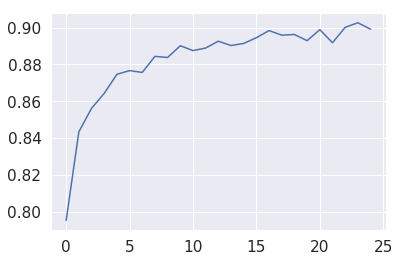

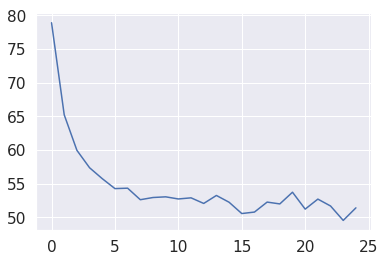

[3, 2, 6, 0, 3, 3, 0, 7, 7, 1, 7, 0, 3, 2, 4, 0, 1, 0, 3, 6, 2, 0, 7, 1, 3, 3, 7, 0, 1, 3, 3, 1, 1, 7, 0, 1, 0, 6, 0, 0, 7, 1, 1, 1, 5, 0, 7, 1, 7, 2, 2, 2, 0, 0, 7, 2, 6, 2, 6, 5, 0, 0, 7, 1, 2, 3, 0, 7, 3, 0, 1, 7, 2, 1, 3, 6, 0, 0, 7, 6, 1, 3, 7, 7, 6, 0, 4, 4, 6, 5, 1, 0, 0, 3, 1, 7, 4, 1, 1, 3, 6, 2, 0, 0, 0, 7, 7, 7, 1, 0, 7, 1, 0, 0, 1, 1, 7, 1, 3, 3, 0, 0, 0, 1, 5, 7, 0, 0, 3, 0, 5, 1, 3, 1, 6, 7, 0, 7, 7, 7, 0, 6, 6, 3, 0, 0, 1, 7, 3, 1, 1, 7, 1, 6, 3, 1, 3, 0, 7, 4, 0, 7, 6, 5, 0, 6, 2, 6, 0, 1, 1, 6, 7, 1, 0, 7, 3, 1, 7, 0, 5, 0, 6, 0, 0, 3, 1, 7, 0, 1, 7, 6, 6, 6, 1, 3, 0, 6, 0, 1, 6, 6, 2, 1, 5, 7, 0, 0, 4, 7, 1, 0, 3, 6, 3, 0, 0, 1, 0, 3, 0, 4, 0, 0, 1, 0, 1, 5, 4, 6, 0, 1, 7, 5, 5, 5, 7, 0, 0, 0, 3, 0, 7, 0, 1, 3, 7, 0, 3, 0, 3, 5, 3, 1, 0, 6, 7, 3, 3, 0, 3, 1, 1, 7, 0, 3, 4, 1, 3, 0, 3, 1, 3, 3, 1, 0, 3, 7, 3, 1, 1, 3, 0, 1, 7, 1, 2, 1, 2, 6, 7, 0, 4, 7, 4, 1, 0, 7, 1, 1, 7, 3, 2, 1, 4, 3, 7, 3, 0, 2, 0, 7, 1, 1, 6, 0, 1, 3, 4, 6, 1, 1, 1, 3, 3, 6, 7, 7, 6, 7, 0, 2, 3, 

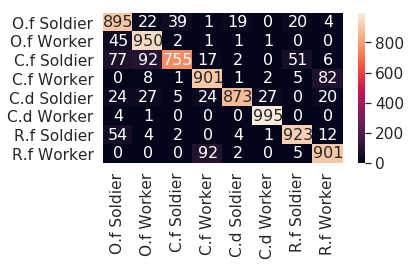

runtime :  5827.335519075394

[26] accuracy: 0.898 loss: 52.657

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664]


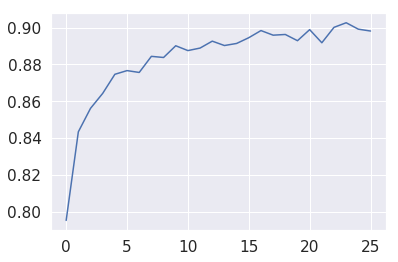

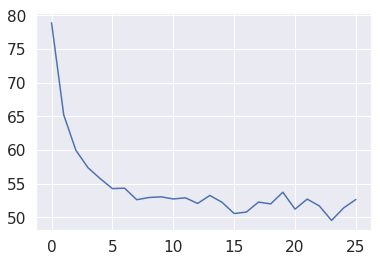

[7, 6, 5, 0, 7, 0, 0, 0, 6, 7, 6, 7, 0, 7, 1, 7, 1, 7, 7, 2, 0, 2, 0, 1, 5, 0, 3, 3, 3, 3, 0, 1, 1, 0, 2, 1, 7, 1, 4, 7, 1, 1, 3, 3, 0, 3, 3, 0, 6, 4, 3, 1, 6, 6, 0, 1, 0, 1, 7, 1, 1, 2, 0, 5, 1, 0, 1, 3, 1, 3, 3, 1, 6, 0, 3, 6, 0, 0, 0, 0, 6, 0, 2, 1, 7, 7, 5, 0, 0, 1, 1, 1, 0, 4, 1, 0, 6, 6, 6, 1, 0, 1, 6, 3, 0, 1, 0, 6, 1, 2, 0, 3, 3, 6, 1, 3, 7, 2, 3, 0, 4, 0, 0, 6, 6, 7, 5, 6, 3, 3, 3, 1, 0, 1, 1, 3, 0, 1, 1, 3, 0, 3, 0, 3, 7, 0, 5, 7, 3, 0, 3, 3, 2, 7, 7, 1, 1, 0, 1, 2, 2, 1, 3, 1, 6, 1, 0, 2, 7, 1, 7, 1, 0, 3, 1, 0, 1, 3, 0, 6, 3, 1, 3, 0, 4, 7, 3, 2, 1, 7, 1, 3, 1, 7, 3, 3, 7, 4, 0, 0, 6, 7, 7, 6, 1, 5, 1, 7, 2, 1, 3, 1, 6, 0, 6, 0, 3, 3, 3, 3, 7, 7, 1, 0, 4, 3, 5, 1, 3, 3, 3, 7, 4, 1, 5, 1, 7, 0, 3, 7, 0, 0, 1, 1, 0, 0, 6, 2, 7, 3, 1, 0, 7, 7, 7, 6, 3, 0, 0, 2, 0, 6, 7, 7, 7, 6, 6, 5, 6, 1, 3, 3, 0, 0, 1, 4, 1, 0, 7, 6, 2, 1, 7, 1, 0, 3, 6, 1, 0, 6, 3, 3, 0, 7, 1, 5, 7, 1, 5, 2, 1, 1, 3, 0, 3, 0, 1, 1, 0, 1, 0, 1, 7, 1, 7, 2, 1, 7, 1, 6, 3, 0, 0, 6, 0, 0, 0, 6, 7, 3, 3, 6, 7, 

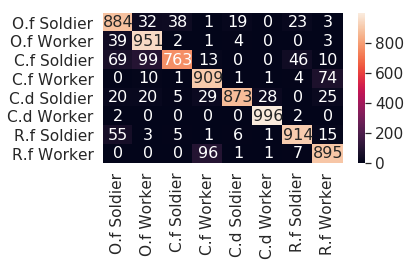

runtime :  6058.0873901844025

[27] accuracy: 0.900 loss: 51.465

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554]


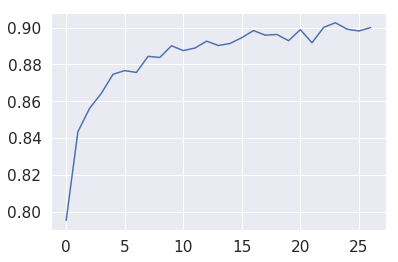

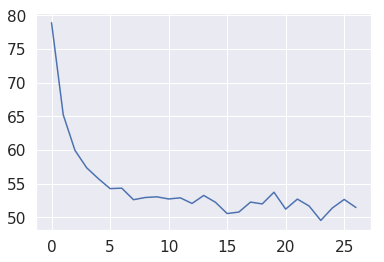

[7, 1, 7, 4, 7, 5, 0, 1, 1, 1, 3, 0, 2, 1, 3, 4, 4, 0, 0, 0, 3, 1, 0, 6, 1, 5, 0, 7, 0, 0, 3, 0, 1, 2, 2, 3, 0, 0, 3, 3, 0, 6, 2, 1, 7, 3, 0, 1, 6, 1, 4, 2, 3, 2, 2, 0, 4, 0, 0, 0, 0, 1, 6, 3, 1, 7, 7, 6, 0, 3, 6, 0, 6, 6, 2, 1, 2, 1, 3, 6, 2, 7, 1, 3, 7, 1, 0, 1, 7, 1, 7, 2, 7, 2, 0, 3, 3, 3, 7, 3, 3, 0, 3, 0, 7, 7, 0, 1, 5, 3, 6, 3, 4, 6, 2, 4, 0, 0, 7, 6, 7, 1, 0, 1, 0, 4, 0, 7, 4, 0, 6, 7, 3, 3, 1, 7, 7, 1, 3, 0, 5, 0, 1, 6, 0, 1, 6, 3, 2, 0, 2, 0, 6, 0, 3, 0, 0, 5, 6, 4, 1, 2, 1, 4, 4, 3, 6, 3, 2, 6, 0, 7, 1, 6, 0, 7, 4, 1, 0, 7, 5, 6, 1, 0, 1, 0, 7, 4, 5, 7, 0, 0, 3, 0, 6, 7, 6, 1, 6, 3, 1, 7, 0, 1, 3, 0, 1, 7, 1, 3, 7, 0, 1, 1, 7, 1, 3, 3, 3, 7, 1, 7, 1, 0, 0, 1, 0, 3, 3, 0, 3, 6, 1, 1, 0, 7, 4, 6, 0, 3, 1, 7, 7, 1, 0, 7, 1, 7, 0, 3, 1, 6, 0, 1, 1, 2, 3, 0, 7, 7, 2, 1, 3, 2, 1, 3, 1, 3, 3, 1, 1, 6, 6, 3, 0, 1, 3, 1, 7, 0, 7, 0, 6, 0, 1, 0, 6, 3, 0, 1, 1, 7, 0, 1, 2, 6, 3, 7, 2, 3, 1, 2, 1, 1, 1, 7, 1, 6, 1, 6, 1, 0, 6, 3, 1, 6, 3, 4, 5, 0, 4, 1, 1, 0, 1, 3, 0, 7, 0, 1, 2, 7, 3, 

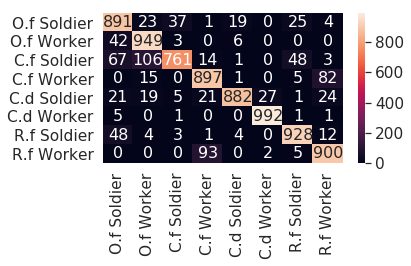

runtime :  6292.604229927063

[28] accuracy: 0.899 loss: 52.867

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585]


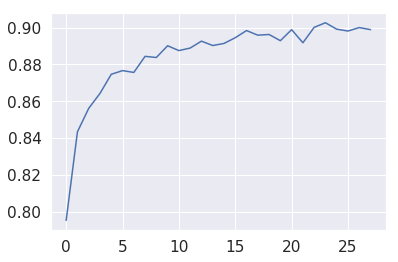

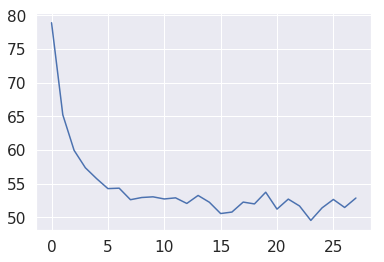

[7, 7, 1, 3, 0, 3, 4, 1, 3, 1, 0, 2, 5, 6, 1, 7, 3, 0, 0, 0, 1, 0, 6, 3, 7, 7, 6, 7, 0, 0, 6, 7, 6, 0, 1, 3, 6, 7, 1, 0, 3, 6, 5, 0, 5, 3, 4, 3, 1, 1, 5, 3, 7, 3, 0, 0, 1, 0, 1, 7, 3, 0, 1, 0, 1, 6, 0, 7, 6, 2, 3, 1, 3, 7, 6, 3, 0, 0, 6, 7, 0, 4, 0, 0, 1, 3, 4, 0, 3, 2, 4, 0, 0, 1, 6, 3, 7, 6, 1, 7, 0, 7, 1, 5, 1, 0, 1, 1, 4, 1, 3, 1, 7, 0, 7, 1, 7, 1, 3, 7, 5, 0, 7, 7, 0, 3, 6, 3, 0, 4, 7, 0, 7, 0, 5, 1, 5, 0, 1, 6, 2, 1, 7, 3, 4, 1, 3, 0, 7, 7, 4, 1, 1, 1, 3, 7, 0, 6, 3, 0, 1, 3, 4, 2, 3, 6, 0, 3, 1, 0, 7, 3, 0, 1, 7, 0, 4, 3, 0, 3, 3, 0, 0, 1, 1, 3, 1, 2, 3, 6, 5, 6, 1, 3, 0, 1, 7, 0, 2, 3, 6, 0, 2, 0, 0, 0, 2, 3, 2, 7, 3, 3, 0, 0, 4, 7, 0, 0, 0, 3, 3, 3, 1, 3, 1, 7, 3, 3, 3, 1, 3, 7, 3, 0, 6, 1, 2, 0, 7, 0, 1, 1, 0, 1, 3, 4, 0, 4, 1, 0, 3, 7, 0, 0, 1, 7, 7, 4, 1, 3, 7, 1, 2, 0, 4, 2, 0, 3, 1, 1, 0, 1, 3, 6, 6, 3, 7, 1, 6, 2, 4, 7, 0, 0, 1, 1, 0, 1, 6, 1, 3, 1, 0, 3, 6, 6, 7, 0, 0, 1, 2, 0, 2, 1, 1, 1, 0, 3, 0, 3, 7, 7, 0, 7, 7, 5, 0, 3, 1, 0, 3, 5, 3, 7, 7, 4, 6, 7, 1, 1, 5, 5, 1, 

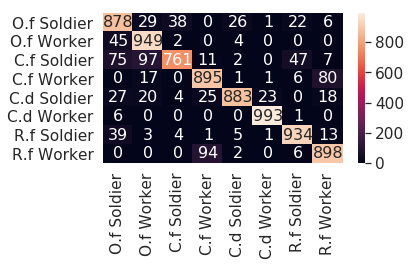

runtime :  6524.535625457764

[29] accuracy: 0.899 loss: 51.835

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636]


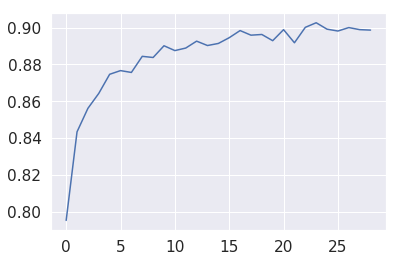

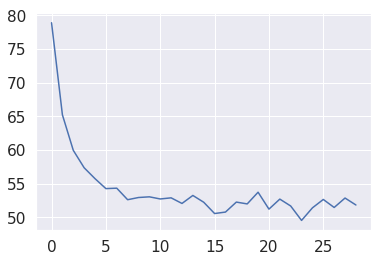

[3, 3, 7, 1, 0, 7, 3, 6, 6, 6, 1, 0, 0, 1, 1, 7, 7, 7, 0, 0, 2, 0, 1, 1, 0, 3, 0, 1, 7, 4, 3, 7, 1, 7, 7, 3, 0, 1, 6, 0, 4, 0, 1, 7, 3, 7, 0, 1, 1, 0, 7, 5, 5, 2, 0, 1, 0, 1, 0, 1, 2, 4, 3, 0, 4, 0, 5, 7, 3, 3, 1, 6, 0, 1, 6, 0, 6, 0, 7, 3, 7, 2, 7, 1, 0, 2, 6, 0, 6, 3, 0, 2, 2, 7, 0, 6, 7, 6, 0, 7, 1, 1, 7, 0, 2, 7, 3, 1, 3, 7, 0, 1, 2, 7, 1, 1, 7, 6, 5, 7, 0, 3, 2, 1, 3, 7, 6, 1, 1, 0, 2, 0, 4, 3, 1, 0, 1, 7, 6, 0, 3, 4, 4, 0, 5, 6, 5, 6, 7, 4, 1, 7, 7, 1, 6, 0, 3, 3, 1, 1, 3, 7, 0, 1, 3, 2, 2, 1, 2, 3, 0, 6, 1, 1, 0, 2, 0, 1, 3, 7, 7, 1, 1, 0, 6, 1, 0, 7, 0, 7, 1, 0, 6, 0, 0, 7, 0, 4, 7, 7, 1, 5, 3, 1, 6, 0, 6, 3, 1, 6, 0, 1, 3, 7, 2, 0, 0, 1, 0, 1, 1, 7, 0, 6, 6, 7, 0, 0, 0, 3, 1, 3, 1, 7, 3, 0, 0, 3, 0, 0, 5, 7, 0, 3, 4, 3, 5, 6, 1, 1, 2, 1, 1, 2, 1, 7, 1, 0, 0, 3, 1, 7, 7, 3, 7, 6, 2, 0, 1, 3, 4, 0, 3, 1, 1, 0, 6, 6, 1, 1, 0, 1, 5, 6, 4, 0, 1, 2, 7, 7, 1, 3, 2, 1, 0, 0, 6, 0, 7, 1, 0, 1, 0, 0, 1, 7, 7, 0, 5, 0, 3, 3, 6, 7, 2, 3, 0, 3, 0, 3, 1, 0, 3, 3, 7, 3, 2, 1, 0, 1, 5, 7, 5, 

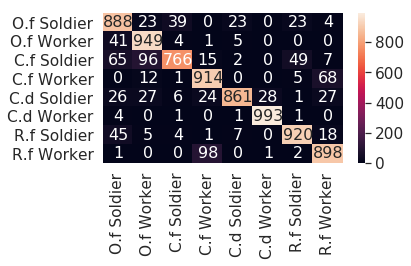

runtime :  6758.462941408157

[30] accuracy: 0.895 loss: 52.248

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477592945]


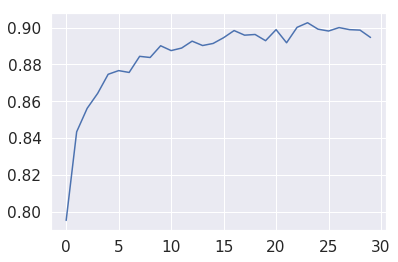

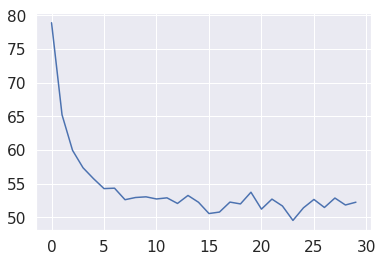

[3, 2, 7, 3, 0, 3, 3, 3, 0, 1, 7, 0, 1, 3, 3, 0, 3, 1, 1, 0, 7, 1, 6, 3, 1, 3, 7, 7, 1, 7, 1, 6, 7, 0, 1, 3, 3, 3, 7, 0, 7, 0, 1, 0, 1, 0, 3, 6, 0, 2, 2, 0, 3, 7, 3, 4, 0, 3, 3, 6, 7, 4, 0, 3, 0, 0, 0, 1, 1, 1, 2, 6, 0, 0, 0, 1, 0, 6, 0, 7, 0, 7, 1, 7, 6, 0, 0, 6, 2, 7, 0, 3, 0, 5, 6, 1, 7, 1, 3, 1, 7, 1, 6, 7, 1, 1, 0, 6, 1, 0, 3, 7, 1, 7, 1, 1, 3, 3, 1, 7, 3, 1, 3, 3, 6, 7, 4, 1, 7, 0, 3, 0, 0, 2, 2, 3, 3, 3, 1, 0, 1, 7, 6, 3, 1, 1, 6, 1, 7, 0, 1, 0, 0, 7, 2, 3, 4, 3, 7, 0, 7, 1, 6, 0, 1, 3, 3, 7, 0, 0, 3, 0, 6, 7, 2, 1, 3, 0, 7, 0, 5, 7, 0, 1, 7, 1, 2, 6, 0, 6, 6, 6, 6, 1, 2, 7, 2, 3, 1, 0, 5, 3, 2, 2, 1, 0, 1, 4, 3, 6, 4, 3, 7, 3, 7, 7, 4, 7, 3, 0, 4, 0, 1, 0, 3, 3, 6, 3, 2, 3, 0, 1, 7, 6, 1, 3, 1, 7, 0, 3, 4, 2, 3, 0, 0, 7, 0, 7, 0, 1, 6, 0, 0, 1, 3, 7, 0, 6, 0, 3, 3, 4, 3, 1, 0, 6, 4, 1, 6, 3, 7, 7, 7, 3, 3, 1, 0, 7, 0, 6, 1, 7, 0, 1, 2, 2, 3, 3, 3, 2, 2, 6, 2, 1, 3, 0, 7, 3, 3, 0, 1, 0, 1, 6, 6, 7, 6, 0, 7, 7, 6, 3, 0, 0, 7, 3, 6, 6, 7, 0, 1, 0, 1, 2, 1, 0, 1, 1, 3, 0, 6, 2, 1, 

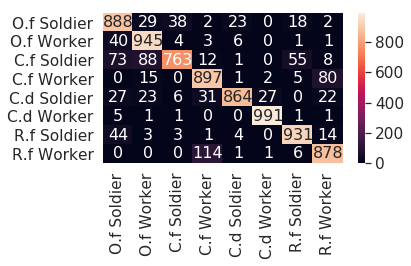

runtime :  6993.151425361633

[31] accuracy: 0.901 loss: 51.857

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477592945, 51.857254549860954]


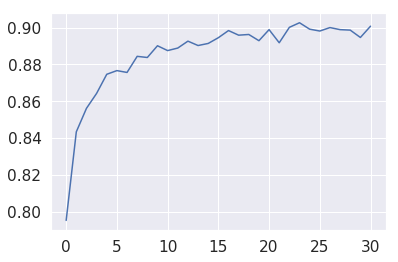

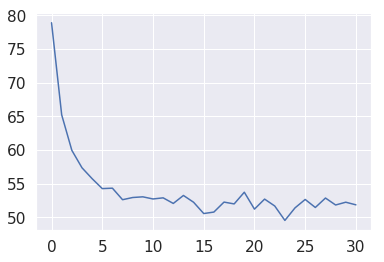

[2, 1, 3, 3, 7, 0, 1, 6, 0, 0, 6, 0, 3, 7, 1, 5, 3, 4, 7, 7, 7, 7, 7, 3, 1, 3, 1, 2, 0, 0, 1, 7, 3, 7, 3, 5, 3, 7, 2, 6, 0, 1, 0, 7, 7, 2, 7, 3, 6, 0, 1, 0, 0, 7, 0, 6, 0, 7, 1, 1, 1, 6, 2, 1, 1, 0, 2, 7, 0, 0, 7, 0, 7, 7, 2, 1, 1, 2, 2, 1, 7, 3, 3, 6, 2, 3, 3, 3, 6, 0, 7, 0, 2, 1, 5, 3, 0, 4, 7, 5, 5, 7, 3, 0, 1, 1, 2, 0, 2, 3, 0, 0, 6, 3, 0, 6, 7, 4, 1, 0, 0, 6, 3, 1, 6, 3, 3, 0, 6, 7, 4, 0, 0, 3, 6, 3, 7, 0, 4, 1, 1, 2, 1, 1, 1, 1, 3, 7, 6, 2, 6, 3, 7, 3, 3, 7, 1, 1, 7, 0, 3, 1, 7, 3, 1, 1, 1, 1, 1, 0, 0, 1, 3, 2, 6, 0, 1, 6, 0, 7, 1, 0, 7, 1, 0, 0, 7, 1, 3, 7, 4, 7, 7, 7, 0, 0, 1, 6, 0, 1, 0, 6, 3, 3, 0, 7, 3, 6, 7, 7, 0, 3, 0, 5, 3, 0, 1, 7, 4, 7, 0, 1, 0, 0, 4, 1, 0, 0, 1, 0, 1, 7, 3, 6, 0, 0, 7, 0, 1, 3, 1, 0, 1, 6, 3, 0, 3, 2, 0, 7, 0, 3, 5, 0, 0, 0, 1, 1, 3, 0, 0, 0, 6, 3, 3, 2, 2, 3, 0, 7, 2, 1, 3, 3, 3, 1, 4, 7, 7, 1, 0, 1, 0, 7, 6, 6, 7, 7, 7, 0, 1, 0, 1, 6, 0, 1, 6, 7, 7, 7, 0, 2, 2, 0, 7, 3, 1, 6, 7, 7, 3, 0, 7, 2, 5, 1, 1, 7, 5, 0, 7, 0, 2, 6, 0, 3, 5, 0, 5, 0, 1, 0, 1, 

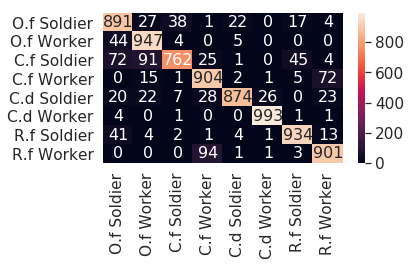

runtime :  7227.995903491974

[32] accuracy: 0.902 loss: 51.014

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477592945, 51.857254549860954, 51.013734735548496]


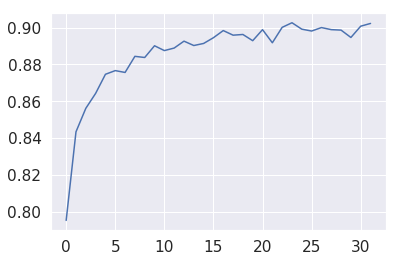

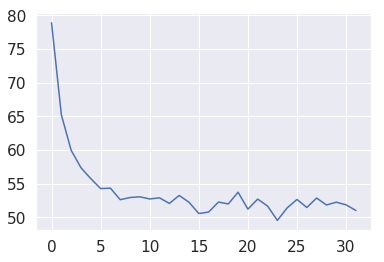

[4, 3, 1, 3, 7, 0, 6, 7, 5, 6, 0, 0, 0, 3, 1, 1, 0, 7, 7, 3, 7, 2, 0, 0, 1, 6, 1, 0, 7, 7, 1, 0, 6, 1, 1, 3, 3, 0, 4, 7, 3, 6, 2, 1, 0, 1, 1, 1, 6, 0, 1, 1, 0, 7, 3, 7, 7, 2, 3, 1, 0, 1, 3, 7, 1, 2, 4, 4, 6, 6, 0, 0, 3, 0, 0, 0, 1, 5, 0, 6, 1, 1, 1, 0, 3, 3, 1, 3, 3, 0, 1, 0, 1, 1, 6, 1, 1, 1, 7, 1, 0, 0, 0, 0, 3, 0, 4, 3, 0, 0, 7, 3, 7, 0, 6, 1, 5, 7, 4, 4, 1, 3, 0, 0, 1, 1, 3, 0, 1, 2, 0, 7, 1, 6, 4, 0, 7, 0, 1, 5, 0, 6, 7, 7, 7, 3, 0, 0, 2, 2, 5, 3, 7, 3, 4, 7, 1, 2, 7, 0, 4, 7, 7, 4, 7, 0, 0, 6, 7, 3, 1, 1, 2, 0, 7, 7, 5, 3, 3, 2, 1, 3, 0, 0, 5, 3, 1, 7, 0, 0, 7, 1, 7, 7, 3, 1, 0, 3, 0, 1, 1, 7, 5, 2, 6, 3, 0, 0, 1, 7, 1, 4, 0, 1, 0, 3, 6, 0, 1, 1, 7, 7, 0, 0, 7, 0, 7, 1, 0, 4, 3, 1, 1, 7, 3, 0, 3, 4, 1, 0, 0, 1, 5, 6, 6, 3, 0, 3, 6, 0, 3, 1, 0, 6, 0, 1, 3, 1, 0, 2, 7, 3, 7, 0, 7, 7, 7, 7, 2, 1, 3, 0, 2, 7, 1, 1, 0, 5, 6, 5, 2, 6, 3, 0, 1, 7, 1, 7, 4, 1, 1, 3, 4, 4, 7, 1, 0, 3, 0, 0, 0, 7, 7, 3, 1, 1, 1, 6, 6, 0, 1, 3, 0, 7, 3, 2, 1, 1, 2, 7, 7, 1, 4, 1, 7, 0, 0, 7, 3, 2, 6, 7, 1, 

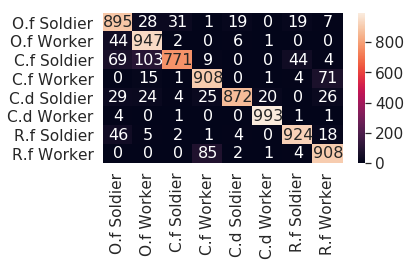

runtime :  7461.549246072769

[33] accuracy: 0.904 loss: 51.865

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477592945, 51.857254549860954, 51.013734735548496, 5

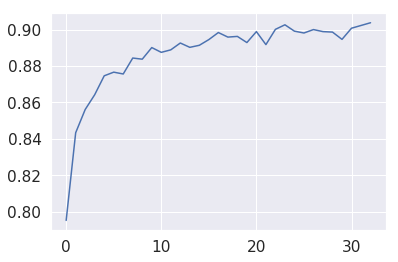

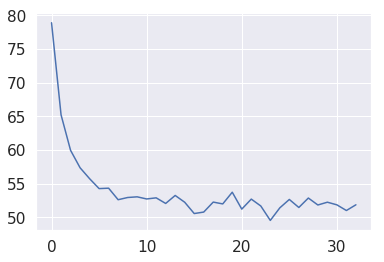

[3, 3, 3, 0, 5, 7, 3, 1, 6, 7, 0, 3, 0, 0, 4, 0, 6, 0, 7, 4, 6, 7, 7, 7, 7, 1, 0, 3, 3, 4, 1, 6, 0, 3, 3, 2, 4, 5, 0, 3, 6, 0, 2, 0, 1, 3, 0, 2, 3, 3, 0, 1, 1, 0, 1, 1, 1, 3, 7, 3, 0, 1, 0, 3, 1, 0, 3, 1, 7, 6, 1, 1, 3, 0, 0, 2, 2, 6, 2, 1, 3, 6, 1, 7, 1, 3, 2, 3, 1, 1, 7, 0, 6, 7, 6, 0, 6, 2, 2, 1, 1, 5, 4, 2, 4, 0, 7, 0, 1, 3, 1, 1, 0, 1, 3, 1, 4, 7, 0, 3, 0, 6, 3, 2, 0, 7, 7, 1, 0, 3, 5, 3, 3, 3, 1, 3, 7, 7, 6, 0, 1, 3, 6, 1, 0, 6, 1, 0, 7, 7, 0, 7, 1, 7, 6, 1, 3, 7, 0, 0, 7, 7, 1, 0, 3, 7, 6, 1, 1, 0, 1, 0, 7, 3, 3, 0, 3, 6, 7, 4, 0, 6, 6, 3, 0, 4, 1, 2, 3, 0, 5, 1, 7, 4, 0, 7, 1, 3, 0, 0, 1, 3, 0, 3, 3, 0, 0, 4, 4, 7, 1, 5, 0, 3, 3, 7, 1, 1, 1, 3, 3, 3, 0, 1, 7, 3, 0, 2, 0, 0, 1, 0, 3, 1, 2, 1, 1, 5, 4, 7, 0, 3, 0, 0, 7, 7, 0, 1, 0, 7, 7, 4, 1, 4, 7, 1, 1, 1, 1, 0, 7, 2, 4, 0, 5, 6, 0, 7, 0, 6, 2, 2, 0, 2, 7, 7, 3, 6, 1, 3, 3, 0, 1, 0, 1, 7, 3, 3, 6, 7, 6, 3, 1, 0, 7, 0, 2, 0, 7, 0, 1, 0, 7, 3, 6, 6, 0, 1, 3, 7, 5, 7, 1, 3, 1, 0, 3, 0, 0, 6, 6, 0, 0, 3, 7, 4, 0, 1, 6, 1, 6, 6, 0, 

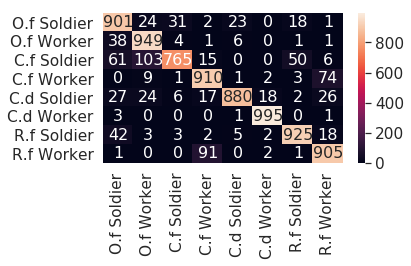

runtime :  7694.355261087418

[34] accuracy: 0.905 loss: 51.648

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477592945, 51.857254549860954, 51.013734735

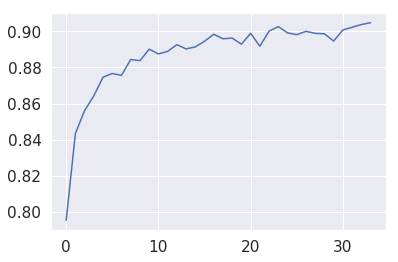

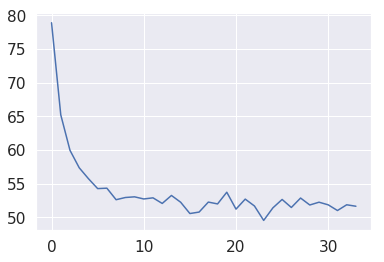

[7, 3, 7, 2, 7, 3, 3, 7, 0, 2, 7, 2, 0, 6, 3, 3, 2, 7, 7, 1, 3, 0, 7, 0, 0, 3, 1, 5, 7, 7, 1, 1, 0, 4, 1, 2, 0, 3, 1, 0, 1, 3, 4, 4, 6, 6, 0, 1, 6, 3, 4, 3, 0, 6, 0, 0, 1, 7, 0, 0, 1, 1, 1, 0, 3, 1, 3, 1, 3, 3, 3, 6, 1, 2, 3, 1, 3, 3, 2, 0, 0, 7, 0, 1, 7, 1, 0, 7, 5, 0, 6, 0, 0, 4, 1, 6, 1, 0, 7, 0, 6, 0, 1, 1, 0, 0, 0, 0, 7, 1, 2, 1, 2, 3, 1, 0, 1, 6, 3, 1, 6, 1, 1, 0, 0, 7, 3, 3, 1, 3, 1, 3, 3, 1, 6, 6, 1, 6, 0, 2, 3, 3, 1, 3, 2, 0, 0, 0, 3, 1, 6, 6, 1, 7, 1, 4, 3, 0, 0, 0, 7, 0, 2, 7, 7, 1, 0, 6, 1, 6, 7, 0, 3, 1, 1, 6, 0, 7, 7, 3, 2, 3, 6, 3, 2, 0, 2, 1, 7, 1, 7, 0, 0, 4, 3, 0, 2, 5, 2, 2, 1, 7, 2, 7, 4, 0, 7, 6, 6, 1, 0, 3, 1, 7, 0, 0, 4, 1, 2, 3, 1, 1, 3, 0, 1, 0, 2, 0, 0, 6, 0, 0, 5, 2, 0, 0, 1, 1, 7, 6, 0, 3, 3, 2, 3, 1, 4, 3, 1, 3, 0, 1, 0, 0, 5, 7, 2, 3, 3, 1, 4, 3, 7, 1, 3, 0, 6, 0, 1, 1, 7, 3, 1, 3, 7, 3, 6, 0, 1, 1, 6, 1, 0, 7, 3, 6, 3, 7, 0, 5, 1, 6, 7, 4, 6, 7, 0, 2, 7, 0, 7, 5, 5, 0, 0, 2, 3, 0, 1, 3, 4, 6, 1, 7, 1, 1, 0, 3, 1, 3, 1, 0, 1, 0, 7, 0, 3, 3, 6, 0, 1, 1, 0, 

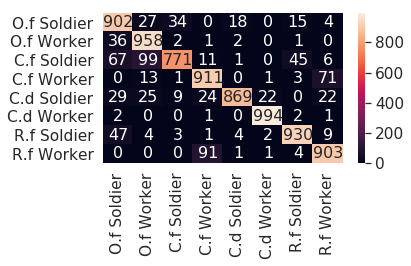

runtime :  7926.462908983231

[35] accuracy: 0.902 loss: 52.953

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477592945, 51.857254549860954, 51

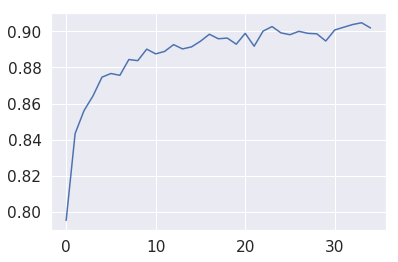

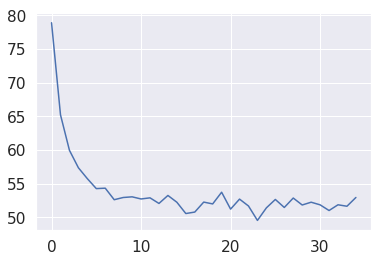

[7, 0, 3, 1, 6, 2, 1, 6, 1, 3, 0, 6, 7, 3, 3, 1, 4, 1, 5, 0, 3, 0, 0, 0, 1, 0, 1, 3, 1, 4, 3, 5, 0, 1, 4, 5, 1, 1, 2, 3, 0, 1, 1, 0, 7, 3, 4, 1, 1, 3, 1, 1, 5, 7, 0, 6, 3, 1, 7, 1, 6, 1, 3, 0, 6, 1, 2, 0, 6, 7, 1, 6, 7, 0, 1, 0, 3, 0, 2, 0, 6, 1, 1, 1, 0, 0, 1, 1, 4, 3, 7, 3, 7, 4, 1, 1, 6, 1, 6, 3, 2, 1, 6, 0, 0, 3, 0, 7, 7, 1, 6, 3, 1, 6, 0, 7, 1, 3, 3, 1, 0, 1, 0, 0, 3, 3, 0, 0, 3, 4, 3, 7, 7, 5, 7, 5, 6, 7, 1, 0, 0, 5, 2, 4, 0, 1, 0, 1, 0, 0, 7, 0, 7, 2, 0, 4, 3, 7, 0, 7, 0, 3, 7, 0, 7, 0, 6, 0, 7, 3, 1, 0, 3, 1, 1, 5, 2, 3, 0, 1, 1, 6, 1, 7, 5, 0, 2, 0, 0, 3, 0, 0, 3, 3, 3, 3, 6, 6, 0, 3, 3, 1, 0, 7, 4, 6, 7, 2, 1, 1, 7, 0, 0, 6, 2, 7, 7, 0, 7, 3, 1, 0, 2, 7, 0, 2, 3, 1, 3, 0, 0, 1, 3, 0, 1, 1, 3, 7, 0, 0, 2, 5, 1, 3, 0, 1, 0, 7, 3, 7, 3, 1, 0, 6, 0, 5, 5, 1, 4, 2, 3, 0, 7, 1, 7, 6, 1, 7, 0, 3, 5, 3, 2, 0, 6, 2, 3, 7, 7, 0, 6, 0, 1, 1, 7, 0, 3, 0, 1, 0, 1, 3, 0, 0, 0, 0, 3, 6, 2, 3, 3, 0, 3, 0, 6, 6, 7, 0, 0, 3, 0, 1, 3, 5, 7, 6, 0, 3, 0, 0, 7, 1, 3, 1, 0, 1, 7, 7, 1, 6, 2, 2, 3, 

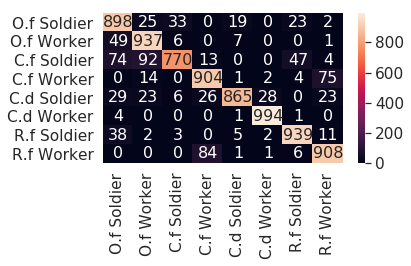

runtime :  8157.599183082581

[36] accuracy: 0.899 loss: 51.477

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477592945, 51.857254549

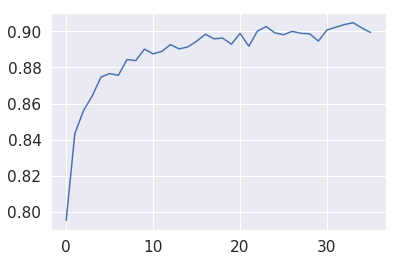

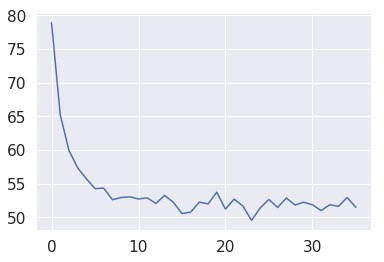

[3, 3, 7, 3, 1, 0, 6, 0, 1, 6, 6, 0, 7, 1, 7, 1, 7, 0, 3, 0, 0, 2, 6, 6, 6, 0, 3, 3, 7, 7, 6, 7, 6, 6, 0, 6, 1, 1, 0, 5, 0, 6, 1, 6, 5, 3, 2, 0, 6, 6, 0, 6, 1, 6, 1, 7, 0, 1, 0, 1, 0, 3, 7, 1, 7, 3, 0, 0, 0, 0, 0, 1, 3, 3, 0, 3, 3, 0, 1, 1, 7, 7, 0, 1, 1, 1, 7, 3, 1, 0, 2, 3, 3, 1, 2, 5, 1, 7, 1, 1, 7, 1, 0, 1, 0, 1, 7, 3, 1, 5, 7, 7, 0, 3, 1, 3, 1, 1, 3, 0, 5, 0, 4, 6, 3, 1, 7, 0, 7, 0, 1, 7, 6, 7, 4, 0, 0, 0, 6, 1, 7, 7, 0, 0, 7, 2, 3, 0, 1, 3, 0, 0, 5, 4, 2, 0, 5, 1, 7, 3, 1, 7, 4, 1, 1, 7, 0, 5, 7, 3, 7, 0, 0, 0, 0, 6, 0, 6, 2, 0, 7, 0, 0, 7, 7, 6, 0, 3, 6, 1, 7, 1, 3, 0, 6, 3, 0, 0, 0, 3, 3, 3, 0, 0, 0, 0, 0, 0, 7, 7, 7, 0, 1, 0, 0, 0, 7, 1, 7, 7, 2, 5, 2, 1, 0, 0, 1, 0, 1, 3, 6, 7, 0, 0, 7, 0, 1, 3, 7, 0, 1, 1, 1, 0, 2, 0, 3, 2, 7, 7, 1, 0, 3, 3, 7, 3, 3, 0, 1, 1, 1, 7, 4, 7, 0, 6, 0, 2, 0, 0, 0, 6, 4, 0, 7, 3, 0, 2, 7, 3, 0, 1, 1, 3, 1, 1, 3, 6, 1, 7, 7, 0, 0, 0, 1, 7, 7, 7, 0, 6, 7, 1, 3, 0, 3, 0, 6, 6, 2, 0, 0, 1, 0, 4, 4, 3, 0, 1, 1, 3, 0, 0, 3, 0, 0, 1, 7, 1, 1, 1, 0, 2, 7, 

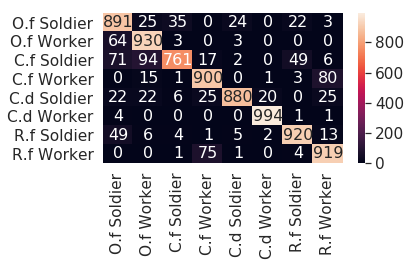

runtime :  8390.848667621613

[37] accuracy: 0.903 loss: 52.491

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477592945, 51

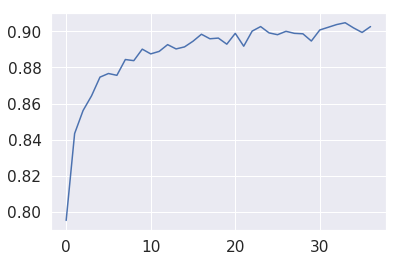

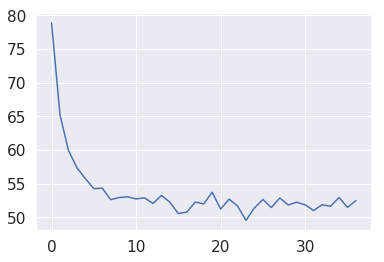

[0, 0, 7, 0, 6, 6, 6, 7, 2, 1, 0, 3, 1, 1, 2, 1, 3, 3, 1, 3, 3, 7, 1, 1, 0, 7, 3, 6, 3, 6, 1, 1, 7, 1, 3, 1, 0, 7, 3, 4, 3, 4, 3, 0, 7, 4, 1, 0, 0, 1, 0, 5, 0, 7, 2, 0, 1, 0, 5, 1, 0, 1, 5, 0, 7, 7, 1, 0, 3, 0, 0, 0, 1, 0, 1, 1, 7, 4, 1, 1, 1, 6, 7, 7, 3, 0, 1, 0, 0, 3, 7, 7, 0, 0, 3, 1, 2, 5, 0, 7, 3, 1, 6, 1, 7, 0, 0, 0, 0, 1, 2, 1, 1, 5, 2, 6, 5, 0, 7, 7, 7, 1, 0, 7, 3, 6, 0, 0, 4, 0, 3, 3, 6, 2, 3, 3, 0, 1, 3, 6, 7, 0, 1, 7, 3, 0, 0, 7, 7, 0, 3, 3, 6, 0, 0, 0, 1, 7, 1, 1, 3, 6, 1, 0, 0, 3, 0, 7, 0, 1, 4, 6, 7, 6, 0, 0, 2, 0, 4, 1, 0, 3, 1, 0, 5, 1, 4, 3, 3, 1, 7, 4, 1, 0, 5, 3, 1, 1, 2, 3, 1, 0, 6, 0, 0, 3, 0, 7, 0, 2, 3, 7, 7, 6, 6, 0, 3, 0, 6, 1, 7, 0, 6, 2, 0, 3, 1, 4, 5, 2, 3, 0, 3, 4, 2, 2, 0, 6, 3, 7, 3, 1, 0, 0, 2, 6, 7, 4, 3, 1, 6, 3, 0, 1, 3, 3, 7, 1, 7, 1, 0, 7, 2, 0, 7, 0, 0, 0, 1, 7, 7, 0, 7, 1, 3, 2, 7, 3, 0, 4, 6, 5, 1, 1, 1, 7, 6, 0, 2, 5, 2, 7, 7, 1, 4, 2, 3, 1, 0, 1, 0, 7, 7, 1, 0, 3, 0, 1, 3, 0, 1, 1, 6, 3, 5, 7, 2, 7, 3, 6, 6, 7, 6, 4, 1, 0, 0, 0, 0, 7, 1, 0, 5, 

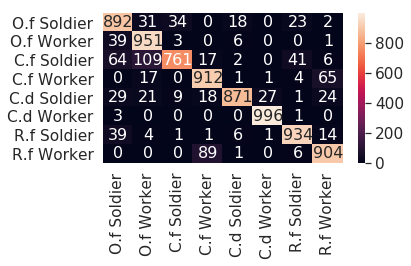

runtime :  8621.499606132507

[38] accuracy: 0.903 loss: 54.151

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.248020477

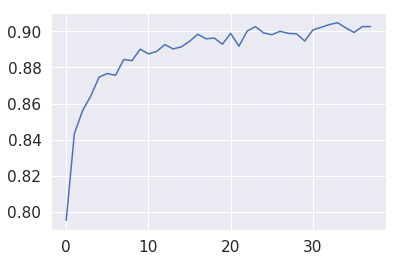

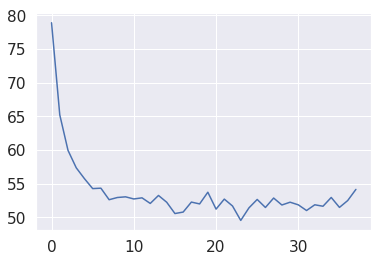

[1, 1, 7, 1, 6, 1, 1, 1, 0, 5, 7, 1, 4, 7, 5, 4, 3, 0, 0, 7, 0, 4, 0, 1, 0, 0, 7, 7, 6, 1, 0, 7, 0, 7, 0, 6, 0, 6, 0, 3, 6, 5, 3, 7, 0, 4, 1, 7, 7, 0, 0, 7, 7, 6, 1, 3, 3, 3, 3, 3, 3, 0, 6, 7, 7, 1, 1, 4, 0, 2, 7, 6, 0, 3, 3, 1, 0, 0, 4, 3, 3, 1, 4, 6, 0, 0, 3, 6, 1, 3, 0, 0, 1, 0, 5, 3, 4, 1, 1, 5, 3, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 6, 0, 1, 0, 0, 0, 7, 1, 1, 7, 7, 1, 0, 1, 2, 0, 1, 2, 1, 7, 5, 1, 3, 0, 0, 1, 0, 3, 0, 4, 1, 1, 7, 3, 0, 1, 0, 1, 0, 3, 2, 0, 7, 3, 3, 0, 3, 4, 2, 3, 7, 6, 7, 6, 6, 6, 6, 1, 0, 1, 0, 1, 7, 7, 0, 0, 3, 6, 3, 0, 0, 1, 7, 0, 7, 3, 0, 6, 3, 6, 1, 1, 4, 2, 1, 5, 4, 2, 6, 1, 0, 6, 1, 3, 7, 1, 7, 2, 7, 2, 6, 2, 4, 7, 2, 1, 1, 0, 0, 6, 6, 1, 7, 4, 3, 3, 3, 6, 0, 3, 1, 7, 1, 7, 7, 3, 4, 0, 6, 6, 7, 1, 3, 2, 1, 2, 3, 3, 2, 6, 6, 3, 1, 6, 0, 0, 1, 7, 7, 3, 7, 1, 6, 7, 7, 0, 0, 0, 7, 5, 0, 7, 3, 7, 0, 1, 4, 0, 0, 1, 0, 5, 7, 6, 3, 0, 0, 1, 0, 7, 0, 7, 0, 3, 6, 0, 0, 7, 6, 3, 1, 1, 0, 1, 0, 3, 3, 6, 5, 1, 7, 7, 7, 0, 2, 7, 7, 6, 6, 7, 1, 6, 7, 7, 0, 4, 0, 4, 7, 7, 4, 0, 

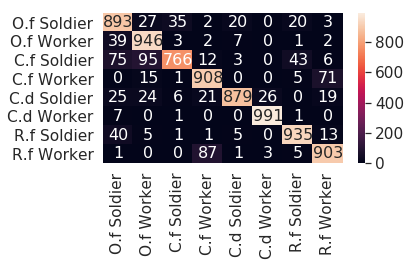

runtime :  8855.20944929123

[39] accuracy: 0.901 loss: 52.404

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83484514057636, 52.

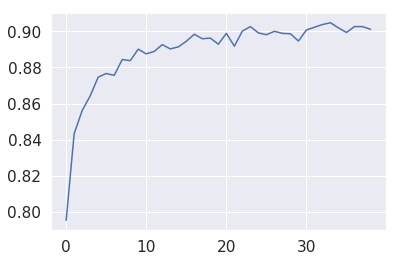

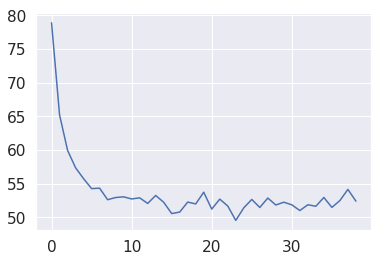

[7, 0, 7, 0, 6, 7, 1, 0, 0, 0, 6, 2, 7, 3, 7, 0, 1, 0, 5, 5, 3, 4, 5, 1, 1, 0, 3, 4, 2, 1, 1, 1, 2, 1, 7, 3, 0, 0, 1, 0, 2, 2, 7, 6, 1, 0, 2, 5, 3, 6, 0, 1, 3, 1, 7, 5, 0, 0, 0, 7, 1, 1, 2, 1, 6, 0, 1, 3, 1, 3, 3, 1, 4, 3, 4, 1, 1, 1, 1, 7, 3, 0, 6, 1, 5, 1, 2, 1, 1, 0, 1, 4, 7, 0, 0, 1, 1, 3, 1, 0, 7, 0, 7, 3, 4, 7, 1, 7, 3, 0, 3, 0, 0, 1, 3, 4, 1, 0, 0, 0, 0, 7, 7, 3, 1, 3, 0, 3, 6, 4, 1, 1, 6, 3, 6, 2, 1, 2, 0, 2, 3, 0, 1, 4, 7, 7, 1, 7, 0, 0, 6, 0, 0, 1, 6, 3, 5, 6, 5, 7, 0, 1, 7, 7, 3, 7, 2, 6, 7, 1, 7, 4, 0, 7, 7, 0, 3, 1, 0, 1, 7, 4, 3, 1, 1, 1, 3, 0, 1, 2, 3, 7, 7, 4, 1, 3, 0, 5, 3, 2, 1, 7, 3, 4, 7, 3, 1, 7, 0, 0, 7, 4, 1, 7, 0, 3, 7, 4, 2, 7, 1, 4, 3, 1, 6, 1, 7, 0, 0, 7, 7, 2, 3, 0, 3, 2, 6, 3, 1, 0, 3, 3, 1, 3, 2, 5, 1, 7, 3, 1, 3, 1, 3, 0, 0, 7, 3, 0, 0, 7, 0, 0, 3, 1, 0, 6, 1, 0, 0, 3, 0, 1, 3, 7, 7, 7, 5, 0, 6, 0, 6, 0, 3, 0, 3, 1, 7, 4, 0, 3, 3, 6, 2, 0, 7, 1, 0, 6, 0, 3, 1, 5, 1, 0, 1, 7, 1, 3, 1, 3, 1, 7, 6, 0, 6, 1, 6, 6, 6, 0, 2, 3, 0, 3, 0, 1, 0, 0, 7, 6, 0, 7, 2, 

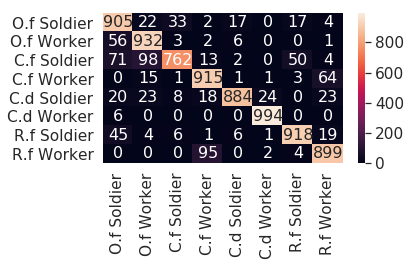

runtime :  9087.682704687119

[40] accuracy: 0.907 loss: 50.531

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.8348451405

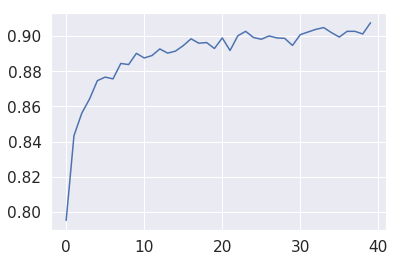

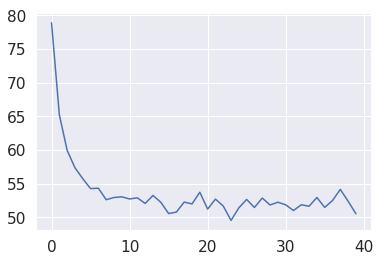

[6, 0, 3, 1, 6, 1, 5, 6, 0, 0, 7, 6, 1, 7, 3, 0, 3, 6, 0, 6, 1, 7, 6, 0, 0, 7, 0, 1, 6, 3, 0, 3, 7, 2, 1, 3, 0, 7, 1, 2, 5, 0, 1, 0, 5, 7, 0, 1, 0, 7, 1, 1, 3, 7, 7, 3, 3, 0, 1, 6, 0, 0, 0, 0, 1, 6, 1, 2, 2, 0, 5, 1, 0, 6, 1, 7, 0, 1, 7, 1, 0, 1, 7, 7, 0, 0, 1, 0, 6, 4, 7, 0, 0, 6, 0, 6, 1, 0, 3, 6, 2, 6, 2, 1, 4, 3, 0, 7, 7, 7, 7, 1, 5, 1, 1, 3, 3, 0, 1, 6, 0, 1, 3, 4, 4, 1, 3, 3, 0, 3, 3, 3, 0, 7, 1, 1, 7, 0, 0, 1, 1, 1, 1, 0, 6, 3, 7, 1, 5, 3, 7, 0, 7, 3, 7, 7, 6, 7, 1, 0, 7, 4, 1, 1, 6, 0, 4, 5, 7, 7, 6, 0, 0, 3, 1, 0, 1, 0, 7, 7, 4, 1, 7, 1, 7, 1, 0, 0, 3, 5, 6, 7, 0, 2, 6, 2, 0, 3, 7, 1, 1, 1, 1, 4, 6, 3, 7, 6, 6, 0, 0, 0, 3, 7, 0, 1, 6, 0, 4, 7, 7, 0, 2, 1, 7, 1, 1, 0, 0, 5, 1, 0, 3, 1, 0, 3, 0, 3, 1, 1, 0, 3, 0, 6, 7, 1, 7, 0, 3, 0, 1, 3, 0, 3, 3, 7, 7, 4, 5, 7, 0, 1, 5, 1, 7, 2, 6, 3, 3, 1, 0, 3, 6, 3, 1, 1, 2, 0, 3, 1, 0, 0, 4, 3, 0, 1, 4, 1, 0, 0, 0, 7, 1, 0, 5, 6, 1, 0, 1, 3, 3, 7, 2, 3, 1, 6, 0, 6, 0, 1, 6, 0, 3, 7, 3, 4, 7, 2, 0, 1, 6, 2, 3, 1, 0, 4, 0, 0, 1, 0, 1, 6, 5, 

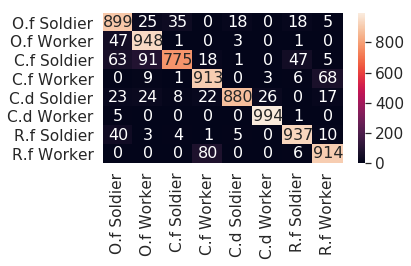

runtime :  9320.40320467949

[41] accuracy: 0.901 loss: 52.394

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.867281429469585, 51.83

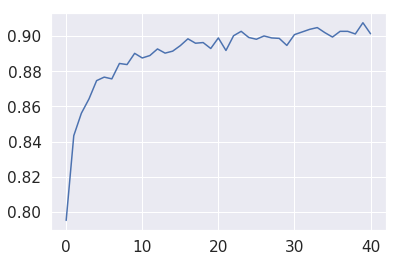

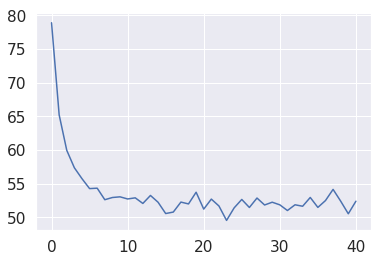

[0, 3, 3, 7, 0, 6, 7, 7, 7, 7, 2, 3, 1, 1, 2, 5, 4, 2, 5, 7, 0, 1, 1, 3, 2, 3, 1, 7, 0, 6, 7, 1, 1, 0, 3, 1, 1, 4, 0, 7, 6, 1, 1, 3, 1, 3, 0, 1, 1, 3, 0, 0, 1, 3, 0, 3, 7, 7, 6, 0, 1, 0, 0, 4, 0, 2, 4, 1, 7, 1, 7, 3, 0, 2, 1, 7, 2, 2, 6, 1, 3, 7, 1, 6, 5, 1, 7, 0, 1, 3, 3, 3, 5, 4, 1, 0, 1, 1, 3, 1, 5, 0, 6, 1, 7, 3, 0, 0, 0, 7, 7, 0, 4, 1, 4, 3, 0, 0, 5, 4, 0, 0, 6, 5, 7, 2, 0, 6, 0, 0, 1, 5, 3, 3, 0, 0, 1, 1, 0, 7, 7, 2, 0, 4, 2, 3, 7, 3, 1, 5, 7, 0, 0, 5, 6, 0, 1, 1, 4, 6, 1, 6, 1, 0, 4, 0, 5, 0, 7, 5, 1, 6, 0, 6, 0, 3, 6, 1, 0, 2, 1, 3, 0, 0, 0, 1, 0, 0, 0, 2, 7, 1, 3, 6, 1, 0, 2, 1, 1, 1, 2, 7, 1, 7, 7, 6, 1, 3, 6, 0, 3, 7, 2, 3, 7, 4, 7, 1, 0, 6, 0, 2, 4, 2, 3, 0, 1, 0, 0, 0, 3, 3, 7, 6, 0, 1, 3, 0, 7, 7, 6, 0, 5, 0, 1, 1, 6, 0, 3, 6, 1, 4, 2, 0, 6, 2, 6, 3, 7, 2, 5, 6, 0, 2, 2, 3, 1, 3, 7, 3, 0, 1, 0, 5, 2, 0, 7, 3, 6, 7, 0, 3, 6, 3, 0, 1, 4, 1, 0, 0, 2, 1, 0, 0, 1, 1, 0, 7, 5, 0, 7, 0, 0, 2, 4, 1, 1, 5, 6, 4, 3, 0, 0, 0, 4, 5, 3, 3, 7, 1, 5, 0, 6, 3, 5, 3, 7, 3, 2, 4, 0, 7, 7, 

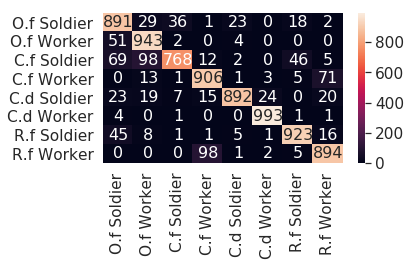

runtime :  9557.308205127716

[42] accuracy: 0.907 loss: 51.199

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.86728142946

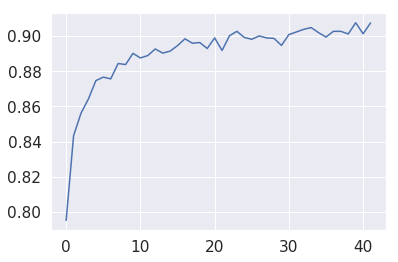

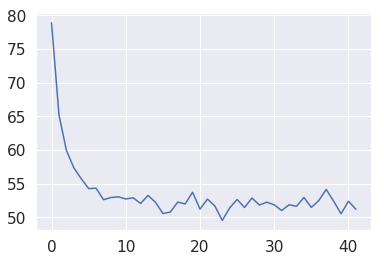

[0, 0, 3, 0, 1, 0, 1, 0, 7, 3, 3, 0, 3, 1, 1, 0, 1, 0, 3, 3, 3, 0, 0, 0, 7, 1, 0, 7, 1, 7, 0, 1, 0, 6, 3, 2, 6, 1, 1, 0, 7, 2, 3, 1, 7, 1, 7, 7, 1, 1, 1, 1, 0, 6, 0, 1, 3, 0, 7, 1, 1, 1, 2, 4, 1, 2, 4, 7, 1, 2, 1, 3, 3, 3, 6, 1, 1, 3, 4, 6, 3, 7, 7, 6, 1, 3, 3, 4, 1, 1, 0, 1, 0, 4, 6, 7, 3, 1, 3, 1, 1, 2, 1, 0, 3, 0, 3, 0, 0, 2, 0, 1, 6, 0, 0, 7, 7, 3, 0, 7, 2, 0, 7, 0, 1, 3, 0, 0, 3, 2, 0, 3, 2, 7, 3, 7, 0, 6, 7, 7, 6, 3, 0, 1, 0, 3, 0, 0, 7, 7, 5, 3, 3, 0, 7, 7, 3, 1, 7, 3, 3, 1, 7, 7, 3, 1, 0, 0, 0, 1, 7, 7, 0, 1, 0, 1, 1, 1, 0, 0, 6, 2, 1, 0, 1, 0, 0, 2, 4, 3, 0, 3, 5, 1, 0, 5, 0, 1, 4, 6, 6, 0, 3, 3, 6, 2, 1, 1, 0, 7, 4, 1, 1, 0, 1, 1, 1, 0, 1, 1, 3, 0, 6, 0, 1, 1, 2, 1, 6, 3, 1, 4, 3, 0, 1, 4, 7, 3, 3, 6, 0, 7, 1, 1, 7, 3, 0, 3, 3, 6, 7, 2, 0, 1, 7, 0, 7, 0, 0, 4, 2, 5, 2, 6, 3, 0, 3, 1, 0, 6, 1, 1, 0, 7, 6, 7, 5, 7, 0, 3, 7, 1, 0, 1, 1, 6, 3, 1, 0, 6, 1, 1, 0, 5, 0, 6, 7, 3, 0, 1, 0, 1, 6, 7, 7, 6, 6, 4, 1, 0, 2, 1, 0, 4, 3, 6, 7, 7, 7, 1, 2, 1, 0, 1, 6, 2, 7, 1, 1, 7, 7, 0, 7, 

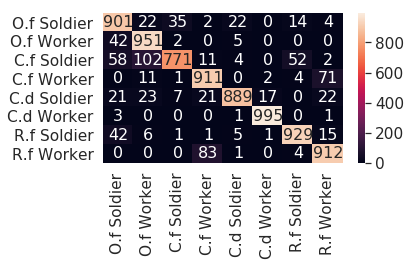

runtime :  9790.767971754074

[43] accuracy: 0.904 loss: 51.632

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.46492440998554, 52.8

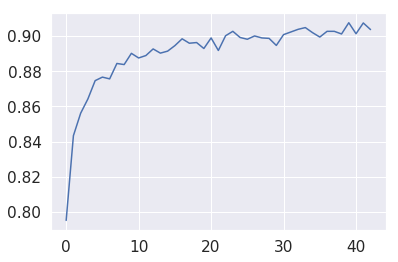

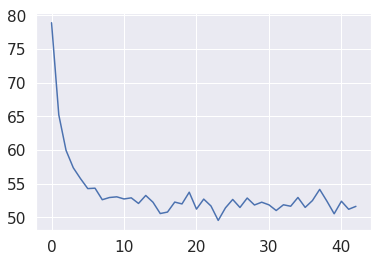

[1, 0, 0, 1, 3, 4, 5, 1, 7, 5, 0, 3, 1, 3, 2, 2, 1, 1, 7, 6, 6, 0, 1, 1, 7, 4, 1, 6, 6, 0, 0, 0, 3, 0, 5, 6, 0, 3, 0, 1, 7, 5, 7, 0, 1, 7, 7, 0, 7, 7, 1, 1, 7, 3, 1, 6, 1, 7, 4, 1, 1, 7, 7, 3, 3, 1, 0, 1, 6, 7, 4, 4, 0, 3, 3, 3, 3, 0, 0, 7, 7, 3, 0, 1, 7, 0, 6, 1, 7, 7, 0, 3, 6, 0, 2, 1, 1, 1, 1, 3, 1, 1, 1, 7, 0, 6, 5, 3, 1, 6, 1, 1, 7, 0, 6, 1, 3, 0, 3, 7, 1, 0, 7, 7, 7, 1, 6, 1, 1, 6, 7, 6, 0, 6, 5, 3, 1, 0, 4, 6, 3, 6, 3, 3, 2, 6, 0, 7, 6, 7, 3, 6, 0, 6, 1, 1, 1, 2, 4, 6, 4, 5, 6, 6, 0, 0, 2, 1, 0, 1, 7, 0, 7, 7, 0, 7, 1, 1, 1, 0, 3, 7, 4, 7, 0, 0, 6, 7, 4, 6, 0, 1, 6, 3, 0, 4, 0, 6, 7, 3, 0, 0, 1, 0, 6, 7, 5, 0, 0, 6, 0, 2, 7, 2, 1, 7, 1, 6, 5, 0, 6, 2, 7, 0, 6, 0, 0, 0, 7, 2, 1, 3, 1, 6, 7, 6, 0, 0, 1, 3, 0, 0, 2, 2, 3, 2, 1, 3, 0, 3, 6, 0, 3, 7, 0, 0, 4, 0, 0, 4, 5, 1, 0, 1, 1, 0, 2, 7, 0, 3, 7, 7, 0, 6, 6, 3, 3, 7, 6, 0, 1, 2, 1, 7, 2, 7, 7, 4, 7, 6, 0, 0, 5, 1, 0, 6, 6, 2, 2, 6, 2, 0, 3, 1, 0, 1, 0, 3, 1, 0, 0, 6, 3, 1, 6, 7, 3, 0, 7, 0, 5, 0, 7, 7, 0, 6, 0, 5, 4, 4, 3, 1, 7, 

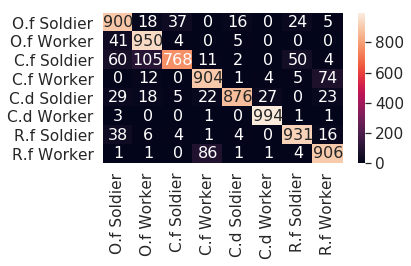

runtime :  10025.60774922371

[44] accuracy: 0.905 loss: 52.270

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51.4649244099

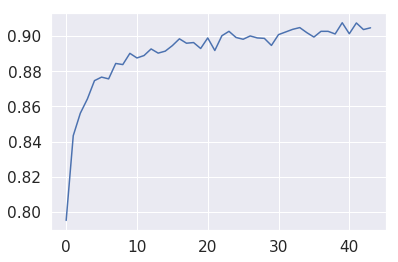

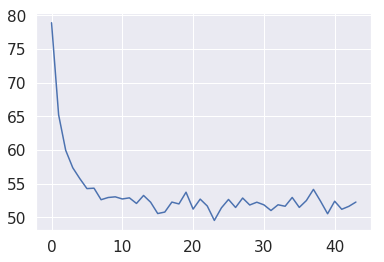

[3, 0, 2, 7, 3, 7, 0, 1, 0, 7, 1, 1, 3, 3, 7, 3, 0, 3, 0, 0, 0, 3, 7, 1, 2, 5, 7, 4, 2, 3, 0, 5, 6, 4, 0, 6, 7, 1, 5, 7, 7, 3, 6, 0, 0, 0, 4, 6, 4, 4, 3, 3, 7, 7, 0, 1, 5, 6, 1, 3, 5, 1, 1, 4, 0, 0, 3, 3, 6, 1, 1, 6, 4, 1, 7, 6, 3, 4, 6, 1, 3, 7, 1, 0, 0, 6, 7, 0, 3, 3, 3, 7, 6, 0, 1, 1, 7, 3, 7, 4, 6, 0, 3, 1, 3, 1, 6, 4, 7, 7, 1, 3, 1, 1, 3, 3, 6, 6, 2, 2, 0, 6, 7, 0, 5, 1, 1, 1, 2, 1, 2, 0, 0, 1, 6, 1, 6, 7, 0, 7, 0, 0, 3, 0, 1, 1, 1, 1, 1, 7, 3, 0, 1, 7, 2, 3, 3, 3, 3, 7, 4, 4, 2, 6, 1, 6, 0, 0, 7, 0, 7, 0, 0, 1, 0, 4, 1, 7, 0, 1, 5, 5, 3, 1, 0, 1, 6, 0, 1, 6, 1, 1, 1, 0, 3, 2, 7, 1, 0, 0, 3, 5, 2, 7, 1, 1, 2, 0, 5, 3, 7, 2, 3, 1, 1, 7, 0, 0, 5, 3, 0, 0, 3, 0, 3, 0, 2, 4, 1, 7, 1, 3, 3, 1, 7, 5, 2, 3, 7, 5, 0, 5, 0, 4, 0, 1, 0, 5, 0, 0, 1, 6, 7, 0, 6, 6, 7, 7, 6, 1, 3, 7, 1, 1, 5, 0, 0, 7, 1, 3, 7, 3, 2, 0, 3, 3, 1, 3, 1, 3, 3, 1, 0, 1, 1, 0, 1, 6, 0, 0, 3, 7, 1, 1, 5, 3, 1, 3, 7, 7, 1, 3, 7, 3, 0, 1, 0, 0, 3, 2, 0, 0, 0, 0, 7, 3, 3, 1, 0, 3, 1, 3, 1, 7, 6, 3, 6, 0, 1, 0, 0, 3, 0, 

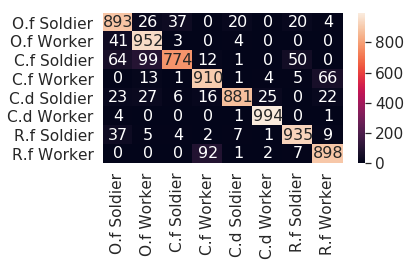

runtime :  10256.886961698532

[45] accuracy: 0.906 loss: 51.012

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414007664, 51

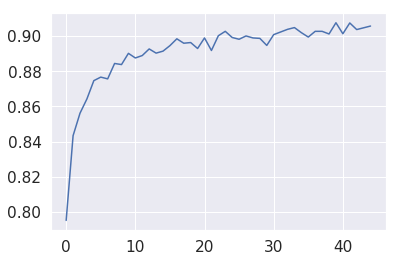

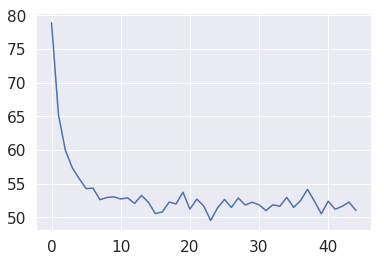

[7, 7, 0, 5, 7, 0, 2, 1, 1, 3, 0, 7, 7, 0, 4, 3, 1, 2, 1, 7, 0, 7, 0, 3, 1, 1, 3, 7, 7, 6, 7, 1, 0, 6, 0, 6, 7, 7, 7, 1, 0, 1, 3, 3, 1, 0, 0, 3, 1, 1, 3, 3, 0, 1, 7, 0, 2, 7, 1, 6, 2, 1, 2, 0, 0, 3, 3, 0, 1, 0, 0, 6, 0, 1, 3, 3, 0, 3, 3, 1, 3, 3, 3, 1, 1, 1, 0, 1, 1, 1, 1, 6, 6, 1, 3, 7, 0, 0, 0, 2, 7, 0, 6, 6, 0, 5, 0, 3, 0, 0, 1, 3, 3, 1, 0, 3, 7, 1, 4, 3, 3, 2, 7, 1, 0, 3, 3, 0, 3, 3, 5, 4, 3, 1, 0, 6, 1, 3, 0, 3, 1, 0, 3, 3, 3, 3, 0, 1, 3, 0, 2, 7, 1, 3, 3, 1, 3, 0, 0, 0, 6, 6, 7, 3, 7, 2, 6, 6, 3, 7, 1, 0, 3, 1, 4, 0, 5, 4, 2, 3, 0, 7, 3, 0, 0, 5, 6, 0, 1, 1, 3, 3, 0, 7, 0, 0, 0, 0, 1, 6, 7, 3, 7, 1, 0, 3, 6, 7, 1, 0, 0, 3, 3, 3, 1, 6, 0, 1, 6, 1, 6, 6, 0, 1, 2, 1, 0, 3, 1, 1, 6, 1, 6, 3, 0, 3, 0, 3, 3, 1, 2, 6, 4, 2, 1, 4, 2, 3, 0, 0, 0, 3, 6, 0, 1, 1, 1, 0, 0, 0, 2, 6, 1, 0, 0, 3, 5, 0, 1, 0, 0, 0, 0, 1, 3, 7, 1, 0, 0, 2, 4, 6, 6, 4, 7, 1, 0, 4, 6, 0, 0, 7, 1, 7, 3, 7, 2, 6, 0, 2, 0, 7, 7, 1, 7, 3, 3, 1, 6, 0, 1, 6, 3, 0, 7, 1, 3, 6, 0, 6, 6, 6, 7, 5, 1, 7, 3, 0, 7, 7, 0, 3, 6, 

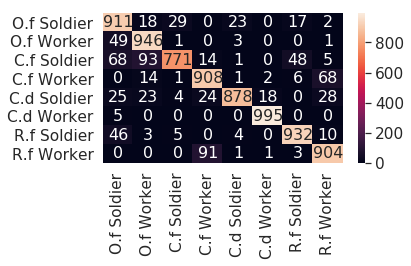

runtime :  10492.867467880249

[46] accuracy: 0.904 loss: 51.784

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52.657019414

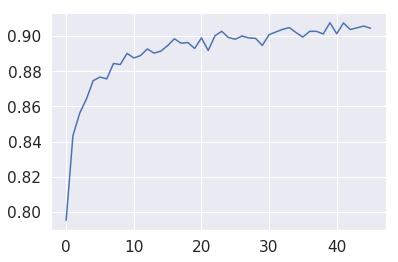

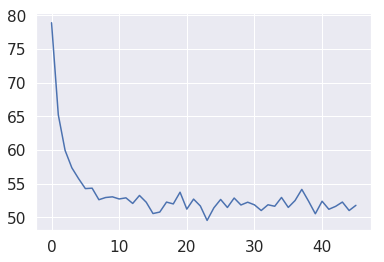

[0, 1, 0, 3, 6, 6, 3, 1, 7, 3, 1, 6, 1, 7, 0, 1, 0, 1, 3, 3, 6, 0, 0, 7, 0, 7, 0, 1, 1, 3, 3, 6, 6, 7, 5, 3, 1, 3, 0, 1, 3, 6, 1, 0, 7, 4, 0, 7, 0, 0, 3, 3, 3, 0, 7, 2, 2, 0, 0, 1, 7, 0, 3, 1, 0, 0, 0, 7, 3, 3, 0, 0, 0, 0, 0, 7, 1, 6, 7, 0, 3, 6, 6, 1, 1, 6, 3, 1, 0, 3, 1, 3, 6, 0, 7, 3, 0, 0, 1, 7, 0, 2, 7, 6, 6, 1, 3, 0, 7, 1, 3, 7, 2, 6, 1, 4, 3, 6, 7, 7, 3, 6, 5, 0, 0, 4, 1, 0, 6, 3, 7, 6, 1, 6, 3, 2, 0, 4, 2, 0, 7, 0, 7, 0, 1, 7, 2, 0, 0, 0, 1, 0, 3, 3, 3, 4, 5, 6, 0, 7, 3, 2, 3, 0, 3, 0, 3, 7, 6, 1, 0, 7, 7, 0, 1, 3, 1, 0, 6, 6, 1, 2, 1, 0, 6, 3, 3, 6, 1, 6, 7, 1, 7, 0, 2, 3, 3, 1, 1, 3, 3, 1, 6, 0, 0, 7, 1, 7, 0, 4, 3, 0, 7, 6, 1, 6, 3, 1, 3, 0, 4, 3, 7, 0, 1, 0, 3, 2, 3, 1, 2, 1, 1, 1, 0, 0, 7, 2, 5, 0, 0, 7, 1, 0, 0, 1, 1, 3, 7, 2, 7, 1, 7, 2, 3, 3, 1, 0, 7, 3, 3, 7, 3, 2, 3, 0, 7, 0, 3, 1, 7, 0, 0, 7, 6, 3, 3, 0, 6, 0, 7, 3, 4, 0, 3, 1, 1, 4, 6, 3, 0, 7, 3, 7, 1, 0, 0, 0, 0, 0, 1, 1, 7, 4, 0, 7, 0, 5, 1, 7, 0, 0, 0, 1, 2, 0, 4, 3, 6, 4, 4, 1, 5, 1, 1, 7, 7, 0, 1, 1, 2, 1, 3, 

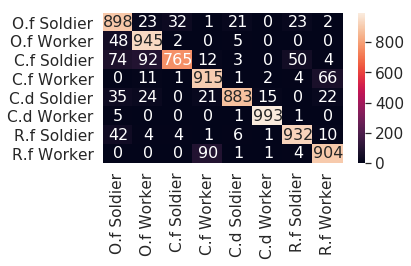

runtime :  10725.229865789413

[47] accuracy: 0.904 loss: 51.822

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700884342, 52

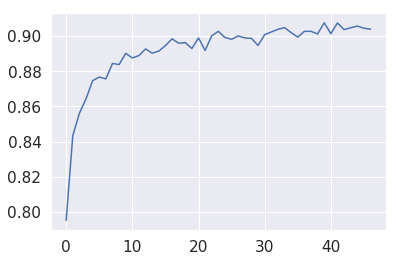

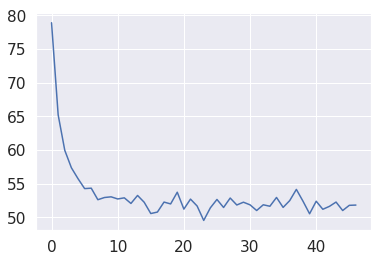

[3, 7, 0, 3, 0, 3, 7, 2, 6, 5, 0, 0, 6, 7, 0, 1, 6, 6, 6, 4, 6, 7, 7, 0, 1, 6, 7, 6, 1, 2, 1, 3, 1, 7, 7, 6, 4, 1, 1, 3, 0, 3, 0, 1, 2, 2, 0, 1, 3, 0, 3, 1, 1, 3, 1, 2, 7, 0, 2, 1, 3, 7, 0, 7, 5, 1, 4, 0, 1, 0, 0, 7, 2, 0, 0, 1, 7, 1, 1, 1, 1, 0, 7, 6, 1, 3, 7, 7, 0, 5, 6, 0, 6, 3, 3, 6, 3, 6, 6, 2, 0, 0, 0, 7, 4, 3, 3, 6, 3, 1, 7, 1, 0, 3, 1, 0, 7, 0, 1, 0, 6, 3, 0, 1, 0, 0, 7, 1, 3, 2, 7, 1, 3, 2, 7, 1, 0, 5, 0, 0, 0, 3, 7, 4, 2, 0, 2, 4, 6, 7, 7, 6, 0, 0, 3, 1, 0, 1, 6, 3, 7, 3, 0, 0, 0, 0, 0, 3, 7, 6, 1, 6, 1, 1, 4, 0, 5, 3, 1, 5, 4, 4, 1, 0, 6, 0, 0, 3, 7, 0, 5, 0, 0, 0, 6, 1, 5, 5, 0, 6, 5, 4, 2, 7, 1, 3, 3, 6, 2, 5, 0, 6, 2, 0, 1, 7, 1, 0, 4, 5, 6, 2, 7, 2, 3, 7, 0, 5, 6, 1, 5, 5, 1, 0, 7, 1, 1, 3, 2, 1, 1, 0, 1, 3, 6, 3, 0, 1, 0, 0, 1, 7, 0, 0, 1, 3, 3, 7, 1, 5, 7, 1, 6, 3, 1, 1, 0, 7, 1, 1, 1, 3, 3, 0, 5, 3, 0, 3, 0, 7, 1, 3, 7, 1, 5, 3, 7, 2, 7, 7, 0, 3, 3, 1, 3, 3, 1, 2, 0, 2, 0, 6, 3, 0, 2, 7, 0, 3, 5, 3, 7, 3, 3, 0, 3, 3, 1, 7, 1, 2, 0, 0, 0, 7, 1, 0, 1, 3, 0, 1, 7, 6, 7, 

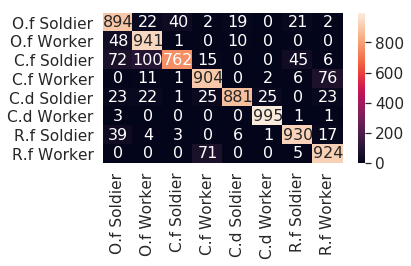

runtime :  10957.753920793533

[48] accuracy: 0.905 loss: 51.000

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 51.40982700

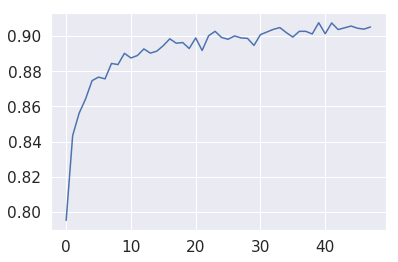

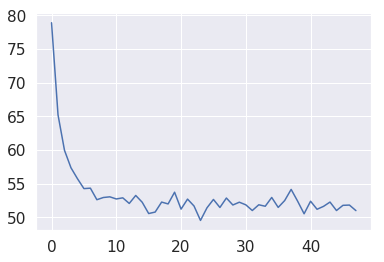

[7, 1, 3, 4, 7, 7, 1, 3, 7, 7, 3, 3, 1, 4, 6, 2, 1, 5, 0, 0, 0, 3, 1, 7, 0, 7, 4, 3, 7, 0, 6, 0, 4, 7, 3, 0, 1, 7, 3, 6, 4, 1, 5, 6, 1, 0, 3, 0, 7, 1, 6, 7, 7, 2, 2, 5, 7, 7, 0, 7, 1, 1, 0, 2, 2, 1, 0, 7, 7, 0, 7, 0, 0, 6, 1, 6, 0, 7, 3, 1, 5, 0, 5, 7, 1, 3, 7, 3, 0, 1, 1, 1, 1, 1, 1, 7, 3, 1, 3, 5, 1, 1, 3, 1, 7, 0, 3, 1, 0, 2, 5, 2, 0, 6, 0, 2, 1, 7, 0, 0, 4, 7, 3, 0, 3, 1, 1, 1, 7, 1, 0, 1, 0, 1, 7, 7, 7, 0, 1, 1, 2, 1, 1, 1, 0, 0, 2, 1, 7, 0, 0, 2, 2, 5, 1, 6, 4, 7, 6, 0, 4, 4, 2, 1, 3, 5, 0, 3, 4, 1, 7, 3, 1, 1, 0, 1, 6, 3, 0, 1, 5, 3, 7, 3, 7, 7, 7, 2, 6, 3, 0, 7, 0, 6, 1, 7, 0, 1, 0, 1, 2, 7, 0, 3, 0, 0, 3, 0, 4, 4, 1, 1, 1, 0, 1, 7, 1, 3, 4, 5, 0, 1, 3, 0, 2, 7, 7, 4, 2, 3, 0, 3, 2, 1, 0, 3, 7, 7, 1, 3, 0, 4, 1, 7, 2, 3, 7, 6, 1, 2, 3, 6, 1, 3, 0, 6, 0, 7, 5, 3, 6, 6, 1, 6, 0, 7, 3, 0, 7, 0, 6, 4, 6, 6, 0, 6, 7, 7, 1, 0, 1, 0, 4, 0, 0, 0, 1, 1, 0, 2, 0, 3, 1, 7, 0, 2, 2, 7, 0, 1, 1, 3, 3, 7, 1, 2, 7, 0, 1, 4, 1, 6, 3, 4, 6, 0, 3, 3, 3, 6, 3, 0, 7, 0, 6, 0, 7, 1, 1, 1, 4, 1, 1, 

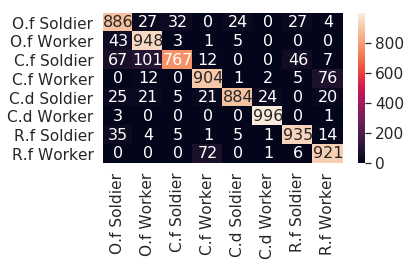

runtime :  11191.194556951523

[49] accuracy: 0.909 loss: 51.177

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.543524354696274, 5

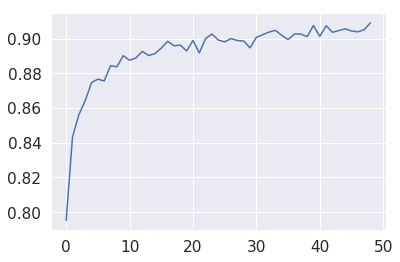

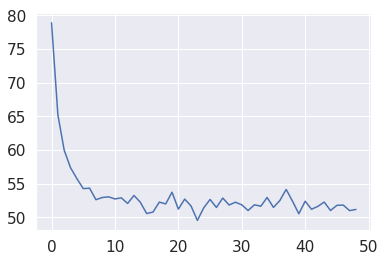

[1, 1, 3, 0, 7, 3, 0, 0, 2, 3, 0, 7, 7, 0, 1, 1, 0, 7, 7, 0, 0, 3, 1, 0, 0, 1, 3, 6, 5, 1, 1, 0, 2, 0, 0, 6, 3, 3, 5, 1, 2, 1, 3, 1, 6, 0, 4, 1, 7, 7, 6, 7, 6, 0, 1, 7, 3, 2, 7, 1, 1, 1, 2, 0, 7, 3, 7, 6, 5, 0, 1, 1, 4, 3, 7, 6, 7, 1, 3, 1, 1, 7, 0, 5, 6, 1, 4, 1, 6, 7, 0, 0, 7, 0, 4, 5, 1, 1, 0, 7, 3, 0, 1, 7, 1, 3, 1, 0, 1, 0, 0, 0, 6, 7, 1, 2, 5, 7, 0, 3, 3, 2, 6, 7, 2, 6, 1, 7, 1, 6, 6, 6, 3, 4, 1, 0, 1, 0, 0, 1, 4, 1, 1, 6, 0, 0, 3, 2, 7, 0, 3, 1, 3, 6, 5, 4, 1, 3, 7, 6, 1, 0, 3, 2, 7, 7, 6, 1, 6, 7, 7, 6, 3, 7, 1, 0, 1, 7, 2, 6, 0, 1, 0, 0, 6, 3, 4, 0, 1, 7, 0, 4, 1, 4, 6, 7, 6, 0, 6, 0, 2, 7, 0, 0, 6, 3, 1, 6, 0, 1, 2, 0, 3, 0, 3, 1, 0, 7, 0, 1, 1, 6, 3, 7, 3, 1, 3, 6, 0, 3, 0, 5, 6, 7, 1, 3, 1, 3, 0, 1, 1, 6, 3, 3, 0, 6, 7, 4, 5, 7, 0, 3, 6, 2, 3, 1, 0, 0, 0, 2, 7, 7, 2, 0, 2, 2, 2, 0, 0, 0, 7, 1, 0, 2, 0, 3, 1, 0, 3, 7, 7, 1, 7, 1, 0, 1, 1, 5, 1, 0, 6, 1, 3, 1, 2, 6, 0, 3, 0, 7, 0, 0, 0, 0, 3, 3, 7, 0, 1, 0, 0, 3, 4, 1, 1, 7, 4, 7, 1, 7, 1, 0, 6, 7, 1, 3, 2, 7, 7, 1, 5, 7, 2, 

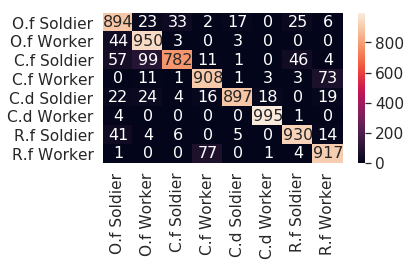

runtime :  11424.860733509064

[50] accuracy: 0.907 loss: 50.879

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49.54352435

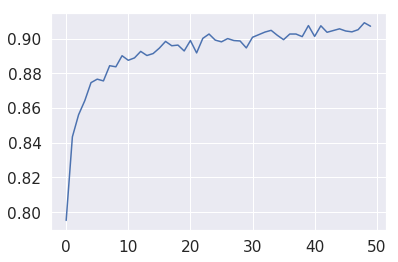

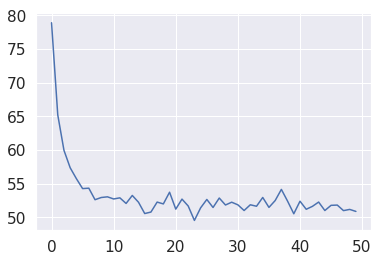

[6, 6, 3, 4, 1, 3, 0, 5, 0, 0, 2, 0, 0, 2, 0, 1, 4, 3, 0, 1, 1, 7, 7, 0, 6, 7, 1, 2, 3, 1, 6, 2, 6, 1, 6, 0, 6, 2, 0, 0, 3, 1, 0, 1, 1, 0, 1, 0, 7, 2, 3, 7, 7, 0, 3, 7, 7, 1, 1, 1, 6, 0, 3, 1, 0, 1, 6, 0, 4, 0, 0, 4, 1, 0, 7, 4, 0, 1, 7, 0, 6, 0, 1, 1, 0, 2, 1, 0, 0, 6, 3, 1, 2, 0, 7, 6, 1, 2, 6, 1, 6, 1, 3, 1, 2, 3, 3, 4, 0, 6, 3, 1, 5, 0, 1, 7, 0, 7, 7, 6, 0, 6, 4, 0, 7, 2, 0, 1, 7, 7, 7, 1, 7, 7, 6, 1, 1, 7, 2, 6, 7, 0, 1, 0, 1, 0, 1, 1, 0, 0, 4, 3, 0, 3, 1, 0, 3, 1, 7, 3, 6, 5, 4, 6, 1, 7, 3, 2, 2, 5, 7, 7, 5, 1, 6, 3, 3, 3, 5, 0, 7, 7, 6, 6, 4, 4, 1, 0, 1, 3, 0, 1, 0, 1, 0, 6, 3, 7, 3, 0, 3, 0, 3, 1, 6, 3, 0, 1, 2, 1, 1, 0, 0, 7, 7, 0, 0, 1, 4, 7, 7, 4, 2, 0, 0, 3, 1, 3, 5, 7, 1, 0, 1, 1, 2, 1, 6, 7, 6, 0, 0, 0, 0, 1, 2, 4, 1, 1, 2, 1, 0, 0, 3, 3, 1, 2, 1, 1, 3, 0, 6, 0, 1, 1, 1, 1, 1, 2, 0, 7, 3, 3, 1, 1, 7, 6, 6, 3, 0, 6, 0, 0, 0, 5, 0, 4, 4, 6, 7, 3, 7, 5, 3, 0, 7, 0, 7, 5, 3, 0, 2, 0, 0, 3, 3, 7, 1, 1, 3, 7, 1, 3, 1, 1, 3, 6, 1, 1, 0, 1, 7, 0, 7, 7, 1, 1, 7, 7, 1, 0, 1, 6, 3, 

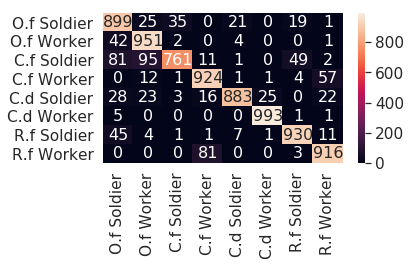

runtime :  11659.26706957817

[51] accuracy: 0.907 loss: 51.748

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.68567790836096, 49

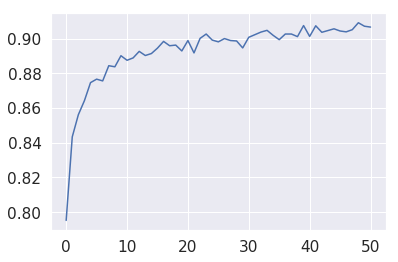

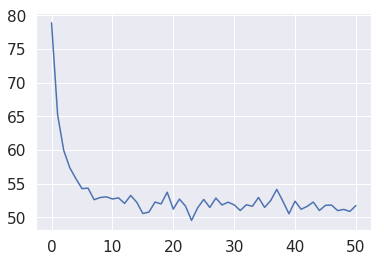

[0, 7, 3, 1, 6, 7, 0, 1, 5, 7, 3, 1, 2, 3, 5, 4, 5, 0, 7, 2, 1, 6, 4, 3, 1, 1, 7, 1, 0, 0, 1, 2, 7, 0, 0, 3, 0, 5, 0, 0, 1, 0, 0, 6, 0, 0, 0, 3, 6, 0, 5, 1, 7, 7, 7, 3, 7, 6, 1, 7, 1, 6, 6, 1, 0, 7, 1, 1, 6, 1, 2, 3, 7, 1, 0, 3, 3, 1, 0, 0, 1, 6, 1, 0, 0, 0, 6, 2, 4, 3, 7, 6, 6, 7, 7, 5, 7, 6, 1, 6, 3, 7, 7, 6, 3, 0, 7, 0, 6, 7, 3, 0, 2, 7, 3, 2, 1, 3, 3, 1, 0, 6, 6, 0, 3, 2, 2, 0, 0, 6, 6, 0, 3, 6, 6, 6, 6, 6, 2, 7, 3, 6, 4, 2, 6, 7, 0, 3, 7, 1, 0, 7, 0, 6, 7, 0, 6, 7, 0, 1, 6, 3, 6, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 3, 2, 1, 6, 1, 3, 7, 1, 1, 1, 0, 3, 6, 7, 0, 7, 3, 3, 3, 6, 1, 1, 6, 0, 1, 1, 3, 6, 1, 3, 6, 6, 6, 5, 4, 2, 1, 3, 0, 0, 1, 3, 2, 1, 0, 1, 6, 7, 0, 1, 0, 6, 3, 0, 7, 1, 5, 4, 7, 0, 0, 0, 0, 7, 3, 7, 7, 1, 0, 3, 1, 4, 7, 1, 3, 6, 3, 1, 1, 1, 0, 1, 4, 3, 7, 0, 0, 3, 2, 3, 6, 7, 1, 0, 3, 2, 5, 0, 0, 1, 3, 0, 0, 3, 1, 2, 1, 7, 6, 3, 3, 6, 3, 1, 5, 0, 5, 7, 7, 1, 1, 1, 7, 7, 3, 0, 2, 2, 6, 0, 3, 0, 6, 2, 0, 6, 0, 1, 3, 1, 7, 0, 7, 7, 1, 2, 7, 1, 5, 1, 5, 3, 2, 0, 0, 7, 6, 6, 3, 

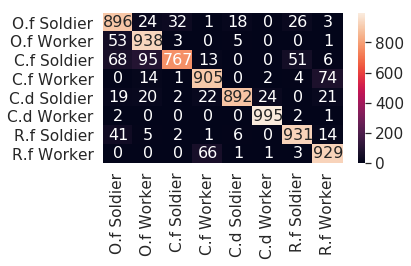

runtime :  11893.459374189377

[52] accuracy: 0.906 loss: 53.535

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.6856779

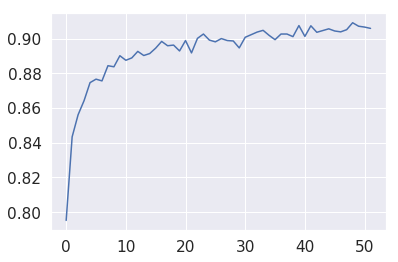

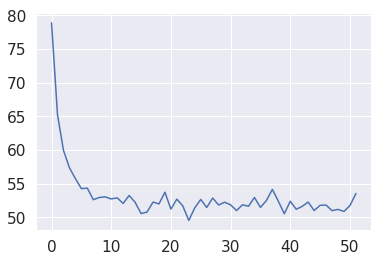

[2, 3, 2, 6, 3, 3, 7, 0, 1, 7, 1, 3, 0, 7, 3, 0, 7, 0, 7, 3, 6, 0, 3, 2, 3, 1, 3, 5, 2, 4, 6, 3, 2, 0, 0, 7, 1, 4, 3, 0, 0, 4, 7, 6, 1, 4, 4, 7, 0, 4, 7, 1, 0, 1, 1, 5, 5, 2, 7, 6, 1, 1, 0, 3, 0, 7, 0, 6, 0, 0, 0, 1, 1, 0, 0, 0, 4, 1, 0, 4, 0, 6, 0, 1, 7, 0, 1, 1, 1, 6, 0, 1, 3, 4, 1, 6, 0, 3, 5, 6, 3, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 3, 0, 6, 0, 7, 7, 2, 1, 7, 1, 0, 5, 0, 3, 0, 0, 3, 3, 1, 3, 6, 7, 6, 0, 7, 5, 6, 7, 1, 7, 3, 1, 1, 0, 1, 0, 0, 3, 0, 0, 7, 7, 0, 6, 3, 1, 0, 0, 3, 7, 0, 6, 5, 0, 0, 7, 3, 7, 7, 6, 4, 0, 1, 0, 3, 0, 1, 3, 7, 7, 6, 7, 6, 3, 3, 5, 3, 3, 3, 7, 5, 1, 5, 1, 7, 7, 7, 1, 3, 0, 7, 3, 0, 1, 0, 0, 3, 1, 3, 0, 5, 0, 7, 3, 1, 1, 4, 0, 7, 0, 1, 1, 0, 5, 0, 7, 7, 1, 4, 2, 3, 1, 4, 6, 1, 0, 0, 3, 3, 7, 4, 1, 7, 1, 0, 3, 7, 6, 4, 2, 3, 0, 6, 0, 4, 0, 0, 0, 7, 3, 5, 3, 1, 5, 2, 6, 0, 3, 0, 0, 7, 1, 0, 7, 7, 6, 0, 0, 6, 5, 7, 5, 1, 0, 1, 1, 7, 2, 1, 2, 0, 0, 7, 0, 1, 3, 1, 0, 0, 7, 0, 1, 0, 6, 7, 6, 3, 2, 3, 2, 3, 0, 2, 4, 0, 0, 3, 2, 6, 0, 1, 1, 1, 0, 1, 0, 1, 

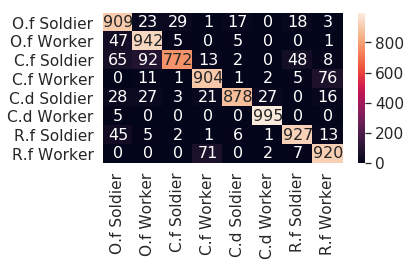

runtime :  12128.402552843094

[53] accuracy: 0.904 loss: 53.161

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.70830298960209, 51.

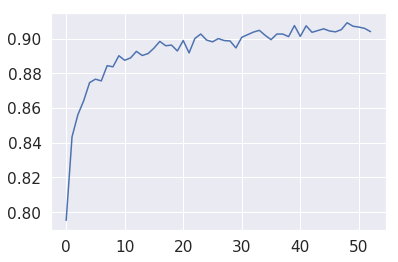

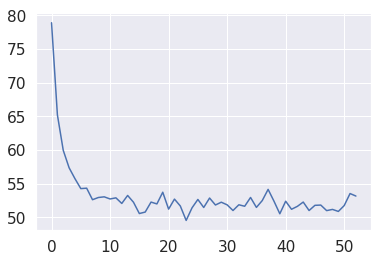

[7, 3, 1, 0, 6, 1, 3, 7, 6, 6, 6, 1, 0, 7, 5, 0, 3, 1, 0, 5, 2, 0, 1, 1, 3, 0, 7, 1, 0, 6, 2, 5, 3, 1, 4, 3, 0, 7, 0, 6, 0, 7, 7, 1, 7, 7, 7, 3, 4, 3, 7, 0, 7, 1, 2, 2, 7, 3, 6, 3, 1, 6, 5, 0, 7, 1, 1, 1, 0, 4, 1, 3, 0, 7, 0, 6, 7, 0, 6, 1, 4, 7, 4, 1, 6, 3, 2, 3, 0, 1, 1, 1, 2, 2, 3, 0, 1, 7, 0, 7, 6, 0, 3, 1, 7, 6, 2, 0, 6, 7, 1, 7, 0, 0, 0, 3, 1, 1, 0, 7, 4, 3, 0, 3, 6, 1, 1, 3, 2, 2, 5, 0, 3, 3, 6, 3, 1, 0, 2, 2, 6, 0, 3, 1, 0, 0, 0, 7, 3, 0, 6, 3, 3, 6, 4, 0, 5, 7, 0, 1, 1, 1, 4, 6, 1, 3, 5, 0, 0, 1, 5, 0, 2, 1, 0, 6, 2, 7, 0, 7, 0, 1, 0, 0, 3, 6, 0, 4, 4, 1, 7, 5, 0, 0, 1, 1, 0, 1, 3, 0, 0, 0, 7, 1, 5, 0, 3, 0, 6, 1, 1, 1, 7, 0, 6, 0, 1, 6, 7, 7, 5, 1, 0, 0, 1, 0, 3, 7, 7, 5, 0, 0, 3, 0, 1, 1, 0, 7, 0, 1, 1, 1, 3, 3, 3, 1, 0, 2, 6, 1, 3, 0, 7, 2, 1, 7, 0, 1, 1, 0, 0, 7, 1, 3, 0, 0, 6, 7, 0, 0, 0, 3, 7, 0, 1, 0, 0, 0, 1, 7, 6, 1, 3, 3, 0, 6, 1, 1, 3, 3, 1, 1, 0, 1, 3, 7, 0, 0, 2, 7, 3, 7, 7, 1, 1, 0, 4, 7, 1, 4, 6, 1, 1, 3, 6, 0, 0, 7, 1, 7, 1, 3, 1, 0, 4, 0, 5, 7, 0, 3, 7, 0, 3, 

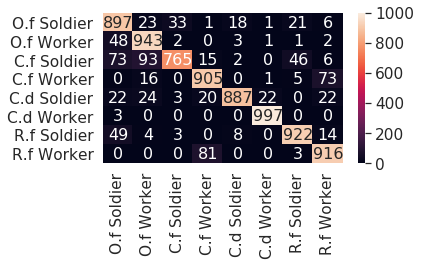

runtime :  12360.254868745804

[54] accuracy: 0.906 loss: 52.499

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.7083029896

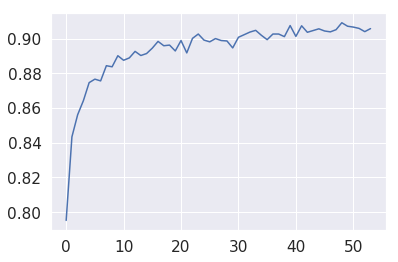

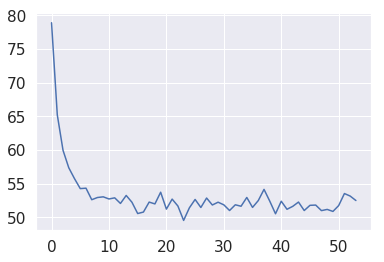

[2, 0, 1, 1, 0, 5, 1, 5, 1, 1, 0, 7, 3, 1, 7, 1, 7, 0, 5, 1, 3, 4, 1, 7, 7, 5, 3, 1, 0, 3, 7, 7, 1, 3, 7, 0, 1, 0, 0, 0, 0, 0, 1, 1, 4, 7, 7, 6, 3, 6, 3, 1, 1, 5, 3, 5, 0, 3, 3, 1, 7, 2, 0, 0, 0, 1, 6, 0, 6, 5, 7, 2, 6, 1, 6, 4, 0, 1, 7, 7, 1, 3, 0, 2, 3, 7, 0, 7, 1, 0, 3, 1, 7, 0, 7, 7, 0, 1, 0, 7, 7, 1, 3, 4, 1, 3, 0, 0, 0, 0, 3, 1, 7, 7, 4, 0, 1, 0, 7, 0, 1, 7, 6, 7, 1, 0, 0, 6, 2, 1, 0, 0, 6, 7, 3, 1, 0, 1, 0, 4, 6, 0, 7, 5, 7, 7, 0, 0, 0, 3, 6, 0, 7, 5, 7, 0, 5, 3, 6, 2, 0, 3, 1, 7, 0, 1, 3, 7, 2, 1, 0, 1, 0, 6, 6, 2, 2, 7, 1, 5, 7, 3, 6, 7, 0, 3, 3, 3, 0, 7, 2, 3, 3, 3, 0, 4, 7, 6, 3, 0, 4, 0, 6, 5, 0, 1, 7, 1, 0, 3, 4, 1, 0, 2, 7, 0, 6, 1, 3, 3, 0, 3, 0, 3, 0, 1, 0, 2, 3, 5, 6, 3, 2, 0, 3, 0, 3, 3, 3, 7, 6, 6, 1, 2, 7, 0, 0, 0, 1, 0, 4, 2, 4, 7, 7, 3, 1, 1, 2, 0, 6, 5, 0, 7, 4, 5, 1, 7, 2, 3, 6, 1, 1, 1, 7, 6, 2, 1, 3, 1, 6, 0, 3, 6, 3, 3, 0, 6, 3, 1, 4, 1, 7, 3, 0, 5, 4, 7, 2, 0, 6, 2, 1, 1, 6, 5, 1, 6, 3, 7, 2, 6, 6, 0, 6, 1, 7, 7, 1, 1, 0, 1, 1, 7, 0, 3, 7, 7, 1, 7, 6, 2, 2, 

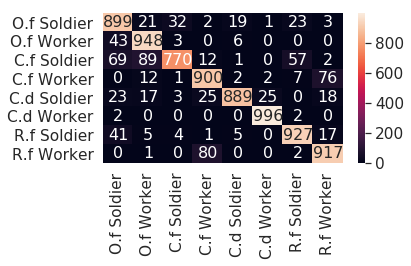

runtime :  12594.691960811615

[55] accuracy: 0.901 loss: 53.064

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.22133556008339, 52.

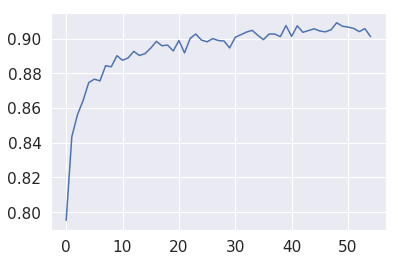

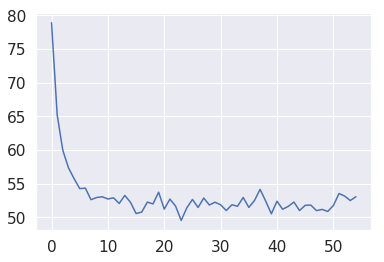

[0, 4, 3, 6, 7, 0, 2, 7, 3, 3, 7, 7, 6, 6, 2, 7, 1, 6, 0, 3, 6, 1, 1, 1, 1, 3, 3, 3, 1, 7, 1, 0, 7, 7, 6, 0, 0, 3, 6, 1, 0, 3, 1, 4, 1, 3, 7, 0, 3, 6, 5, 3, 2, 6, 3, 4, 7, 0, 1, 6, 3, 7, 7, 0, 6, 3, 0, 1, 6, 7, 7, 5, 4, 1, 3, 7, 6, 0, 7, 6, 1, 1, 7, 0, 6, 0, 5, 4, 0, 0, 6, 4, 0, 0, 0, 6, 7, 1, 0, 0, 3, 0, 1, 7, 2, 0, 1, 6, 0, 7, 3, 1, 1, 0, 3, 2, 3, 7, 5, 7, 1, 2, 0, 3, 3, 1, 0, 3, 3, 0, 0, 1, 0, 3, 7, 3, 3, 1, 3, 1, 7, 1, 1, 0, 0, 3, 2, 5, 0, 1, 0, 0, 7, 3, 2, 1, 0, 2, 6, 1, 0, 7, 6, 1, 6, 7, 7, 5, 7, 6, 4, 1, 0, 0, 1, 4, 7, 4, 0, 4, 7, 1, 7, 5, 0, 5, 2, 2, 6, 0, 3, 3, 3, 7, 7, 2, 7, 0, 0, 6, 3, 6, 1, 1, 2, 7, 0, 3, 7, 4, 0, 7, 3, 3, 0, 3, 3, 2, 0, 1, 1, 3, 1, 1, 3, 6, 0, 3, 0, 6, 7, 0, 0, 1, 1, 0, 0, 0, 5, 0, 6, 7, 7, 0, 7, 3, 0, 1, 1, 1, 0, 6, 7, 7, 7, 0, 3, 0, 0, 0, 3, 0, 7, 1, 1, 1, 2, 1, 6, 7, 7, 1, 1, 7, 7, 0, 3, 0, 1, 5, 0, 6, 5, 1, 1, 0, 1, 3, 1, 6, 7, 0, 1, 0, 7, 7, 0, 7, 4, 1, 0, 0, 1, 0, 6, 3, 0, 3, 0, 2, 0, 0, 3, 0, 1, 0, 5, 1, 0, 6, 4, 1, 0, 2, 0, 3, 6, 4, 0, 0, 0, 2, 0, 

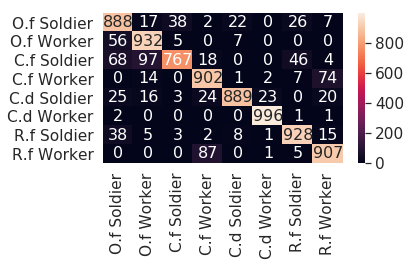

runtime :  12830.040966033936

[56] accuracy: 0.908 loss: 52.800

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.221335560

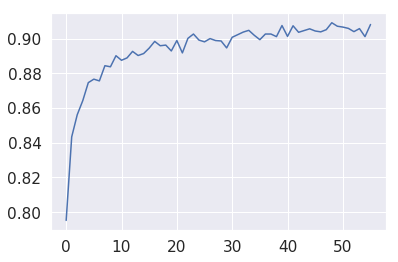

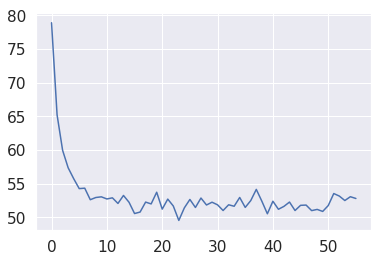

[7, 1, 4, 0, 0, 3, 1, 7, 1, 7, 1, 1, 0, 3, 5, 6, 6, 1, 0, 1, 7, 2, 3, 0, 6, 2, 0, 1, 7, 2, 0, 2, 1, 1, 4, 3, 7, 1, 1, 1, 0, 3, 1, 5, 3, 3, 0, 7, 0, 0, 7, 7, 7, 5, 1, 3, 3, 1, 3, 3, 0, 3, 3, 5, 0, 3, 7, 3, 3, 3, 1, 1, 3, 1, 2, 5, 7, 7, 6, 0, 3, 3, 6, 5, 2, 3, 0, 0, 6, 1, 3, 2, 0, 5, 7, 6, 6, 1, 0, 6, 0, 2, 7, 1, 3, 4, 1, 1, 1, 7, 7, 0, 1, 6, 7, 6, 0, 0, 1, 6, 4, 7, 0, 0, 1, 2, 1, 3, 3, 1, 4, 1, 6, 2, 0, 1, 3, 2, 1, 7, 7, 3, 1, 0, 0, 0, 2, 0, 5, 3, 6, 5, 0, 0, 1, 5, 5, 0, 1, 1, 0, 0, 1, 0, 1, 7, 1, 1, 0, 4, 7, 0, 7, 7, 6, 2, 3, 1, 0, 6, 6, 1, 5, 7, 5, 3, 1, 1, 1, 7, 0, 7, 7, 1, 0, 1, 0, 3, 5, 2, 1, 3, 1, 1, 4, 4, 3, 7, 6, 0, 6, 3, 1, 4, 4, 0, 0, 0, 1, 1, 2, 5, 0, 3, 0, 7, 2, 0, 1, 5, 6, 6, 1, 7, 0, 0, 1, 3, 1, 7, 2, 3, 2, 3, 7, 1, 1, 1, 3, 7, 6, 7, 1, 0, 0, 0, 0, 7, 0, 1, 7, 1, 1, 1, 6, 3, 1, 3, 1, 1, 2, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 3, 3, 0, 7, 0, 3, 0, 3, 3, 5, 3, 0, 0, 7, 0, 3, 7, 7, 6, 7, 0, 2, 0, 0, 3, 0, 0, 0, 7, 0, 0, 0, 7, 0, 6, 1, 0, 7, 1, 7, 3, 4, 4, 0, 0, 0, 0, 6, 5, 0, 5, 

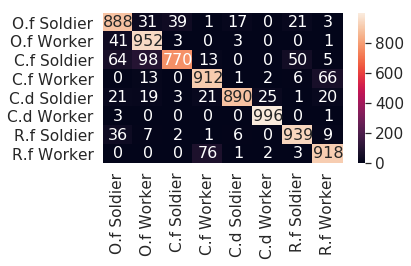

runtime :  13064.136797428131

[57] accuracy: 0.908 loss: 52.372

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73082584142685, 51.

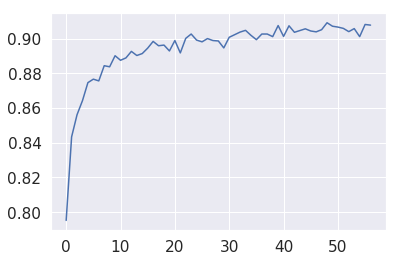

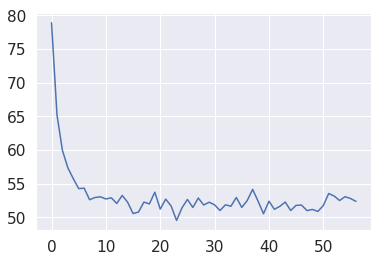

[7, 3, 6, 3, 0, 6, 0, 0, 3, 3, 1, 1, 0, 1, 3, 6, 7, 6, 7, 3, 3, 0, 0, 7, 7, 0, 5, 1, 2, 7, 3, 0, 6, 1, 1, 1, 7, 0, 3, 0, 7, 7, 0, 1, 1, 7, 0, 0, 1, 0, 3, 7, 0, 0, 1, 3, 4, 7, 2, 0, 7, 7, 7, 3, 0, 7, 7, 0, 3, 7, 3, 1, 3, 7, 3, 1, 6, 6, 1, 4, 0, 1, 6, 4, 0, 5, 3, 0, 7, 1, 0, 1, 1, 3, 7, 3, 7, 1, 1, 3, 3, 4, 5, 6, 4, 3, 3, 0, 3, 6, 7, 6, 0, 0, 7, 1, 0, 7, 7, 0, 6, 0, 6, 1, 6, 3, 1, 0, 1, 1, 0, 6, 1, 1, 7, 1, 5, 1, 1, 1, 7, 7, 2, 7, 1, 1, 0, 2, 6, 1, 0, 0, 3, 0, 3, 6, 1, 1, 3, 0, 5, 4, 6, 4, 0, 6, 3, 0, 0, 0, 0, 0, 4, 6, 6, 0, 7, 1, 6, 7, 3, 1, 6, 1, 0, 3, 0, 1, 0, 1, 3, 0, 3, 1, 1, 6, 2, 1, 6, 7, 7, 7, 6, 0, 6, 1, 5, 6, 6, 1, 7, 0, 1, 6, 5, 0, 7, 1, 1, 3, 7, 5, 0, 1, 2, 1, 3, 7, 1, 6, 0, 5, 1, 0, 5, 0, 1, 5, 1, 4, 7, 1, 0, 1, 6, 0, 7, 0, 1, 1, 6, 3, 4, 3, 1, 0, 3, 1, 3, 0, 7, 6, 0, 6, 0, 0, 3, 0, 0, 2, 4, 0, 4, 3, 1, 3, 0, 1, 3, 5, 7, 0, 7, 1, 4, 0, 0, 0, 3, 1, 3, 0, 0, 1, 3, 1, 7, 2, 0, 6, 6, 4, 6, 6, 6, 0, 1, 7, 7, 5, 1, 0, 4, 0, 2, 1, 3, 1, 0, 0, 6, 6, 1, 7, 5, 1, 1, 7, 0, 6, 0, 6, 6, 

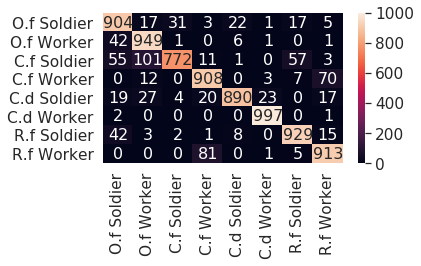

runtime :  13295.331508398056

[58] accuracy: 0.907 loss: 52.078

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.730825841

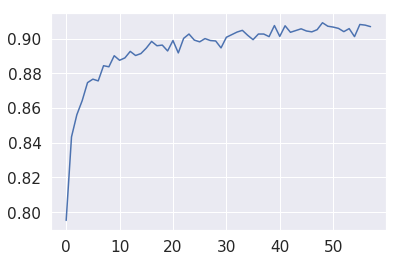

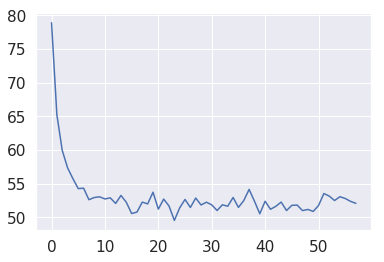

[1, 1, 4, 0, 3, 3, 3, 7, 7, 0, 7, 6, 1, 7, 1, 3, 7, 1, 1, 0, 3, 3, 6, 3, 0, 6, 7, 4, 7, 0, 6, 1, 2, 7, 7, 1, 6, 7, 1, 7, 0, 7, 1, 6, 3, 3, 1, 7, 5, 4, 7, 7, 0, 0, 7, 5, 3, 0, 1, 5, 1, 5, 2, 0, 3, 1, 7, 1, 2, 6, 0, 6, 7, 6, 7, 7, 7, 6, 1, 7, 7, 2, 3, 1, 0, 0, 7, 0, 7, 5, 3, 0, 2, 7, 2, 7, 6, 7, 0, 1, 7, 6, 6, 0, 1, 1, 6, 1, 0, 0, 7, 6, 3, 3, 0, 2, 7, 4, 1, 0, 6, 1, 3, 0, 0, 0, 7, 3, 0, 3, 1, 1, 7, 7, 1, 5, 7, 6, 0, 4, 0, 1, 2, 0, 3, 1, 1, 7, 6, 3, 6, 1, 3, 5, 1, 3, 7, 4, 2, 4, 0, 3, 7, 0, 2, 1, 0, 3, 0, 0, 0, 0, 1, 0, 1, 1, 7, 4, 1, 0, 2, 0, 0, 0, 2, 0, 4, 6, 5, 2, 3, 1, 0, 6, 3, 1, 2, 0, 1, 0, 0, 1, 0, 7, 0, 0, 0, 3, 7, 0, 5, 0, 0, 0, 4, 1, 1, 4, 1, 6, 1, 1, 0, 7, 1, 0, 3, 0, 0, 3, 1, 2, 0, 3, 0, 7, 1, 1, 3, 0, 4, 1, 6, 6, 0, 7, 3, 1, 1, 3, 0, 6, 4, 4, 2, 1, 1, 0, 0, 1, 7, 1, 7, 0, 1, 0, 2, 7, 1, 7, 0, 0, 3, 0, 3, 0, 1, 4, 0, 7, 0, 7, 3, 1, 1, 2, 7, 0, 1, 3, 0, 6, 0, 6, 0, 7, 7, 7, 1, 6, 0, 6, 7, 7, 0, 3, 7, 2, 1, 2, 3, 4, 0, 1, 0, 2, 6, 7, 3, 7, 2, 6, 1, 6, 1, 0, 0, 0, 0, 7, 7, 7, 3, 

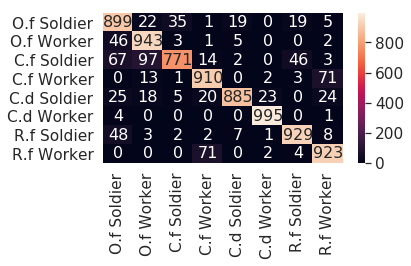

runtime :  13532.759075164795

[59] accuracy: 0.905 loss: 52.647

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99394977837801, 53.73

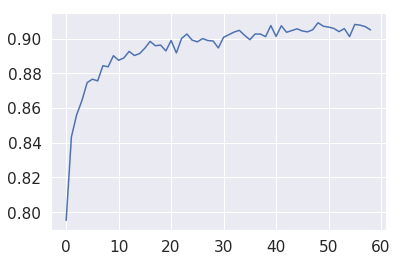

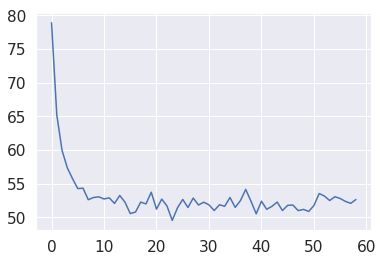

[0, 1, 7, 0, 0, 1, 0, 7, 3, 1, 2, 6, 3, 7, 1, 0, 1, 7, 3, 1, 0, 1, 4, 1, 0, 7, 1, 7, 7, 0, 7, 0, 1, 0, 2, 3, 1, 0, 6, 1, 6, 3, 3, 7, 7, 7, 1, 0, 7, 0, 1, 0, 1, 4, 3, 3, 6, 0, 7, 6, 7, 4, 0, 4, 3, 1, 1, 0, 0, 7, 1, 0, 3, 0, 1, 2, 1, 7, 6, 0, 0, 4, 3, 1, 1, 1, 0, 3, 6, 4, 6, 3, 3, 1, 0, 7, 1, 6, 7, 1, 0, 0, 0, 1, 0, 3, 7, 7, 0, 3, 7, 1, 2, 3, 3, 1, 6, 6, 6, 6, 5, 5, 1, 0, 6, 4, 0, 3, 6, 6, 0, 6, 7, 1, 3, 1, 1, 2, 7, 3, 6, 6, 4, 7, 7, 7, 0, 1, 4, 6, 0, 1, 4, 3, 1, 0, 0, 0, 0, 0, 0, 6, 2, 0, 0, 0, 1, 7, 2, 1, 3, 0, 0, 1, 5, 1, 0, 5, 0, 3, 2, 6, 0, 0, 0, 2, 1, 7, 0, 2, 2, 3, 3, 3, 0, 7, 0, 1, 3, 0, 1, 1, 3, 3, 4, 3, 3, 3, 3, 0, 6, 1, 6, 2, 6, 2, 3, 7, 7, 7, 6, 3, 1, 1, 6, 2, 7, 4, 0, 4, 7, 3, 6, 0, 6, 7, 0, 5, 0, 0, 3, 3, 5, 0, 0, 3, 3, 3, 1, 1, 5, 7, 0, 6, 4, 5, 7, 3, 1, 7, 1, 2, 4, 0, 1, 0, 1, 3, 0, 0, 5, 0, 6, 6, 7, 1, 0, 0, 1, 2, 7, 6, 0, 0, 3, 0, 1, 0, 4, 2, 6, 5, 7, 6, 1, 1, 0, 5, 1, 1, 1, 3, 7, 1, 0, 3, 1, 1, 7, 5, 0, 7, 6, 3, 1, 6, 3, 0, 1, 7, 3, 0, 0, 4, 0, 7, 0, 1, 7, 1, 7, 6, 0, 

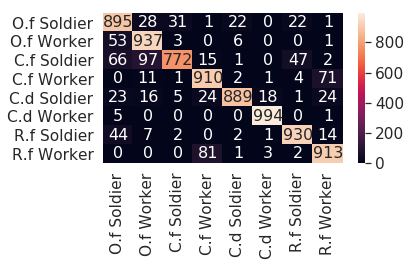

runtime :  13767.400922775269

[60] accuracy: 0.904 loss: 53.145

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.993949778378

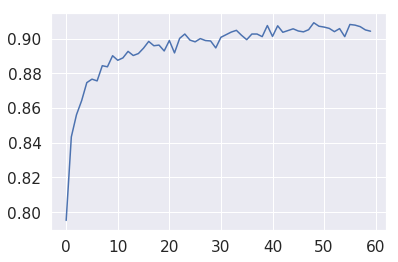

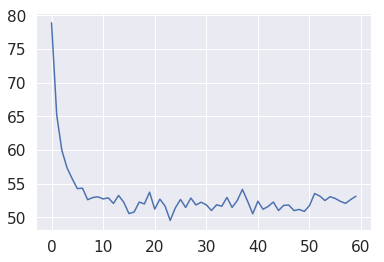

[7, 1, 7, 0, 1, 7, 0, 2, 0, 1, 7, 3, 1, 1, 6, 3, 7, 4, 4, 3, 6, 1, 0, 0, 7, 3, 4, 5, 7, 7, 3, 4, 1, 1, 7, 1, 7, 1, 0, 6, 1, 3, 3, 1, 1, 3, 3, 1, 3, 0, 2, 2, 3, 1, 6, 1, 0, 7, 7, 0, 0, 0, 2, 0, 0, 7, 2, 1, 0, 7, 3, 2, 1, 3, 3, 0, 0, 3, 0, 1, 0, 6, 1, 0, 3, 0, 3, 3, 2, 7, 0, 7, 4, 3, 6, 1, 1, 3, 1, 6, 3, 1, 7, 1, 7, 0, 7, 3, 6, 1, 3, 1, 1, 7, 1, 6, 3, 0, 1, 6, 0, 1, 3, 1, 0, 1, 2, 3, 1, 1, 2, 7, 6, 4, 7, 0, 7, 1, 0, 5, 0, 1, 7, 4, 3, 3, 5, 1, 6, 0, 1, 3, 0, 3, 2, 0, 1, 7, 7, 1, 3, 1, 5, 7, 0, 3, 1, 6, 1, 4, 0, 1, 1, 7, 7, 1, 0, 2, 6, 1, 0, 6, 1, 6, 0, 6, 7, 0, 3, 6, 0, 0, 1, 7, 2, 2, 0, 6, 7, 5, 7, 1, 4, 0, 3, 1, 0, 3, 0, 0, 7, 7, 1, 6, 1, 4, 3, 3, 3, 3, 3, 1, 0, 0, 1, 0, 1, 3, 1, 0, 3, 1, 0, 7, 0, 7, 1, 0, 2, 1, 3, 0, 0, 0, 7, 0, 4, 1, 0, 7, 4, 0, 7, 7, 2, 0, 3, 2, 0, 7, 0, 0, 6, 0, 2, 7, 2, 7, 1, 1, 1, 3, 1, 1, 3, 0, 4, 4, 1, 4, 7, 0, 5, 0, 1, 2, 7, 2, 7, 1, 0, 0, 1, 5, 7, 0, 6, 6, 1, 3, 1, 0, 7, 1, 0, 1, 2, 0, 3, 7, 6, 3, 2, 2, 0, 1, 1, 3, 0, 2, 2, 1, 3, 6, 0, 0, 7, 6, 0, 1, 2, 3, 7, 

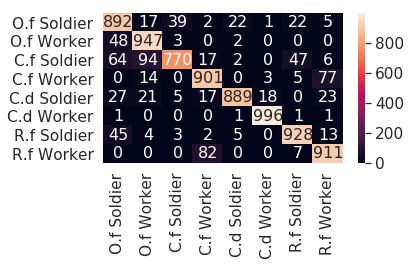

runtime :  14001.731475830078

[61] accuracy: 0.903 loss: 52.026

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965988, 51.99

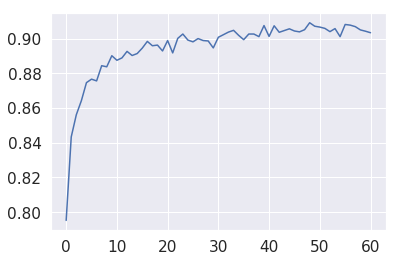

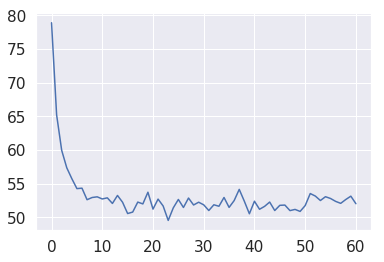

[2, 6, 0, 0, 6, 1, 7, 3, 6, 0, 5, 7, 0, 5, 7, 2, 1, 7, 0, 7, 2, 1, 4, 0, 0, 4, 7, 4, 6, 1, 0, 0, 0, 3, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 3, 7, 7, 0, 7, 3, 7, 3, 3, 1, 1, 1, 0, 2, 1, 0, 5, 3, 3, 5, 0, 7, 3, 3, 1, 1, 7, 1, 0, 2, 3, 3, 7, 6, 0, 7, 7, 6, 2, 7, 1, 6, 3, 0, 6, 7, 0, 1, 7, 1, 0, 3, 6, 6, 3, 0, 7, 2, 7, 6, 7, 3, 7, 0, 1, 0, 2, 6, 7, 1, 7, 7, 7, 1, 7, 4, 0, 6, 1, 1, 3, 0, 6, 2, 3, 0, 0, 0, 7, 1, 1, 0, 7, 1, 1, 1, 0, 6, 7, 0, 0, 0, 6, 0, 4, 0, 0, 1, 7, 7, 5, 4, 0, 1, 4, 3, 1, 6, 0, 3, 2, 6, 3, 7, 7, 0, 3, 3, 3, 7, 7, 1, 0, 1, 0, 0, 1, 0, 3, 3, 1, 7, 6, 1, 0, 4, 0, 1, 0, 1, 1, 0, 7, 1, 0, 3, 1, 7, 3, 1, 0, 0, 5, 1, 0, 4, 7, 1, 7, 0, 1, 0, 7, 0, 0, 7, 3, 1, 1, 0, 7, 7, 0, 0, 6, 4, 3, 3, 0, 7, 7, 6, 7, 0, 0, 0, 2, 3, 6, 0, 0, 3, 7, 5, 4, 3, 7, 2, 7, 6, 1, 7, 0, 0, 5, 7, 5, 3, 2, 0, 6, 7, 1, 2, 0, 7, 6, 2, 1, 0, 4, 6, 6, 0, 4, 2, 0, 7, 3, 6, 5, 6, 2, 3, 5, 0, 0, 6, 1, 6, 7, 0, 0, 2, 1, 1, 0, 1, 2, 3, 2, 0, 6, 1, 6, 3, 2, 7, 6, 4, 6, 1, 7, 1, 7, 0, 4, 1, 0, 7, 0, 7, 7, 7, 5, 4, 7, 3, 1, 

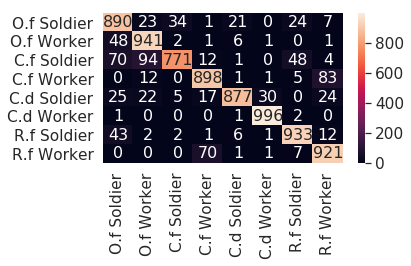

runtime :  14236.577029466629

[62] accuracy: 0.907 loss: 52.611

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.26554363965

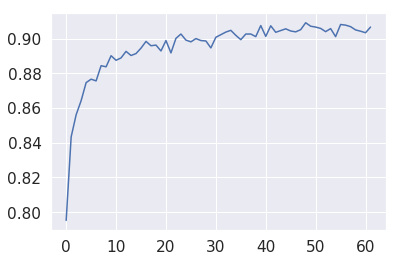

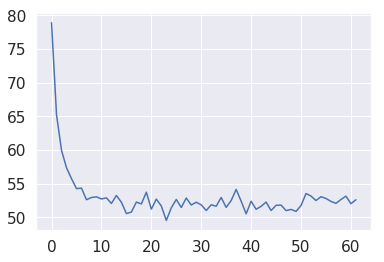

[4, 0, 0, 1, 7, 1, 5, 0, 3, 3, 6, 5, 6, 6, 6, 0, 6, 0, 7, 3, 1, 1, 0, 3, 7, 1, 2, 7, 1, 0, 1, 4, 0, 0, 1, 7, 0, 3, 3, 3, 4, 3, 0, 0, 0, 2, 0, 0, 6, 6, 1, 3, 6, 6, 0, 3, 4, 3, 3, 6, 7, 6, 0, 7, 1, 1, 0, 4, 5, 3, 0, 4, 7, 4, 0, 0, 0, 2, 7, 0, 7, 6, 0, 2, 2, 0, 1, 6, 1, 6, 1, 1, 1, 1, 5, 1, 7, 0, 7, 0, 0, 1, 1, 1, 0, 1, 0, 7, 6, 6, 1, 0, 0, 6, 6, 1, 3, 6, 7, 5, 1, 0, 7, 5, 2, 0, 7, 6, 0, 1, 1, 1, 0, 5, 6, 7, 0, 1, 3, 0, 0, 1, 7, 1, 3, 3, 2, 7, 2, 1, 1, 4, 4, 7, 1, 5, 7, 4, 6, 1, 2, 0, 2, 0, 3, 6, 7, 0, 0, 7, 3, 1, 0, 7, 3, 6, 0, 1, 1, 1, 7, 3, 6, 1, 0, 0, 1, 4, 4, 1, 0, 6, 0, 5, 2, 1, 3, 1, 3, 0, 1, 1, 0, 5, 6, 3, 0, 1, 7, 1, 3, 4, 0, 1, 1, 7, 3, 1, 7, 3, 7, 0, 1, 0, 0, 0, 1, 7, 1, 3, 3, 2, 3, 0, 7, 1, 1, 1, 4, 1, 0, 0, 3, 3, 3, 7, 0, 6, 7, 3, 1, 6, 1, 2, 3, 0, 7, 0, 1, 1, 0, 7, 7, 7, 1, 3, 1, 0, 7, 0, 0, 0, 5, 6, 1, 0, 1, 1, 7, 7, 0, 0, 3, 7, 0, 2, 1, 2, 7, 0, 2, 1, 1, 6, 0, 2, 0, 3, 3, 4, 3, 1, 5, 1, 1, 3, 7, 1, 0, 0, 1, 0, 7, 6, 0, 1, 0, 1, 3, 0, 1, 0, 4, 1, 1, 7, 2, 0, 7, 2, 1, 3, 7, 

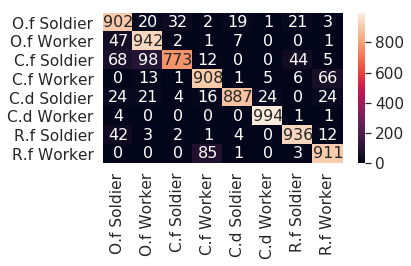

runtime :  14469.478058338165

[63] accuracy: 0.907 loss: 53.992

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.78369804471731, 52.2

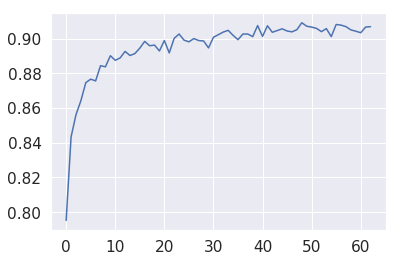

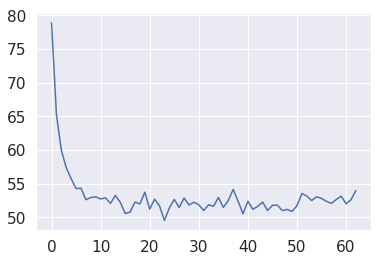

[7, 3, 1, 7, 7, 2, 6, 3, 6, 3, 3, 3, 6, 1, 1, 1, 7, 3, 7, 1, 3, 5, 6, 1, 7, 0, 6, 2, 2, 1, 6, 7, 3, 0, 3, 0, 0, 3, 1, 6, 0, 6, 0, 2, 2, 1, 1, 4, 7, 0, 3, 7, 1, 7, 7, 1, 6, 1, 0, 0, 0, 0, 6, 3, 5, 0, 1, 6, 7, 0, 6, 1, 6, 0, 5, 5, 0, 6, 0, 7, 0, 3, 7, 6, 2, 6, 2, 6, 7, 4, 3, 7, 0, 7, 1, 4, 7, 1, 3, 0, 0, 6, 6, 5, 6, 1, 1, 0, 7, 3, 1, 7, 0, 3, 1, 3, 7, 7, 6, 0, 0, 7, 3, 6, 7, 1, 1, 0, 0, 0, 0, 0, 7, 0, 0, 1, 2, 0, 1, 3, 7, 0, 5, 6, 4, 3, 0, 1, 0, 0, 4, 3, 0, 3, 1, 3, 2, 1, 1, 1, 2, 0, 6, 7, 7, 2, 7, 7, 0, 2, 3, 3, 1, 7, 6, 7, 4, 2, 2, 7, 0, 4, 1, 0, 6, 3, 4, 0, 0, 0, 0, 0, 0, 7, 3, 4, 0, 7, 7, 3, 1, 3, 0, 1, 6, 7, 1, 4, 1, 3, 6, 2, 0, 1, 2, 6, 5, 7, 7, 5, 2, 7, 4, 1, 1, 6, 0, 0, 0, 3, 1, 7, 0, 1, 0, 0, 0, 7, 1, 0, 1, 6, 0, 7, 6, 6, 0, 3, 7, 1, 6, 1, 1, 1, 0, 6, 7, 1, 1, 2, 6, 1, 0, 6, 7, 0, 6, 5, 7, 2, 0, 1, 0, 3, 0, 4, 0, 0, 5, 7, 6, 1, 0, 0, 6, 7, 4, 1, 0, 1, 7, 2, 1, 1, 0, 2, 7, 2, 3, 1, 1, 0, 2, 3, 0, 5, 7, 6, 0, 7, 6, 0, 0, 0, 6, 5, 3, 0, 1, 7, 7, 6, 5, 6, 0, 3, 1, 7, 2, 7, 0, 1, 0, 

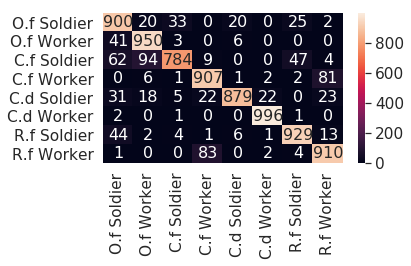

runtime :  14704.280857563019

[64] accuracy: 0.908 loss: 51.814

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.7836980447

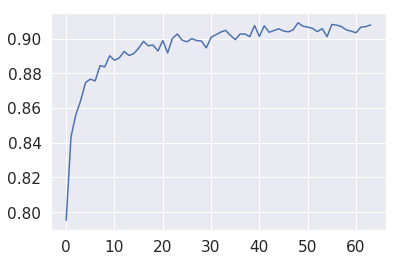

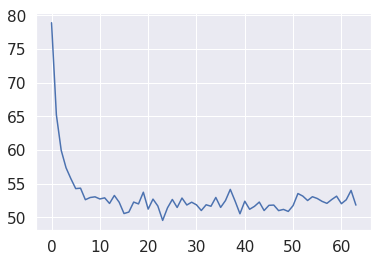

[6, 6, 3, 6, 7, 0, 0, 0, 7, 0, 1, 0, 1, 1, 7, 7, 1, 3, 0, 2, 1, 6, 3, 5, 1, 0, 7, 3, 7, 0, 0, 6, 7, 0, 3, 1, 0, 1, 3, 0, 6, 1, 0, 4, 2, 5, 0, 1, 7, 7, 6, 3, 7, 2, 7, 0, 3, 3, 0, 6, 2, 6, 7, 1, 4, 7, 6, 0, 1, 6, 2, 0, 0, 0, 0, 2, 1, 0, 6, 0, 0, 3, 1, 2, 3, 1, 1, 4, 0, 7, 2, 7, 3, 3, 7, 1, 3, 4, 1, 7, 4, 2, 0, 0, 0, 3, 7, 7, 3, 1, 6, 1, 1, 1, 3, 5, 3, 7, 7, 2, 7, 2, 3, 3, 0, 0, 6, 1, 6, 6, 0, 0, 4, 6, 1, 0, 0, 6, 4, 0, 5, 3, 1, 0, 7, 0, 1, 3, 0, 3, 1, 3, 2, 1, 6, 7, 6, 1, 0, 1, 0, 0, 4, 7, 7, 0, 6, 1, 4, 1, 3, 0, 3, 0, 0, 5, 1, 3, 1, 0, 3, 1, 0, 3, 7, 0, 3, 7, 3, 1, 0, 7, 0, 3, 6, 6, 0, 3, 3, 0, 1, 0, 1, 7, 1, 7, 1, 4, 1, 0, 7, 1, 7, 0, 0, 7, 3, 6, 6, 2, 0, 0, 3, 2, 1, 1, 6, 0, 1, 1, 4, 0, 6, 2, 0, 2, 1, 0, 6, 1, 1, 3, 2, 2, 7, 3, 2, 0, 6, 5, 0, 0, 0, 1, 3, 1, 0, 1, 0, 7, 1, 1, 2, 3, 7, 0, 0, 0, 2, 3, 1, 3, 1, 1, 1, 1, 6, 7, 7, 0, 5, 6, 1, 0, 0, 3, 3, 0, 3, 6, 4, 3, 6, 0, 3, 6, 4, 1, 2, 6, 2, 7, 0, 5, 1, 7, 1, 4, 7, 4, 0, 1, 1, 1, 0, 3, 7, 1, 6, 2, 1, 3, 5, 4, 5, 0, 0, 1, 3, 3, 3, 7, 3, 

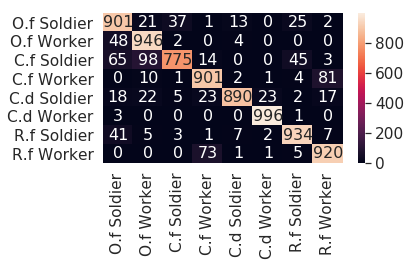

runtime :  14938.352102279663

[65] accuracy: 0.905 loss: 52.119

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.56446836516261, 50.

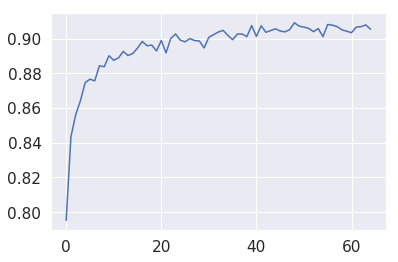

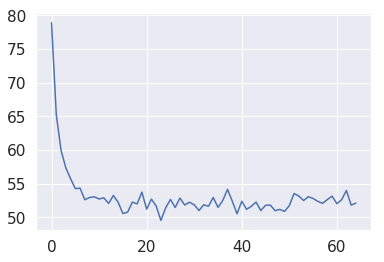

[7, 0, 3, 0, 4, 5, 3, 0, 1, 0, 6, 1, 6, 4, 0, 3, 1, 6, 1, 7, 3, 1, 1, 3, 7, 1, 0, 1, 0, 1, 2, 0, 4, 3, 6, 2, 3, 7, 1, 1, 0, 5, 7, 3, 2, 7, 0, 6, 1, 0, 7, 1, 3, 1, 3, 6, 0, 1, 7, 7, 3, 0, 1, 1, 5, 7, 2, 0, 2, 3, 0, 6, 2, 0, 3, 0, 3, 0, 1, 7, 3, 7, 6, 2, 2, 6, 6, 0, 2, 0, 1, 7, 0, 5, 0, 0, 3, 1, 5, 0, 1, 4, 0, 3, 0, 1, 1, 0, 1, 7, 6, 0, 4, 5, 3, 0, 1, 7, 7, 4, 0, 1, 1, 0, 6, 1, 0, 3, 1, 6, 1, 3, 7, 3, 3, 0, 4, 1, 6, 4, 0, 1, 1, 6, 2, 7, 2, 7, 0, 2, 1, 1, 0, 7, 7, 0, 7, 7, 7, 0, 3, 7, 7, 1, 4, 0, 6, 3, 1, 3, 4, 1, 3, 6, 6, 3, 0, 1, 0, 0, 3, 7, 4, 2, 1, 0, 7, 7, 0, 7, 7, 0, 0, 7, 7, 0, 6, 0, 6, 7, 7, 4, 5, 4, 5, 6, 1, 1, 7, 6, 2, 1, 1, 0, 4, 3, 0, 1, 0, 3, 0, 1, 5, 0, 5, 4, 0, 0, 3, 1, 7, 3, 2, 0, 0, 1, 1, 6, 0, 1, 1, 0, 1, 5, 3, 0, 5, 1, 1, 3, 6, 1, 7, 2, 7, 1, 3, 6, 3, 0, 1, 1, 0, 6, 7, 5, 6, 6, 4, 7, 0, 3, 0, 7, 7, 1, 7, 7, 0, 1, 6, 1, 1, 1, 0, 1, 0, 2, 3, 7, 1, 0, 3, 3, 1, 6, 0, 0, 6, 7, 0, 1, 3, 1, 6, 0, 7, 1, 0, 1, 7, 0, 0, 2, 1, 3, 1, 7, 1, 7, 0, 3, 1, 1, 7, 1, 0, 3, 1, 0, 5, 0, 0, 

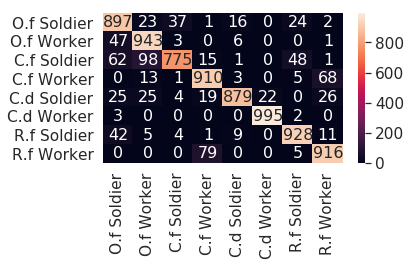

runtime :  15173.046349048615

[66] accuracy: 0.906 loss: 52.775

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.564468365162

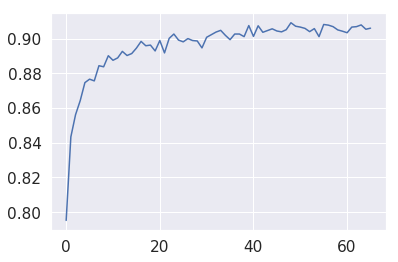

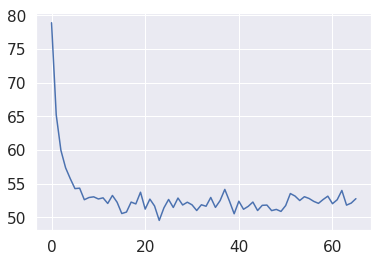

[1, 3, 1, 0, 7, 5, 0, 6, 1, 1, 1, 0, 0, 6, 7, 7, 3, 7, 7, 0, 0, 6, 6, 0, 0, 7, 1, 3, 2, 1, 1, 3, 1, 5, 1, 3, 3, 1, 3, 1, 7, 6, 3, 3, 0, 1, 2, 5, 7, 0, 7, 3, 0, 6, 7, 2, 0, 0, 3, 0, 7, 7, 1, 0, 0, 1, 0, 0, 1, 3, 0, 1, 3, 7, 3, 3, 5, 1, 4, 1, 5, 1, 5, 4, 4, 7, 1, 0, 6, 0, 7, 1, 7, 6, 5, 1, 3, 0, 0, 6, 0, 3, 7, 7, 7, 6, 7, 7, 0, 2, 2, 1, 2, 3, 3, 0, 2, 1, 0, 0, 5, 0, 1, 3, 1, 7, 0, 1, 1, 7, 4, 6, 1, 6, 3, 6, 1, 4, 0, 7, 4, 6, 0, 0, 3, 7, 3, 0, 0, 1, 2, 7, 7, 2, 0, 1, 7, 6, 0, 7, 1, 1, 4, 1, 1, 1, 1, 0, 3, 0, 3, 1, 7, 0, 7, 1, 1, 2, 1, 6, 5, 4, 5, 3, 6, 6, 0, 0, 1, 7, 1, 2, 5, 1, 7, 1, 6, 6, 2, 7, 3, 0, 2, 7, 1, 3, 7, 2, 6, 6, 2, 3, 7, 0, 1, 7, 3, 5, 6, 2, 3, 3, 2, 6, 3, 3, 0, 0, 0, 1, 1, 7, 4, 7, 4, 6, 6, 7, 6, 4, 2, 6, 0, 1, 7, 6, 1, 1, 0, 1, 7, 7, 0, 3, 6, 0, 3, 0, 0, 6, 3, 0, 6, 7, 7, 4, 0, 0, 6, 3, 6, 7, 0, 1, 7, 7, 6, 1, 5, 6, 5, 6, 3, 0, 7, 0, 6, 7, 6, 6, 3, 0, 0, 7, 3, 6, 0, 1, 4, 3, 4, 1, 7, 3, 6, 1, 1, 7, 1, 6, 7, 0, 7, 3, 1, 6, 0, 3, 7, 0, 4, 1, 0, 0, 1, 1, 0, 0, 7, 6, 3, 7, 0, 

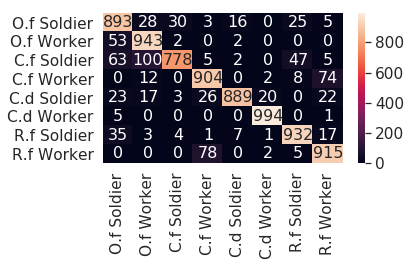

runtime :  15408.342034816742

[67] accuracy: 0.907 loss: 52.068

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.242324605584145, 50.564

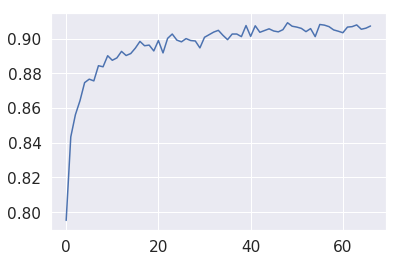

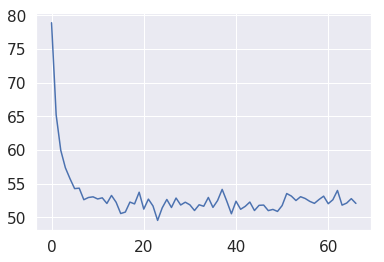

[6, 4, 2, 3, 6, 0, 3, 7, 6, 1, 3, 1, 3, 1, 0, 0, 3, 0, 7, 3, 0, 7, 3, 0, 6, 1, 3, 3, 3, 3, 4, 0, 0, 0, 3, 0, 6, 1, 1, 0, 0, 0, 1, 7, 6, 7, 3, 1, 2, 6, 1, 2, 3, 0, 6, 3, 0, 6, 7, 0, 6, 6, 3, 6, 0, 0, 1, 5, 1, 2, 2, 0, 0, 1, 3, 2, 0, 1, 1, 1, 0, 3, 1, 7, 2, 7, 3, 1, 1, 3, 1, 0, 7, 2, 6, 1, 3, 6, 3, 7, 6, 5, 0, 6, 3, 0, 1, 1, 1, 7, 2, 3, 3, 5, 4, 1, 1, 2, 0, 3, 7, 1, 7, 1, 0, 1, 3, 0, 0, 3, 1, 7, 0, 0, 3, 6, 2, 0, 6, 0, 0, 0, 6, 6, 0, 4, 6, 0, 0, 4, 7, 7, 2, 3, 1, 1, 5, 7, 1, 3, 3, 7, 0, 0, 7, 1, 6, 2, 7, 0, 2, 3, 7, 7, 6, 6, 2, 0, 0, 2, 0, 0, 3, 1, 0, 6, 0, 1, 4, 0, 3, 7, 7, 3, 1, 0, 6, 1, 1, 1, 2, 7, 1, 7, 2, 0, 1, 7, 5, 1, 7, 5, 3, 0, 3, 3, 0, 0, 7, 3, 6, 2, 6, 0, 1, 6, 6, 6, 3, 5, 1, 4, 3, 6, 0, 1, 3, 0, 1, 3, 1, 3, 3, 1, 3, 1, 1, 1, 2, 0, 7, 0, 3, 1, 2, 1, 1, 7, 6, 6, 3, 3, 7, 2, 6, 0, 6, 3, 1, 0, 0, 1, 0, 7, 7, 7, 1, 2, 0, 6, 5, 3, 0, 0, 1, 1, 0, 2, 1, 0, 3, 3, 7, 2, 1, 3, 2, 2, 0, 0, 4, 1, 0, 6, 3, 3, 0, 3, 6, 0, 4, 0, 4, 1, 6, 6, 1, 7, 0, 7, 0, 6, 7, 7, 0, 6, 3, 0, 7, 7, 3, 6, 4, 

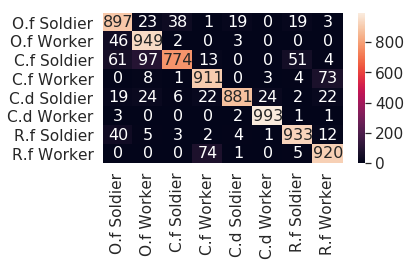

runtime :  15642.23448562622

[68] accuracy: 0.907 loss: 51.719

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.24232460558414

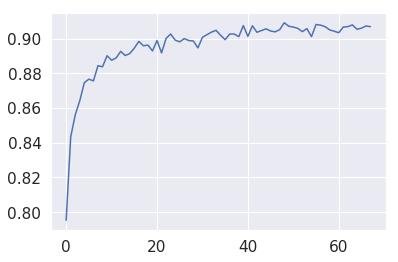

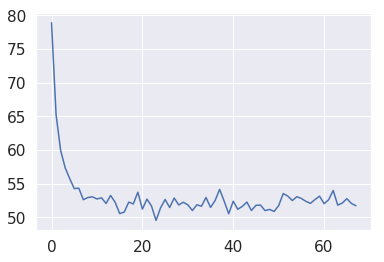

[1, 0, 0, 7, 6, 7, 7, 6, 1, 2, 7, 6, 5, 1, 2, 3, 3, 1, 0, 6, 0, 6, 5, 1, 3, 7, 0, 6, 7, 3, 0, 0, 7, 1, 7, 7, 2, 3, 1, 7, 4, 1, 1, 6, 3, 7, 2, 0, 3, 1, 3, 4, 2, 1, 0, 3, 1, 3, 6, 6, 6, 7, 4, 4, 1, 7, 1, 0, 1, 1, 3, 3, 1, 1, 1, 1, 6, 5, 0, 6, 0, 0, 1, 4, 1, 7, 1, 2, 1, 1, 0, 1, 1, 1, 7, 0, 6, 5, 6, 2, 3, 3, 3, 7, 1, 1, 1, 2, 3, 0, 3, 3, 1, 0, 0, 3, 3, 0, 0, 7, 1, 0, 1, 0, 1, 5, 1, 7, 7, 4, 7, 2, 1, 7, 3, 4, 0, 7, 0, 1, 5, 0, 7, 7, 6, 1, 1, 7, 7, 1, 0, 7, 6, 4, 0, 1, 0, 7, 6, 7, 0, 1, 3, 1, 7, 7, 0, 0, 1, 1, 0, 3, 1, 1, 2, 3, 7, 7, 0, 1, 7, 4, 3, 6, 6, 0, 7, 3, 3, 1, 4, 7, 1, 1, 6, 7, 0, 5, 0, 7, 7, 7, 7, 1, 1, 4, 1, 1, 5, 2, 3, 1, 0, 6, 0, 1, 1, 7, 1, 1, 0, 3, 6, 6, 4, 0, 1, 7, 0, 1, 1, 7, 7, 6, 3, 3, 3, 1, 3, 7, 0, 0, 1, 1, 0, 3, 6, 7, 3, 3, 3, 3, 1, 6, 5, 0, 7, 0, 0, 2, 3, 0, 3, 0, 7, 0, 6, 1, 0, 7, 3, 0, 3, 1, 0, 5, 0, 1, 7, 0, 0, 3, 0, 0, 1, 0, 3, 3, 7, 4, 0, 1, 0, 6, 2, 7, 6, 6, 1, 0, 3, 3, 3, 6, 5, 3, 7, 0, 3, 1, 2, 3, 4, 1, 0, 1, 1, 7, 1, 0, 3, 6, 0, 7, 0, 1, 0, 1, 0, 3, 7, 2, 1, 

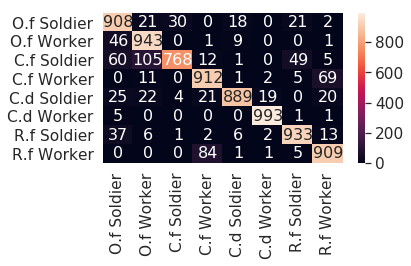

runtime :  15878.604703903198

[69] accuracy: 0.909 loss: 50.935

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 52.2423

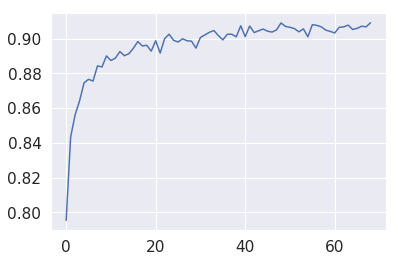

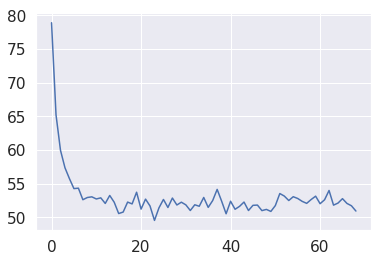

[1, 6, 0, 1, 0, 3, 3, 1, 0, 7, 1, 0, 0, 1, 1, 1, 7, 3, 7, 4, 3, 3, 2, 3, 3, 1, 2, 3, 0, 4, 1, 2, 0, 0, 1, 0, 6, 2, 3, 3, 3, 1, 0, 3, 1, 1, 0, 6, 1, 0, 0, 6, 0, 5, 3, 1, 0, 3, 6, 0, 7, 0, 1, 3, 7, 6, 7, 0, 7, 6, 6, 1, 1, 1, 2, 3, 7, 0, 4, 7, 1, 2, 0, 1, 3, 0, 0, 0, 7, 6, 1, 0, 6, 6, 7, 1, 1, 4, 3, 1, 7, 2, 1, 0, 4, 2, 1, 1, 3, 0, 1, 6, 2, 4, 0, 3, 2, 3, 3, 0, 5, 2, 2, 3, 3, 0, 7, 0, 4, 0, 0, 6, 2, 1, 3, 7, 0, 1, 3, 5, 1, 1, 7, 4, 7, 1, 0, 7, 5, 7, 7, 0, 3, 6, 5, 6, 6, 7, 5, 1, 0, 1, 0, 1, 5, 5, 0, 1, 7, 0, 1, 6, 6, 1, 3, 3, 0, 0, 1, 6, 6, 3, 7, 1, 1, 1, 0, 1, 0, 0, 6, 1, 0, 3, 3, 5, 7, 0, 7, 1, 3, 7, 3, 0, 7, 0, 1, 1, 0, 3, 2, 7, 3, 0, 0, 7, 1, 0, 7, 1, 4, 4, 0, 7, 1, 7, 1, 6, 1, 3, 7, 6, 5, 7, 7, 2, 0, 1, 2, 0, 7, 6, 3, 7, 6, 7, 2, 3, 0, 1, 0, 1, 0, 1, 7, 1, 1, 2, 7, 1, 1, 1, 6, 6, 1, 5, 4, 7, 7, 3, 3, 1, 0, 3, 3, 2, 0, 4, 3, 1, 0, 1, 6, 0, 1, 7, 3, 0, 1, 2, 6, 1, 7, 3, 3, 1, 0, 0, 1, 0, 0, 0, 7, 6, 7, 3, 0, 0, 0, 1, 6, 3, 6, 1, 3, 0, 3, 5, 7, 1, 1, 1, 6, 4, 6, 0, 0, 6, 5, 0, 3, 2, 1, 

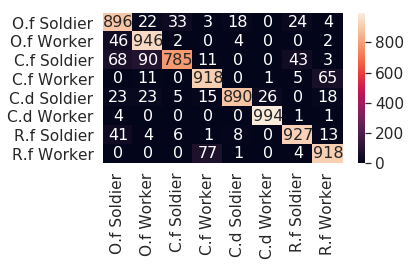

runtime :  16112.490067720413

[70] accuracy: 0.906 loss: 53.046

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.25026527047157, 

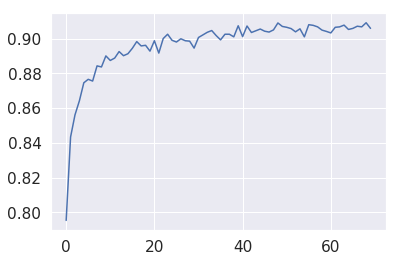

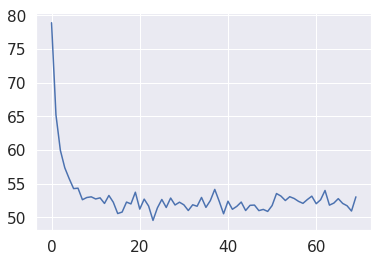

[6, 6, 0, 3, 0, 0, 3, 0, 1, 0, 3, 1, 1, 1, 0, 3, 6, 2, 7, 1, 0, 7, 6, 0, 5, 7, 1, 2, 0, 7, 3, 0, 1, 0, 7, 0, 1, 1, 7, 1, 2, 5, 0, 1, 3, 5, 2, 7, 7, 3, 0, 1, 4, 7, 1, 1, 1, 7, 0, 3, 3, 7, 1, 4, 1, 6, 6, 1, 6, 3, 6, 3, 7, 3, 2, 6, 0, 5, 6, 6, 1, 6, 1, 3, 1, 0, 6, 3, 1, 7, 7, 5, 3, 4, 6, 1, 0, 0, 0, 4, 0, 3, 6, 0, 1, 3, 5, 3, 3, 1, 3, 1, 6, 5, 4, 1, 2, 6, 2, 7, 1, 1, 0, 5, 1, 0, 3, 7, 4, 3, 1, 5, 0, 0, 0, 0, 1, 2, 0, 3, 7, 7, 3, 3, 1, 1, 1, 6, 6, 1, 3, 0, 3, 1, 1, 5, 7, 1, 6, 6, 0, 2, 3, 0, 7, 5, 7, 7, 1, 3, 1, 0, 3, 1, 6, 3, 1, 3, 2, 0, 1, 0, 3, 0, 3, 7, 7, 0, 0, 0, 3, 0, 7, 0, 3, 0, 1, 0, 3, 1, 6, 0, 2, 0, 7, 6, 2, 0, 1, 3, 3, 0, 0, 0, 1, 3, 1, 1, 0, 0, 3, 5, 7, 7, 0, 2, 0, 0, 1, 7, 7, 6, 7, 7, 5, 6, 1, 4, 0, 0, 0, 0, 6, 1, 1, 7, 3, 7, 0, 0, 6, 3, 0, 1, 1, 0, 3, 5, 2, 1, 2, 1, 1, 4, 4, 5, 3, 0, 1, 0, 7, 7, 6, 3, 3, 1, 2, 7, 3, 1, 0, 3, 4, 0, 7, 0, 3, 0, 6, 7, 5, 1, 3, 3, 7, 2, 1, 0, 7, 3, 0, 3, 0, 0, 7, 7, 6, 0, 3, 7, 0, 3, 1, 1, 1, 0, 3, 0, 7, 7, 0, 1, 7, 1, 2, 3, 0, 0, 0, 1, 1, 3, 2, 

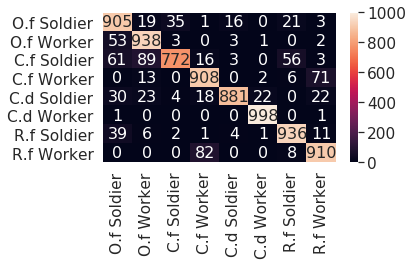

runtime :  16345.68031835556

[71] accuracy: 0.909 loss: 51.111

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 53.2502652

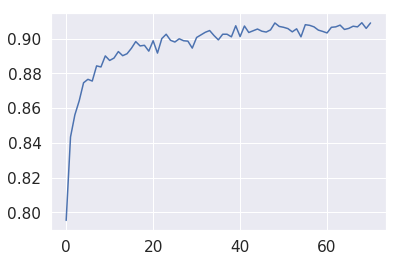

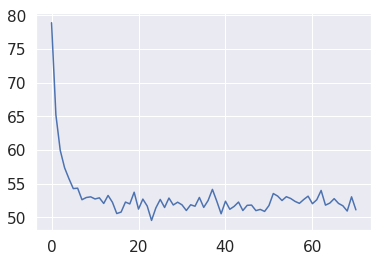

[1, 6, 2, 6, 4, 1, 2, 6, 3, 1, 3, 1, 6, 1, 0, 0, 1, 1, 4, 2, 1, 0, 0, 3, 1, 7, 6, 0, 7, 2, 1, 1, 3, 0, 6, 1, 3, 7, 0, 3, 3, 0, 1, 0, 6, 7, 1, 2, 0, 1, 3, 7, 0, 3, 0, 2, 2, 0, 7, 7, 7, 0, 0, 7, 1, 3, 2, 6, 7, 1, 3, 3, 3, 7, 1, 3, 1, 0, 2, 3, 0, 3, 2, 3, 1, 0, 1, 1, 3, 0, 4, 3, 0, 7, 5, 0, 0, 0, 7, 0, 2, 1, 0, 6, 7, 7, 7, 7, 3, 1, 0, 7, 3, 1, 0, 2, 0, 5, 0, 0, 0, 1, 4, 1, 7, 0, 5, 3, 7, 7, 7, 6, 0, 6, 7, 1, 3, 1, 0, 3, 1, 4, 0, 0, 7, 3, 7, 0, 6, 3, 6, 3, 0, 0, 1, 6, 0, 7, 0, 0, 6, 0, 3, 3, 7, 1, 4, 0, 7, 3, 3, 0, 5, 6, 7, 0, 3, 6, 6, 0, 1, 0, 0, 1, 0, 7, 3, 0, 3, 6, 0, 1, 0, 1, 1, 0, 1, 2, 3, 1, 3, 0, 1, 1, 6, 6, 3, 0, 1, 1, 0, 1, 1, 6, 0, 4, 7, 7, 0, 2, 3, 0, 3, 1, 3, 4, 5, 3, 6, 1, 2, 2, 3, 0, 0, 0, 1, 5, 0, 6, 6, 3, 0, 0, 0, 0, 6, 1, 1, 1, 3, 1, 1, 7, 1, 5, 3, 0, 0, 0, 0, 3, 2, 3, 3, 0, 3, 3, 4, 0, 1, 7, 0, 7, 1, 0, 2, 6, 1, 6, 0, 1, 7, 6, 0, 0, 1, 1, 3, 1, 7, 6, 4, 6, 3, 7, 6, 0, 0, 1, 0, 0, 1, 0, 7, 7, 5, 7, 4, 1, 1, 7, 0, 3, 3, 6, 2, 0, 1, 7, 2, 5, 2, 1, 7, 0, 2, 0, 7, 3, 7, 0, 7, 

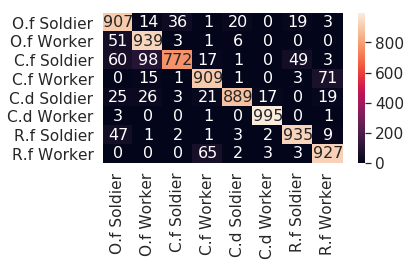

runtime :  16580.22744846344

[72] accuracy: 0.909 loss: 52.519

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.064015209674835, 5

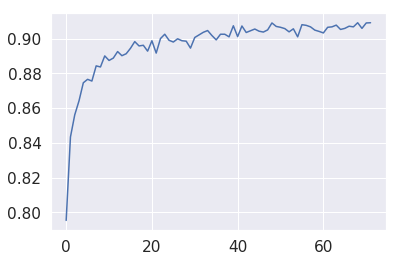

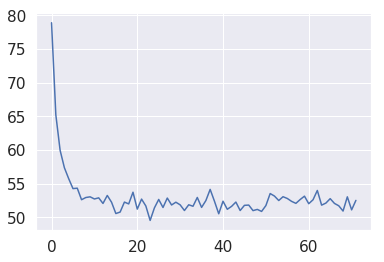

[6, 7, 0, 7, 7, 1, 3, 1, 3, 3, 5, 6, 3, 3, 0, 6, 3, 0, 7, 3, 0, 7, 0, 1, 4, 4, 4, 1, 4, 0, 3, 3, 7, 0, 5, 0, 6, 3, 6, 1, 3, 0, 1, 3, 0, 4, 0, 7, 0, 3, 6, 6, 1, 4, 1, 1, 6, 1, 1, 0, 3, 2, 3, 0, 1, 2, 0, 3, 0, 1, 4, 1, 3, 1, 7, 7, 3, 6, 1, 0, 0, 0, 7, 0, 7, 7, 7, 3, 7, 6, 1, 1, 3, 0, 3, 1, 7, 1, 3, 3, 1, 1, 7, 2, 3, 7, 1, 0, 5, 6, 7, 0, 0, 7, 0, 0, 1, 0, 7, 1, 1, 7, 6, 0, 7, 2, 0, 6, 1, 3, 6, 0, 6, 6, 2, 0, 7, 7, 1, 0, 7, 3, 4, 0, 3, 0, 3, 7, 2, 3, 7, 0, 4, 1, 0, 1, 0, 0, 7, 6, 0, 3, 2, 0, 0, 0, 0, 0, 3, 0, 1, 4, 7, 3, 1, 5, 0, 2, 4, 4, 4, 1, 1, 5, 7, 0, 1, 2, 1, 0, 3, 7, 3, 6, 0, 0, 3, 5, 1, 7, 1, 0, 0, 7, 7, 1, 7, 6, 0, 1, 3, 3, 3, 6, 0, 3, 0, 0, 0, 1, 1, 1, 0, 7, 7, 3, 4, 0, 0, 1, 2, 0, 5, 0, 3, 7, 0, 7, 0, 1, 7, 1, 0, 6, 4, 1, 0, 0, 1, 0, 2, 0, 5, 0, 0, 0, 6, 7, 1, 1, 7, 0, 0, 0, 0, 0, 7, 4, 7, 4, 1, 0, 0, 7, 3, 0, 3, 2, 0, 0, 1, 1, 2, 0, 1, 6, 6, 0, 1, 2, 1, 3, 3, 2, 2, 0, 0, 7, 2, 1, 0, 7, 7, 0, 0, 1, 1, 0, 1, 7, 1, 3, 4, 0, 1, 7, 0, 1, 3, 6, 1, 3, 7, 3, 0, 3, 0, 0, 1, 3, 1, 7, 0, 

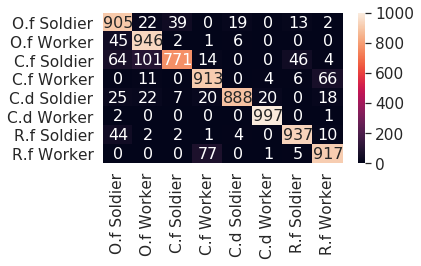

runtime :  16813.54992580414

[73] accuracy: 0.907 loss: 54.427

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 52.06401520

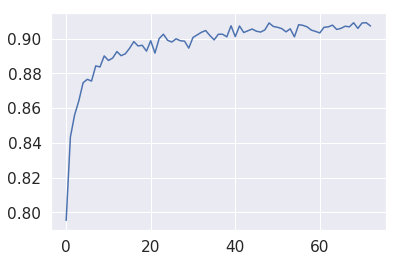

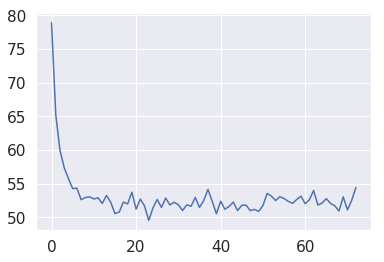

[0, 3, 3, 3, 0, 1, 3, 1, 3, 3, 5, 3, 0, 7, 3, 0, 7, 7, 7, 6, 1, 3, 7, 1, 3, 0, 4, 1, 1, 2, 1, 0, 1, 0, 7, 1, 7, 7, 3, 0, 1, 1, 0, 7, 1, 0, 0, 1, 7, 6, 7, 0, 4, 3, 7, 6, 0, 1, 0, 4, 2, 4, 1, 6, 7, 1, 7, 0, 3, 0, 6, 7, 0, 5, 0, 3, 7, 0, 3, 7, 1, 0, 7, 1, 0, 7, 2, 7, 0, 2, 7, 0, 0, 6, 6, 2, 1, 1, 6, 7, 0, 7, 7, 3, 2, 1, 3, 3, 1, 0, 1, 5, 7, 1, 6, 0, 0, 6, 0, 0, 7, 0, 0, 1, 4, 0, 7, 0, 1, 3, 7, 0, 1, 3, 7, 6, 3, 1, 1, 3, 1, 1, 1, 0, 7, 0, 2, 0, 3, 3, 6, 1, 0, 1, 3, 1, 1, 1, 5, 0, 6, 2, 1, 1, 3, 1, 7, 7, 6, 3, 2, 0, 0, 0, 0, 1, 1, 2, 1, 1, 0, 0, 1, 6, 6, 6, 3, 7, 2, 1, 0, 1, 0, 7, 0, 3, 3, 3, 3, 0, 0, 7, 7, 6, 0, 3, 0, 0, 1, 7, 1, 4, 7, 0, 1, 0, 0, 1, 4, 0, 1, 1, 1, 3, 3, 0, 1, 0, 3, 0, 1, 3, 0, 2, 7, 6, 0, 2, 6, 0, 3, 6, 4, 0, 1, 6, 3, 1, 6, 3, 3, 2, 0, 1, 0, 1, 1, 5, 2, 0, 0, 0, 7, 0, 3, 3, 3, 0, 2, 3, 0, 1, 7, 6, 1, 1, 6, 7, 1, 6, 6, 0, 0, 1, 3, 7, 2, 7, 0, 0, 6, 0, 1, 1, 7, 0, 7, 0, 3, 6, 6, 6, 7, 6, 3, 0, 1, 1, 1, 0, 3, 7, 4, 7, 0, 7, 1, 5, 3, 2, 7, 6, 7, 1, 7, 0, 1, 7, 0, 0, 7, 3, 3, 

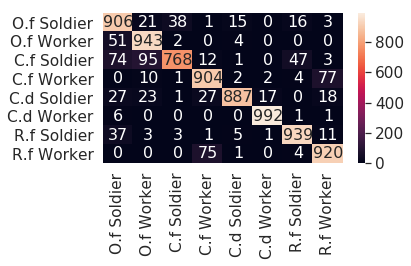

runtime :  17050.158065080643

[74] accuracy: 0.908 loss: 52.390

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349894762, 

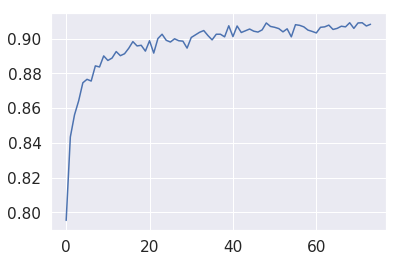

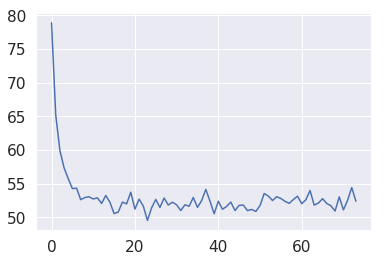

[1, 7, 0, 0, 7, 6, 7, 0, 1, 1, 5, 3, 7, 3, 7, 1, 1, 0, 1, 0, 7, 2, 7, 0, 3, 3, 3, 0, 0, 7, 3, 0, 0, 0, 1, 6, 3, 4, 7, 4, 4, 0, 2, 7, 3, 1, 0, 6, 0, 7, 1, 3, 1, 1, 0, 1, 1, 0, 7, 7, 7, 0, 1, 1, 7, 7, 6, 6, 7, 2, 1, 3, 3, 0, 1, 3, 3, 3, 3, 0, 0, 0, 0, 1, 3, 7, 6, 7, 7, 2, 1, 4, 1, 1, 1, 4, 0, 7, 0, 6, 3, 1, 0, 0, 0, 7, 0, 1, 3, 0, 1, 3, 0, 3, 2, 1, 3, 3, 2, 6, 1, 7, 1, 0, 0, 0, 0, 6, 3, 3, 1, 3, 4, 1, 7, 3, 0, 4, 1, 4, 3, 7, 1, 1, 0, 2, 3, 2, 6, 7, 6, 0, 0, 0, 6, 7, 0, 0, 1, 1, 7, 1, 7, 7, 3, 0, 4, 3, 7, 1, 1, 7, 2, 1, 1, 0, 0, 7, 0, 1, 7, 4, 0, 1, 3, 0, 7, 6, 6, 5, 7, 0, 3, 1, 0, 5, 7, 6, 1, 7, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 7, 0, 5, 7, 0, 6, 1, 0, 7, 1, 7, 0, 0, 5, 1, 3, 6, 4, 1, 4, 4, 3, 5, 0, 1, 2, 3, 1, 3, 0, 2, 0, 1, 3, 0, 3, 3, 3, 0, 0, 3, 3, 0, 3, 1, 0, 1, 0, 6, 0, 3, 6, 0, 2, 7, 6, 7, 7, 0, 0, 6, 6, 1, 1, 2, 6, 6, 7, 0, 7, 0, 1, 7, 0, 6, 3, 5, 7, 7, 6, 0, 0, 4, 1, 3, 6, 0, 0, 0, 5, 3, 6, 3, 3, 6, 3, 7, 1, 1, 3, 3, 2, 4, 5, 1, 1, 1, 0, 2, 0, 0, 0, 4, 0, 0, 4, 1, 0, 0, 1, 1, 3, 1, 

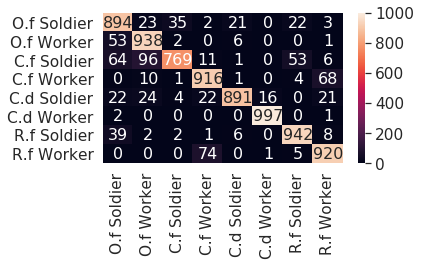

runtime :  17286.7834379673

[75] accuracy: 0.906 loss: 52.261

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 52.89640349

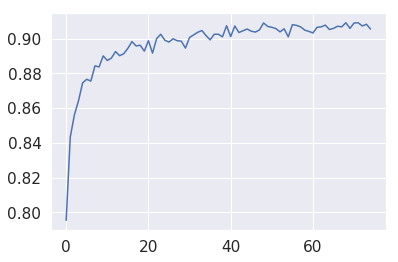

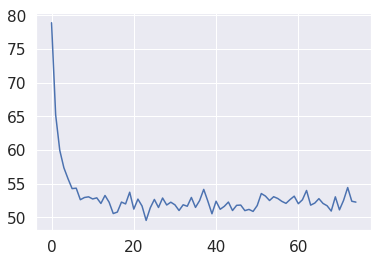

[7, 4, 6, 1, 4, 3, 0, 3, 3, 2, 1, 3, 1, 0, 0, 6, 2, 7, 7, 7, 0, 0, 6, 6, 0, 7, 6, 1, 0, 3, 3, 6, 7, 3, 0, 3, 1, 0, 3, 0, 0, 0, 1, 0, 1, 5, 1, 7, 7, 7, 3, 3, 5, 1, 0, 0, 2, 0, 3, 3, 1, 7, 3, 7, 0, 7, 1, 0, 6, 1, 0, 6, 7, 0, 0, 1, 6, 7, 1, 0, 1, 0, 5, 7, 6, 7, 3, 1, 0, 7, 1, 6, 3, 7, 0, 0, 5, 6, 1, 0, 0, 3, 7, 5, 3, 1, 1, 6, 0, 4, 7, 0, 1, 1, 0, 0, 3, 0, 3, 3, 3, 1, 5, 3, 3, 5, 7, 0, 7, 0, 3, 1, 3, 4, 6, 0, 7, 0, 7, 0, 6, 3, 0, 6, 7, 4, 3, 1, 0, 0, 0, 0, 4, 3, 0, 2, 2, 0, 1, 1, 0, 1, 4, 3, 7, 7, 0, 1, 2, 3, 4, 6, 0, 4, 3, 7, 6, 0, 3, 0, 0, 6, 3, 3, 0, 0, 1, 2, 7, 2, 4, 7, 1, 1, 3, 0, 0, 0, 0, 1, 6, 7, 0, 6, 0, 5, 0, 0, 7, 0, 3, 7, 7, 6, 3, 3, 6, 1, 6, 3, 3, 6, 7, 7, 2, 0, 0, 0, 6, 3, 6, 0, 5, 2, 1, 1, 1, 7, 3, 1, 1, 7, 7, 0, 3, 3, 7, 3, 0, 0, 1, 1, 5, 2, 7, 1, 7, 7, 4, 1, 1, 2, 1, 0, 4, 1, 7, 3, 7, 0, 0, 0, 6, 3, 2, 6, 7, 0, 0, 7, 1, 7, 2, 5, 0, 1, 7, 6, 1, 6, 0, 6, 1, 1, 7, 0, 7, 7, 3, 4, 0, 0, 6, 2, 0, 1, 1, 6, 7, 2, 4, 3, 0, 3, 7, 7, 3, 1, 6, 2, 6, 2, 0, 6, 7, 2, 7, 1, 7, 7, 6, 2, 1, 

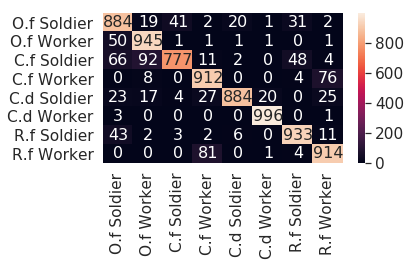

runtime :  17520.527314186096

[76] accuracy: 0.906 loss: 52.935

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.729688722640276, 

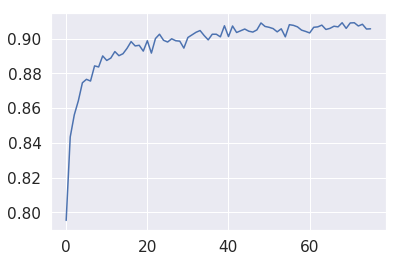

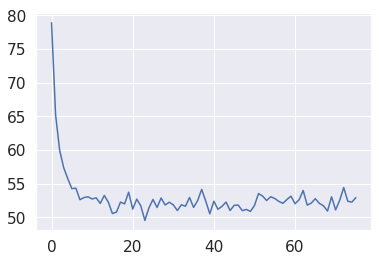

[0, 4, 0, 3, 2, 7, 6, 1, 1, 7, 1, 6, 6, 3, 0, 7, 3, 0, 5, 7, 3, 7, 0, 0, 7, 3, 0, 6, 2, 7, 1, 1, 7, 3, 1, 6, 1, 4, 0, 1, 2, 3, 0, 0, 7, 2, 0, 1, 7, 0, 0, 0, 0, 7, 0, 3, 3, 1, 3, 3, 3, 7, 3, 1, 7, 1, 3, 3, 3, 3, 5, 4, 0, 6, 7, 0, 1, 3, 1, 1, 1, 7, 6, 4, 2, 3, 1, 0, 3, 3, 1, 7, 1, 0, 1, 6, 0, 1, 0, 3, 3, 1, 0, 6, 0, 7, 7, 1, 6, 0, 2, 7, 1, 2, 7, 2, 0, 0, 7, 6, 0, 7, 1, 0, 0, 0, 1, 3, 7, 0, 3, 6, 3, 7, 0, 1, 0, 3, 6, 7, 1, 3, 2, 3, 0, 0, 1, 6, 6, 1, 6, 0, 0, 7, 4, 1, 4, 3, 6, 3, 3, 0, 1, 4, 3, 7, 4, 6, 0, 2, 3, 0, 1, 0, 0, 2, 3, 1, 1, 3, 6, 7, 7, 7, 6, 7, 1, 0, 7, 1, 7, 1, 3, 6, 7, 0, 0, 0, 4, 1, 0, 1, 6, 5, 1, 0, 7, 1, 7, 0, 3, 7, 1, 2, 0, 6, 1, 6, 3, 2, 3, 3, 3, 0, 3, 0, 0, 7, 6, 6, 2, 0, 3, 6, 6, 0, 1, 7, 0, 1, 3, 4, 0, 6, 6, 0, 0, 1, 1, 6, 3, 1, 0, 4, 7, 1, 3, 7, 4, 6, 4, 1, 7, 0, 0, 0, 0, 2, 2, 2, 3, 4, 3, 1, 1, 1, 6, 3, 0, 3, 3, 3, 3, 0, 0, 1, 7, 2, 0, 3, 5, 7, 0, 7, 0, 3, 0, 0, 0, 5, 7, 4, 3, 1, 6, 7, 1, 1, 4, 0, 0, 0, 3, 1, 7, 1, 7, 1, 0, 1, 0, 6, 0, 6, 3, 0, 6, 0, 2, 0, 5, 7, 7, 

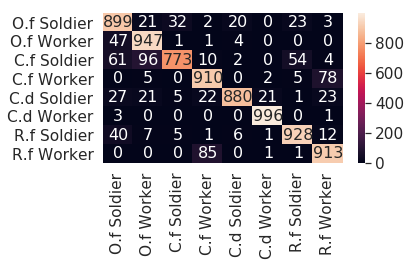

runtime :  17754.02355504036

[77] accuracy: 0.909 loss: 52.221

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52.72968872

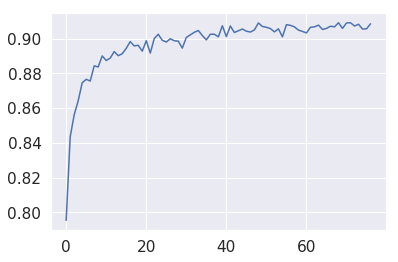

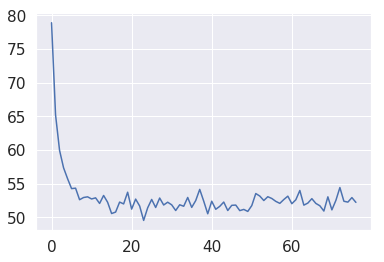

[1, 0, 5, 1, 1, 1, 3, 3, 2, 3, 7, 1, 2, 1, 0, 5, 2, 0, 3, 2, 6, 4, 2, 4, 7, 0, 3, 3, 7, 3, 7, 3, 3, 1, 7, 7, 4, 7, 7, 0, 3, 0, 1, 6, 7, 5, 0, 7, 1, 0, 1, 3, 6, 0, 0, 7, 3, 1, 0, 5, 7, 6, 1, 1, 0, 4, 0, 6, 1, 3, 0, 1, 1, 3, 0, 1, 0, 6, 7, 6, 0, 0, 6, 0, 3, 2, 1, 0, 7, 3, 0, 2, 2, 7, 7, 3, 1, 1, 3, 1, 7, 2, 4, 1, 0, 4, 6, 0, 1, 0, 5, 5, 1, 0, 4, 7, 0, 0, 1, 6, 6, 1, 2, 0, 3, 0, 1, 2, 0, 2, 3, 1, 4, 6, 0, 7, 0, 3, 1, 0, 3, 3, 0, 3, 3, 0, 0, 1, 3, 6, 1, 3, 0, 7, 0, 3, 3, 1, 0, 7, 3, 6, 0, 0, 1, 7, 1, 0, 0, 3, 3, 0, 7, 3, 6, 6, 7, 6, 0, 6, 1, 2, 3, 0, 6, 7, 5, 2, 4, 0, 1, 3, 0, 0, 1, 3, 7, 7, 3, 2, 4, 1, 2, 7, 6, 6, 3, 4, 0, 7, 0, 1, 3, 6, 1, 7, 2, 6, 4, 1, 3, 0, 3, 2, 1, 1, 0, 2, 1, 3, 2, 0, 7, 1, 7, 6, 6, 1, 6, 7, 0, 1, 1, 0, 5, 6, 7, 1, 7, 5, 1, 3, 1, 0, 7, 0, 3, 3, 3, 0, 1, 2, 3, 4, 0, 0, 2, 0, 1, 0, 7, 1, 3, 0, 6, 5, 7, 0, 6, 6, 6, 7, 1, 6, 0, 5, 6, 0, 6, 2, 6, 3, 3, 1, 6, 7, 3, 3, 1, 1, 2, 0, 2, 6, 3, 6, 7, 6, 6, 5, 3, 5, 2, 3, 0, 1, 1, 2, 4, 7, 0, 5, 7, 3, 4, 6, 4, 1, 1, 6, 1, 2, 2, 

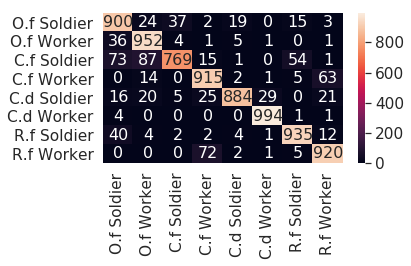

runtime :  17986.84934568405

[78] accuracy: 0.912 loss: 51.354

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.04650789499283, 52

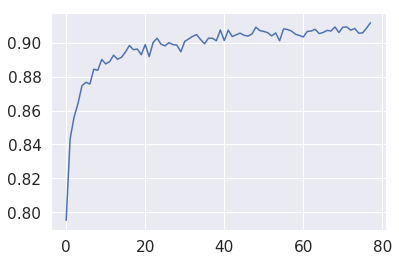

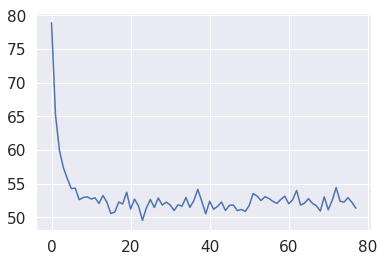

[0, 7, 0, 1, 0, 0, 7, 0, 0, 4, 7, 0, 1, 1, 0, 6, 0, 0, 4, 5, 7, 0, 0, 5, 1, 1, 1, 1, 1, 0, 0, 1, 3, 3, 7, 3, 2, 0, 2, 3, 3, 1, 1, 0, 0, 2, 4, 3, 5, 7, 0, 6, 3, 1, 7, 3, 4, 2, 3, 6, 1, 3, 0, 4, 7, 1, 1, 1, 3, 6, 4, 0, 2, 6, 0, 7, 3, 3, 6, 6, 1, 0, 1, 1, 4, 1, 1, 6, 3, 0, 0, 0, 5, 0, 1, 0, 0, 1, 1, 7, 2, 1, 3, 7, 7, 0, 1, 4, 1, 0, 0, 3, 0, 3, 2, 0, 1, 1, 3, 3, 1, 0, 6, 0, 1, 3, 1, 3, 0, 0, 7, 0, 5, 1, 3, 3, 0, 6, 7, 1, 4, 7, 2, 3, 1, 1, 3, 0, 7, 6, 5, 1, 0, 3, 3, 3, 0, 3, 0, 2, 3, 6, 5, 6, 1, 0, 0, 6, 3, 2, 1, 0, 0, 0, 7, 7, 0, 0, 7, 0, 2, 7, 7, 3, 1, 0, 3, 1, 1, 6, 7, 0, 7, 0, 1, 1, 2, 1, 3, 0, 6, 2, 7, 6, 3, 0, 3, 4, 0, 3, 7, 1, 1, 0, 0, 7, 1, 6, 3, 1, 0, 1, 7, 1, 7, 0, 3, 1, 0, 0, 3, 1, 1, 1, 3, 3, 6, 0, 5, 0, 2, 1, 7, 0, 0, 0, 3, 6, 7, 7, 0, 6, 0, 2, 3, 3, 3, 0, 4, 7, 1, 3, 0, 0, 6, 1, 2, 0, 7, 6, 2, 6, 0, 0, 7, 7, 6, 7, 6, 0, 7, 3, 0, 2, 0, 7, 7, 3, 5, 0, 6, 6, 3, 7, 6, 0, 6, 7, 6, 0, 4, 3, 1, 3, 7, 3, 0, 1, 6, 6, 2, 6, 1, 7, 7, 0, 6, 0, 6, 4, 0, 3, 3, 2, 7, 0, 7, 0, 0, 1, 7, 7, 2, 

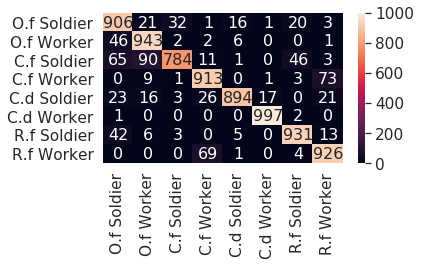

runtime :  18224.781933546066

[79] accuracy: 0.906 loss: 53.086

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 53.0465078

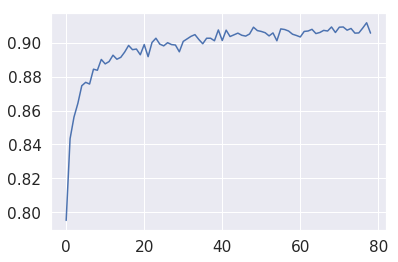

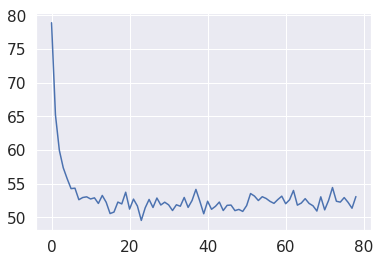

[7, 7, 0, 5, 3, 7, 0, 7, 0, 7, 1, 1, 0, 6, 1, 0, 5, 7, 7, 3, 1, 6, 6, 0, 0, 0, 6, 1, 4, 2, 2, 1, 4, 3, 1, 0, 0, 0, 4, 2, 3, 1, 1, 7, 6, 0, 1, 3, 4, 3, 4, 7, 0, 0, 0, 1, 6, 0, 2, 0, 0, 0, 6, 0, 1, 2, 0, 6, 1, 4, 7, 4, 1, 0, 7, 7, 3, 4, 3, 1, 5, 0, 4, 6, 3, 0, 0, 4, 6, 7, 0, 0, 0, 2, 0, 1, 0, 7, 1, 1, 4, 1, 1, 0, 4, 6, 0, 4, 6, 4, 0, 7, 0, 0, 1, 0, 0, 7, 1, 1, 3, 6, 6, 3, 5, 0, 2, 3, 6, 0, 0, 2, 0, 6, 0, 7, 7, 6, 4, 1, 1, 7, 5, 7, 5, 0, 1, 3, 3, 7, 7, 6, 7, 3, 0, 7, 1, 0, 3, 3, 3, 3, 4, 0, 1, 0, 4, 7, 0, 1, 1, 3, 2, 3, 6, 1, 4, 0, 6, 6, 3, 0, 2, 3, 3, 3, 3, 7, 6, 7, 0, 5, 1, 0, 7, 1, 4, 1, 6, 3, 6, 3, 0, 1, 0, 1, 7, 0, 0, 1, 1, 6, 0, 6, 0, 1, 5, 0, 3, 3, 1, 0, 7, 0, 1, 3, 1, 0, 3, 7, 1, 6, 1, 1, 2, 7, 3, 0, 2, 4, 7, 3, 3, 7, 7, 0, 1, 0, 1, 3, 1, 0, 0, 1, 0, 0, 0, 7, 1, 0, 1, 7, 0, 2, 0, 0, 3, 0, 3, 7, 4, 0, 0, 7, 6, 7, 1, 3, 0, 0, 1, 1, 7, 6, 7, 7, 6, 6, 1, 7, 0, 0, 1, 0, 6, 3, 3, 0, 3, 3, 6, 3, 1, 0, 6, 0, 1, 0, 0, 3, 0, 1, 1, 0, 2, 7, 1, 1, 0, 0, 2, 1, 0, 1, 1, 4, 4, 5, 2, 5, 1, 3, 7, 

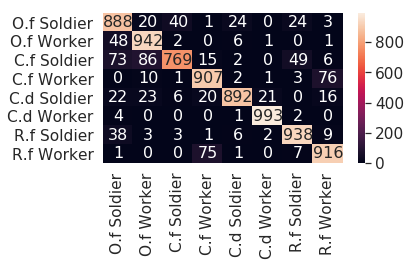

runtime :  18459.199922323227

[80] accuracy: 0.906 loss: 54.000

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580537796, 5

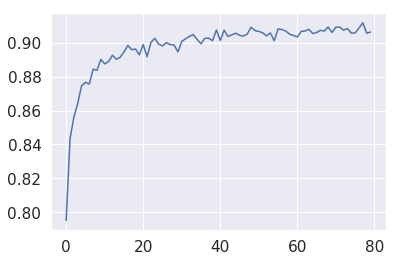

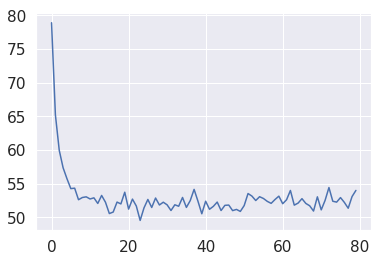

[0, 7, 7, 2, 3, 2, 7, 0, 1, 7, 0, 5, 7, 1, 6, 7, 4, 7, 0, 1, 0, 3, 0, 7, 0, 6, 6, 7, 0, 1, 0, 3, 0, 0, 3, 3, 3, 0, 7, 6, 3, 1, 0, 7, 5, 6, 7, 1, 7, 3, 0, 0, 0, 7, 1, 2, 1, 3, 0, 6, 6, 3, 7, 7, 1, 2, 5, 0, 3, 7, 3, 6, 4, 1, 1, 3, 6, 3, 3, 6, 2, 0, 0, 5, 1, 0, 1, 5, 0, 3, 0, 3, 6, 2, 7, 6, 6, 1, 0, 0, 3, 7, 1, 6, 1, 0, 0, 3, 7, 3, 3, 4, 6, 6, 6, 7, 0, 0, 3, 0, 0, 1, 0, 0, 0, 7, 0, 3, 7, 1, 1, 1, 1, 4, 7, 1, 3, 7, 1, 4, 3, 1, 7, 1, 0, 3, 1, 1, 1, 0, 6, 7, 6, 1, 0, 2, 2, 0, 0, 0, 7, 7, 6, 1, 3, 7, 0, 3, 1, 3, 7, 1, 0, 0, 5, 7, 0, 7, 7, 2, 6, 0, 6, 6, 7, 7, 3, 1, 0, 6, 0, 1, 0, 5, 1, 0, 7, 1, 3, 1, 7, 7, 0, 7, 6, 0, 7, 6, 7, 0, 5, 7, 4, 3, 7, 0, 0, 6, 0, 3, 3, 0, 0, 3, 6, 1, 2, 7, 7, 2, 1, 3, 1, 3, 3, 0, 0, 0, 1, 0, 0, 6, 6, 1, 6, 1, 7, 2, 5, 7, 0, 1, 0, 0, 7, 1, 0, 3, 1, 0, 4, 2, 6, 0, 0, 4, 2, 7, 5, 2, 0, 6, 6, 5, 7, 6, 2, 5, 6, 6, 1, 0, 4, 4, 0, 2, 6, 7, 6, 1, 6, 1, 0, 1, 7, 1, 6, 1, 2, 7, 7, 3, 6, 0, 7, 3, 0, 3, 0, 6, 3, 2, 0, 0, 2, 3, 0, 7, 3, 0, 0, 0, 1, 5, 0, 3, 1, 4, 4, 2, 3, 4, 2, 

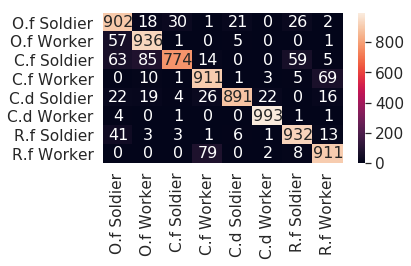

runtime :  18694.896117925644

[81] accuracy: 0.908 loss: 52.831

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 52.94612580

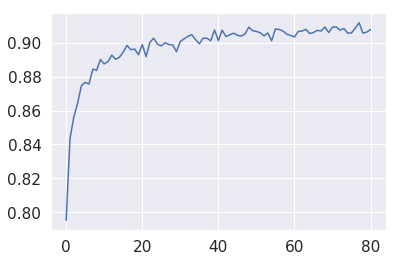

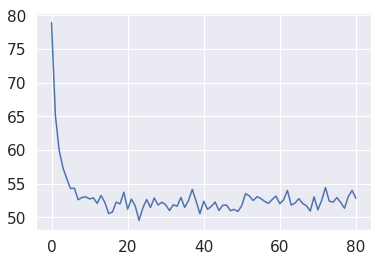

[2, 3, 3, 7, 4, 7, 6, 7, 0, 6, 7, 5, 0, 7, 7, 1, 3, 4, 3, 5, 3, 0, 5, 0, 7, 0, 1, 3, 0, 3, 3, 5, 6, 6, 4, 0, 0, 5, 0, 1, 6, 1, 7, 3, 7, 1, 1, 7, 0, 0, 1, 1, 3, 0, 0, 3, 1, 1, 0, 1, 6, 4, 1, 4, 7, 4, 4, 4, 3, 3, 3, 3, 7, 0, 6, 3, 0, 4, 7, 3, 3, 7, 3, 1, 0, 7, 3, 0, 1, 3, 1, 0, 3, 3, 3, 1, 1, 3, 3, 6, 3, 1, 2, 3, 1, 1, 1, 6, 7, 0, 1, 2, 2, 7, 3, 0, 7, 3, 3, 3, 6, 3, 3, 1, 0, 6, 7, 3, 3, 1, 0, 3, 4, 2, 1, 0, 7, 2, 1, 3, 0, 0, 2, 3, 6, 7, 6, 1, 3, 1, 0, 3, 4, 1, 3, 7, 7, 7, 7, 6, 0, 0, 7, 1, 1, 7, 6, 0, 0, 6, 3, 0, 0, 6, 4, 6, 7, 7, 5, 0, 3, 1, 0, 1, 2, 3, 6, 1, 7, 0, 7, 0, 1, 7, 2, 6, 2, 4, 0, 7, 2, 7, 3, 6, 6, 2, 0, 6, 0, 7, 0, 0, 7, 0, 1, 1, 5, 1, 7, 7, 6, 0, 6, 0, 7, 5, 5, 1, 3, 0, 1, 4, 7, 3, 0, 1, 3, 1, 2, 1, 6, 4, 7, 0, 0, 3, 6, 0, 3, 2, 0, 7, 7, 2, 1, 2, 0, 6, 2, 0, 7, 0, 5, 7, 7, 1, 2, 3, 0, 0, 6, 0, 7, 1, 6, 4, 1, 3, 7, 0, 3, 3, 0, 0, 1, 5, 1, 7, 1, 3, 1, 6, 0, 7, 3, 0, 0, 6, 3, 1, 3, 0, 1, 2, 0, 2, 0, 0, 4, 2, 0, 1, 1, 0, 0, 5, 6, 7, 1, 0, 7, 7, 6, 0, 1, 0, 1, 4, 6, 3, 0, 6, 1, 

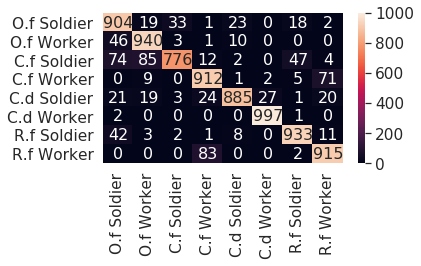

runtime :  18927.147958517075

[82] accuracy: 0.911 loss: 52.358

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.618269473314285, 5

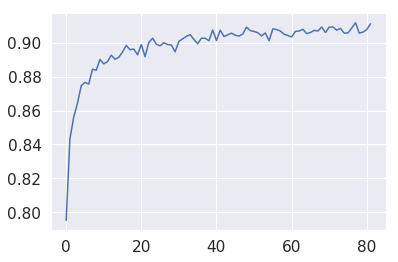

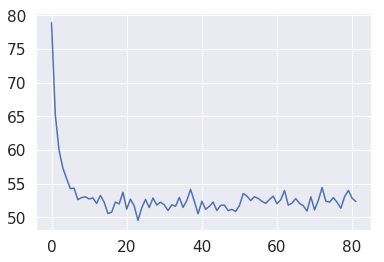

[0, 2, 2, 1, 6, 6, 1, 6, 4, 3, 6, 1, 1, 7, 7, 2, 7, 7, 1, 7, 1, 0, 2, 3, 0, 3, 3, 6, 6, 1, 1, 4, 3, 6, 3, 6, 6, 4, 6, 2, 3, 7, 0, 1, 1, 1, 0, 7, 2, 0, 3, 1, 2, 7, 7, 3, 3, 1, 7, 1, 0, 0, 0, 7, 0, 0, 6, 0, 0, 3, 7, 4, 0, 7, 2, 1, 6, 0, 3, 3, 7, 1, 0, 1, 6, 0, 3, 1, 2, 6, 6, 6, 3, 6, 0, 3, 7, 5, 7, 5, 3, 0, 5, 3, 7, 3, 7, 0, 3, 6, 1, 0, 3, 7, 7, 0, 1, 0, 3, 3, 7, 0, 7, 0, 4, 1, 1, 3, 0, 0, 6, 2, 7, 7, 7, 0, 0, 4, 6, 0, 4, 0, 7, 7, 0, 1, 3, 0, 7, 0, 1, 4, 7, 6, 2, 4, 0, 1, 6, 0, 0, 0, 5, 7, 2, 2, 7, 2, 3, 2, 2, 3, 0, 0, 0, 0, 7, 6, 3, 3, 2, 0, 1, 7, 7, 3, 0, 4, 7, 4, 6, 4, 3, 0, 0, 7, 7, 7, 0, 7, 6, 0, 3, 0, 1, 1, 1, 1, 1, 7, 7, 7, 3, 1, 4, 6, 1, 7, 6, 3, 2, 4, 1, 0, 2, 0, 3, 6, 0, 7, 2, 7, 0, 7, 3, 5, 1, 7, 7, 4, 4, 1, 0, 0, 1, 0, 0, 5, 6, 0, 1, 2, 1, 1, 7, 1, 7, 7, 1, 1, 4, 1, 3, 6, 7, 6, 0, 5, 7, 0, 0, 1, 1, 2, 2, 3, 1, 1, 1, 2, 7, 0, 0, 0, 2, 0, 7, 6, 7, 0, 7, 7, 2, 1, 7, 0, 1, 6, 4, 7, 6, 7, 0, 7, 0, 7, 6, 3, 7, 3, 6, 6, 3, 7, 3, 6, 0, 6, 0, 6, 6, 1, 6, 1, 6, 2, 4, 6, 3, 7, 3, 3, 1, 

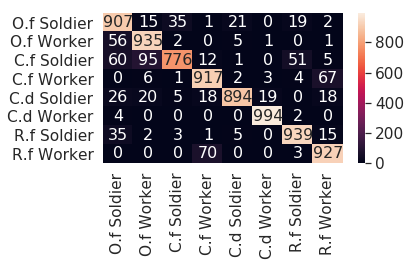

runtime :  19164.488256692886

[83] accuracy: 0.912 loss: 51.084

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.61826947

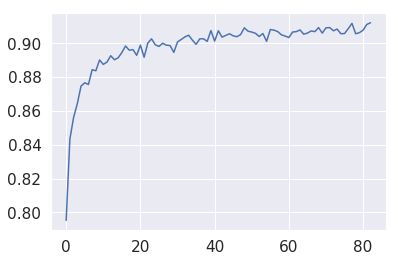

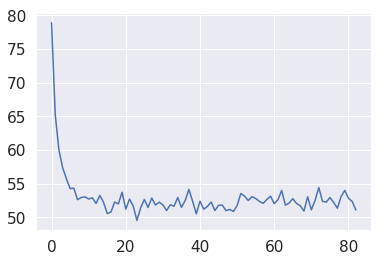

[6, 1, 0, 1, 1, 3, 2, 7, 7, 0, 6, 0, 1, 2, 4, 6, 0, 6, 0, 6, 1, 1, 6, 3, 1, 1, 7, 7, 1, 1, 1, 1, 0, 0, 3, 3, 3, 7, 7, 3, 0, 4, 3, 3, 1, 3, 4, 1, 7, 4, 7, 1, 3, 1, 3, 0, 4, 3, 6, 0, 5, 1, 6, 3, 7, 1, 4, 0, 0, 7, 7, 3, 0, 3, 0, 6, 1, 1, 6, 5, 1, 0, 0, 1, 3, 7, 1, 3, 7, 0, 0, 0, 7, 6, 0, 0, 0, 4, 7, 1, 3, 0, 3, 7, 7, 3, 0, 1, 0, 1, 6, 0, 7, 1, 7, 0, 7, 0, 0, 2, 6, 6, 0, 0, 1, 3, 1, 3, 2, 3, 2, 4, 4, 4, 7, 0, 1, 3, 1, 4, 5, 7, 0, 3, 7, 3, 7, 3, 7, 7, 0, 6, 0, 1, 5, 0, 7, 1, 3, 5, 7, 0, 2, 1, 1, 0, 0, 0, 0, 3, 3, 1, 6, 0, 1, 3, 2, 0, 7, 0, 7, 6, 0, 7, 6, 4, 6, 6, 1, 7, 7, 0, 3, 0, 4, 2, 0, 7, 1, 6, 4, 7, 0, 7, 5, 1, 0, 0, 7, 1, 7, 1, 7, 6, 3, 0, 7, 6, 1, 7, 5, 6, 1, 6, 1, 0, 7, 0, 1, 0, 1, 1, 7, 0, 1, 1, 3, 3, 3, 1, 1, 2, 7, 0, 1, 2, 0, 3, 1, 3, 6, 4, 0, 1, 0, 0, 1, 0, 3, 0, 0, 7, 1, 3, 1, 2, 1, 6, 7, 7, 4, 7, 4, 7, 7, 2, 1, 7, 1, 7, 3, 2, 0, 1, 1, 3, 1, 2, 3, 1, 7, 1, 0, 7, 7, 2, 0, 7, 3, 0, 0, 7, 1, 0, 1, 7, 7, 0, 3, 3, 0, 2, 3, 1, 0, 0, 7, 7, 1, 3, 1, 0, 6, 6, 7, 3, 0, 1, 7, 7, 7, 0, 0, 

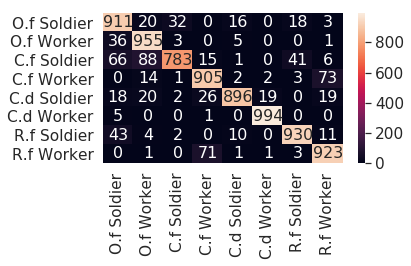

runtime :  19400.8620595932

[84] accuracy: 0.905 loss: 52.342

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.33063389360905, 52.61

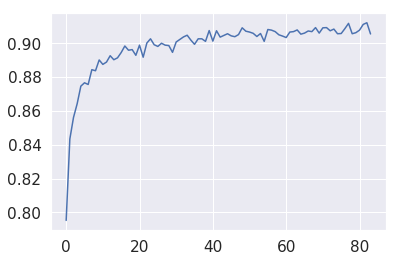

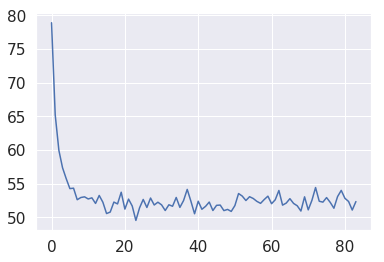

[7, 0, 7, 2, 0, 6, 1, 7, 7, 2, 0, 7, 1, 3, 7, 6, 3, 7, 1, 3, 7, 1, 0, 0, 2, 0, 3, 4, 5, 0, 1, 3, 7, 7, 3, 6, 6, 0, 3, 3, 3, 7, 0, 0, 6, 6, 6, 1, 2, 1, 2, 7, 7, 0, 3, 1, 3, 1, 3, 0, 1, 1, 0, 3, 0, 0, 6, 4, 0, 6, 3, 0, 0, 5, 0, 3, 3, 2, 0, 0, 7, 2, 6, 1, 7, 0, 2, 1, 1, 0, 7, 1, 0, 7, 1, 1, 7, 0, 1, 7, 1, 1, 0, 7, 4, 1, 1, 3, 1, 3, 3, 1, 0, 0, 5, 4, 3, 7, 0, 3, 0, 6, 1, 0, 7, 1, 1, 5, 3, 6, 0, 0, 1, 0, 0, 7, 3, 7, 6, 7, 6, 1, 7, 4, 7, 1, 6, 0, 3, 3, 3, 0, 3, 0, 0, 0, 1, 1, 5, 1, 3, 3, 1, 0, 5, 7, 0, 6, 1, 3, 7, 0, 3, 6, 3, 1, 2, 1, 3, 1, 1, 7, 0, 7, 0, 1, 1, 0, 5, 0, 0, 0, 1, 5, 0, 3, 6, 3, 3, 6, 1, 6, 7, 2, 3, 3, 1, 0, 0, 2, 1, 1, 0, 1, 4, 0, 2, 6, 0, 3, 1, 3, 4, 7, 1, 0, 7, 0, 1, 7, 1, 6, 3, 7, 0, 6, 1, 0, 1, 1, 4, 1, 0, 0, 1, 1, 0, 3, 6, 0, 7, 4, 6, 1, 7, 0, 1, 6, 1, 6, 1, 0, 1, 1, 0, 1, 0, 1, 3, 1, 7, 6, 0, 3, 1, 7, 0, 0, 1, 7, 2, 0, 5, 1, 0, 7, 6, 7, 1, 6, 7, 1, 0, 6, 7, 0, 6, 0, 3, 3, 4, 6, 4, 6, 5, 3, 1, 4, 3, 7, 0, 0, 0, 0, 3, 7, 0, 3, 1, 5, 1, 3, 7, 1, 0, 2, 1, 0, 6, 0, 3, 7, 0, 

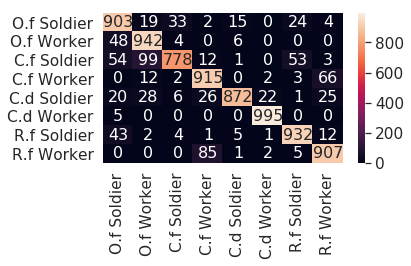

runtime :  19636.507176160812

[85] accuracy: 0.910 loss: 51.492

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.3306338936

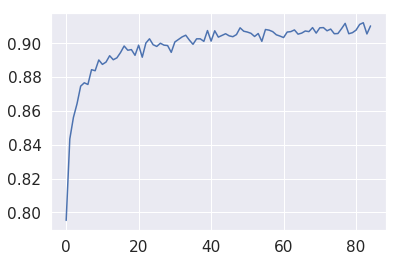

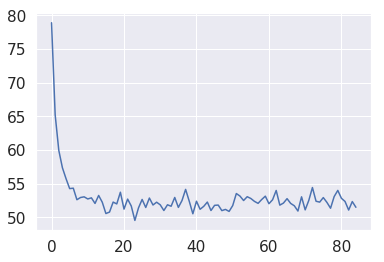

[7, 2, 0, 6, 0, 7, 7, 0, 3, 0, 2, 3, 3, 1, 7, 2, 2, 0, 3, 3, 3, 3, 1, 0, 0, 6, 0, 7, 1, 4, 3, 6, 3, 1, 7, 3, 7, 0, 2, 0, 5, 3, 2, 7, 5, 0, 4, 1, 7, 0, 0, 6, 3, 3, 1, 1, 0, 2, 6, 3, 3, 7, 7, 2, 5, 4, 0, 3, 1, 1, 4, 1, 0, 6, 0, 7, 0, 7, 1, 4, 7, 7, 6, 1, 7, 7, 1, 4, 1, 1, 7, 0, 1, 6, 0, 5, 2, 0, 0, 2, 1, 7, 1, 7, 1, 0, 0, 2, 1, 1, 1, 6, 7, 0, 7, 2, 0, 3, 1, 3, 0, 6, 7, 6, 0, 0, 1, 0, 1, 0, 3, 0, 1, 0, 2, 1, 0, 6, 1, 1, 3, 0, 1, 3, 0, 0, 1, 1, 3, 7, 7, 7, 5, 0, 3, 6, 3, 0, 1, 1, 3, 6, 7, 1, 0, 0, 3, 7, 0, 6, 0, 3, 0, 3, 1, 1, 3, 2, 5, 1, 0, 3, 0, 3, 3, 1, 1, 0, 6, 1, 4, 0, 7, 7, 3, 6, 1, 3, 1, 2, 1, 3, 3, 7, 0, 0, 2, 1, 0, 0, 6, 1, 6, 0, 0, 0, 3, 3, 5, 0, 3, 5, 3, 0, 7, 3, 3, 1, 0, 2, 7, 1, 3, 0, 0, 6, 1, 3, 6, 3, 7, 2, 0, 1, 2, 1, 2, 7, 1, 6, 0, 0, 1, 7, 7, 0, 0, 7, 1, 3, 2, 5, 7, 0, 6, 2, 1, 7, 0, 5, 0, 2, 2, 7, 1, 7, 4, 3, 7, 3, 0, 1, 3, 0, 7, 7, 5, 7, 3, 3, 7, 3, 0, 0, 3, 3, 5, 6, 1, 3, 6, 7, 0, 6, 6, 0, 1, 6, 0, 4, 7, 2, 3, 7, 6, 2, 5, 0, 5, 7, 0, 1, 6, 6, 7, 0, 3, 7, 7, 2, 2, 1, 0, 

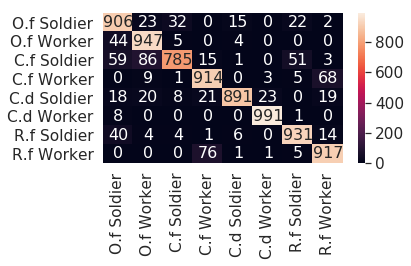

runtime :  19874.636115074158

[86] accuracy: 0.909 loss: 51.662

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762054, 54.

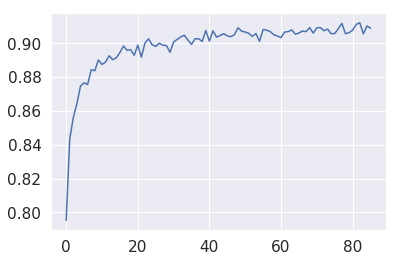

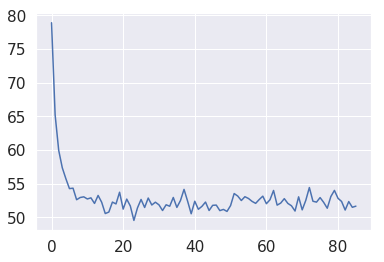

[5, 0, 0, 1, 3, 4, 0, 1, 1, 0, 3, 3, 0, 0, 3, 2, 3, 5, 4, 7, 6, 1, 3, 2, 1, 7, 0, 3, 6, 0, 0, 2, 5, 1, 6, 0, 6, 1, 0, 0, 0, 3, 0, 3, 3, 0, 6, 4, 6, 4, 6, 2, 7, 1, 0, 3, 7, 0, 1, 3, 3, 0, 1, 3, 0, 6, 7, 0, 1, 6, 7, 3, 1, 1, 1, 7, 2, 4, 1, 6, 3, 7, 4, 7, 4, 4, 1, 7, 3, 2, 7, 5, 0, 1, 3, 7, 7, 1, 3, 1, 3, 0, 0, 3, 0, 3, 1, 7, 0, 1, 7, 5, 4, 0, 3, 4, 0, 1, 3, 6, 1, 0, 1, 7, 2, 1, 1, 1, 2, 0, 0, 1, 1, 0, 2, 0, 2, 6, 3, 6, 7, 0, 1, 1, 7, 1, 7, 3, 7, 4, 6, 2, 7, 3, 0, 7, 1, 2, 3, 1, 0, 3, 3, 2, 3, 7, 2, 3, 1, 4, 5, 7, 3, 4, 3, 3, 3, 6, 4, 7, 0, 7, 0, 7, 1, 3, 7, 6, 0, 3, 0, 0, 2, 7, 5, 3, 1, 1, 1, 6, 6, 1, 1, 1, 0, 3, 0, 1, 0, 3, 6, 1, 3, 0, 3, 2, 7, 1, 5, 1, 3, 2, 3, 1, 6, 0, 6, 7, 0, 0, 4, 1, 6, 0, 5, 0, 1, 6, 0, 3, 7, 6, 4, 5, 3, 1, 1, 7, 7, 6, 7, 0, 3, 5, 0, 6, 6, 1, 3, 7, 0, 3, 7, 7, 3, 5, 6, 7, 4, 3, 6, 0, 7, 0, 6, 0, 0, 1, 1, 0, 7, 3, 1, 0, 3, 0, 1, 3, 6, 2, 4, 1, 3, 6, 1, 0, 7, 1, 7, 0, 0, 1, 0, 3, 4, 3, 0, 2, 0, 0, 0, 1, 0, 3, 1, 6, 1, 1, 1, 2, 1, 3, 6, 7, 1, 3, 1, 2, 2, 0, 1, 0, 2, 

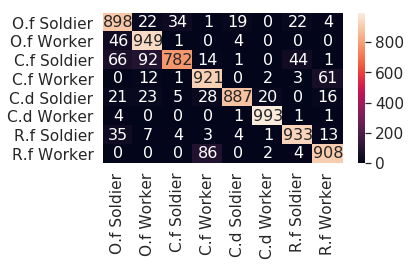

runtime :  20110.48208475113

[87] accuracy: 0.910 loss: 52.404

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.268496453762

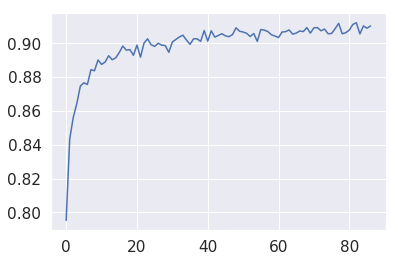

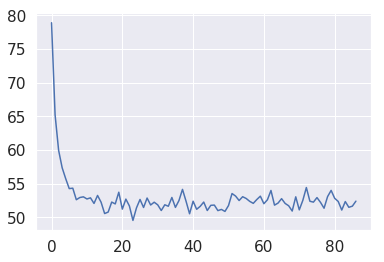

[3, 7, 7, 0, 3, 7, 0, 6, 7, 0, 2, 1, 1, 0, 7, 3, 1, 7, 1, 1, 4, 7, 1, 4, 7, 6, 3, 1, 0, 1, 3, 1, 3, 0, 3, 7, 0, 4, 1, 0, 0, 2, 0, 1, 7, 2, 1, 7, 7, 7, 7, 1, 6, 6, 1, 0, 0, 1, 5, 3, 3, 1, 3, 0, 0, 6, 1, 1, 0, 3, 1, 0, 1, 3, 1, 4, 7, 3, 0, 3, 3, 6, 0, 0, 0, 0, 1, 3, 3, 1, 7, 2, 7, 0, 0, 7, 1, 0, 1, 3, 6, 7, 1, 1, 2, 0, 1, 7, 6, 7, 3, 3, 1, 3, 7, 3, 6, 7, 3, 7, 1, 0, 3, 3, 7, 3, 0, 0, 3, 3, 2, 7, 3, 1, 7, 6, 1, 1, 2, 0, 1, 7, 7, 0, 7, 1, 0, 0, 7, 0, 7, 0, 1, 1, 0, 7, 5, 1, 1, 6, 6, 6, 3, 0, 0, 0, 5, 3, 3, 7, 0, 0, 6, 0, 7, 0, 1, 3, 1, 3, 0, 2, 0, 0, 3, 1, 7, 1, 1, 0, 1, 0, 3, 3, 0, 4, 6, 0, 2, 7, 7, 5, 4, 0, 3, 6, 3, 0, 1, 1, 0, 1, 7, 6, 1, 1, 7, 2, 1, 2, 3, 1, 2, 3, 6, 2, 0, 5, 3, 0, 2, 1, 0, 1, 4, 0, 0, 0, 0, 0, 4, 0, 7, 1, 3, 1, 0, 0, 0, 1, 1, 2, 6, 1, 7, 3, 3, 1, 0, 3, 1, 3, 7, 7, 1, 0, 7, 1, 3, 7, 1, 3, 7, 1, 0, 5, 0, 6, 0, 3, 2, 0, 6, 5, 0, 1, 1, 1, 3, 6, 0, 1, 1, 0, 2, 1, 0, 1, 7, 7, 0, 3, 5, 0, 3, 3, 3, 1, 6, 7, 0, 7, 6, 0, 1, 4, 6, 0, 1, 0, 3, 1, 6, 4, 7, 6, 7, 0, 0, 2, 0, 1, 2, 

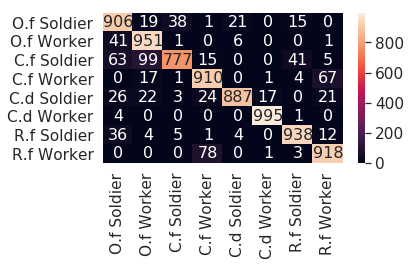

runtime :  20347.001574993134

[88] accuracy: 0.906 loss: 52.861

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 54.2

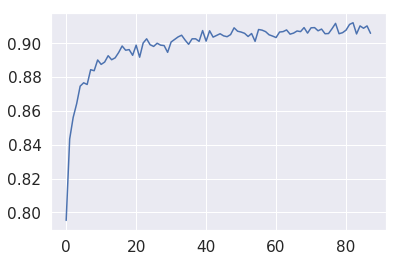

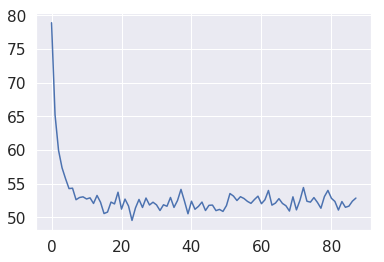

[3, 7, 6, 7, 3, 5, 1, 1, 1, 1, 0, 0, 1, 0, 1, 2, 4, 6, 1, 7, 1, 3, 0, 3, 0, 4, 1, 7, 1, 6, 7, 7, 0, 3, 1, 7, 0, 1, 1, 1, 6, 5, 7, 6, 7, 4, 3, 1, 0, 0, 4, 2, 7, 7, 0, 5, 1, 1, 5, 7, 5, 1, 7, 7, 1, 4, 0, 7, 0, 0, 1, 0, 1, 3, 1, 4, 0, 0, 2, 7, 6, 0, 3, 6, 2, 5, 6, 3, 1, 5, 6, 1, 3, 3, 0, 0, 1, 0, 4, 1, 0, 6, 3, 4, 7, 1, 6, 7, 0, 3, 3, 2, 0, 1, 2, 3, 1, 0, 1, 1, 7, 6, 0, 1, 7, 0, 7, 6, 6, 6, 2, 7, 7, 2, 3, 0, 6, 0, 3, 0, 1, 2, 0, 0, 0, 7, 1, 0, 7, 7, 6, 0, 0, 0, 7, 6, 2, 0, 6, 6, 0, 3, 0, 0, 0, 6, 0, 0, 7, 5, 1, 0, 3, 7, 1, 6, 6, 1, 0, 3, 2, 7, 5, 2, 7, 2, 0, 1, 1, 7, 0, 7, 6, 4, 6, 1, 3, 2, 1, 1, 2, 1, 1, 6, 1, 1, 7, 0, 0, 6, 2, 0, 4, 1, 7, 7, 0, 3, 1, 1, 0, 3, 1, 7, 0, 4, 1, 0, 4, 7, 7, 0, 1, 1, 0, 7, 3, 0, 0, 0, 2, 7, 1, 6, 0, 0, 1, 2, 0, 0, 3, 7, 0, 1, 3, 6, 1, 3, 2, 4, 6, 2, 1, 7, 1, 1, 1, 4, 7, 4, 0, 2, 2, 6, 6, 3, 4, 5, 0, 0, 0, 1, 7, 1, 0, 3, 7, 3, 4, 1, 3, 0, 7, 1, 0, 1, 3, 0, 7, 7, 1, 6, 1, 3, 7, 7, 7, 2, 6, 7, 3, 3, 4, 3, 0, 0, 7, 0, 0, 6, 6, 1, 7, 6, 7, 4, 3, 0, 7, 6, 1, 0, 7, 

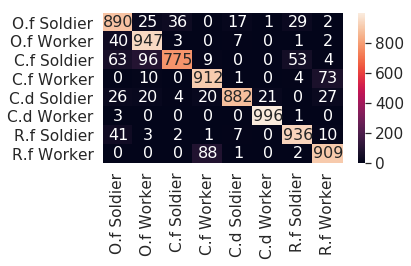

runtime :  20584.4519200325

[89] accuracy: 0.910 loss: 52.061

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.74388614296913, 

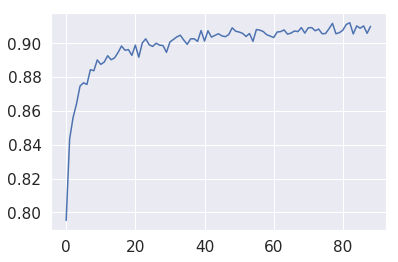

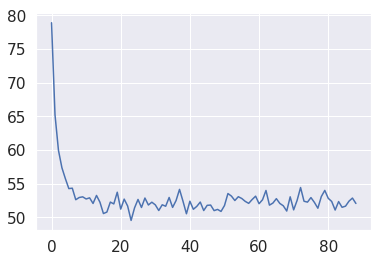

[7, 3, 0, 0, 1, 1, 0, 2, 1, 0, 3, 3, 3, 1, 0, 7, 6, 3, 4, 1, 6, 0, 1, 0, 7, 7, 6, 0, 3, 7, 0, 3, 3, 3, 7, 1, 0, 1, 0, 0, 0, 3, 7, 6, 7, 1, 0, 6, 0, 1, 0, 0, 1, 1, 3, 5, 3, 1, 1, 7, 2, 0, 0, 6, 3, 3, 3, 1, 1, 0, 1, 0, 6, 6, 7, 3, 1, 6, 7, 6, 3, 1, 2, 6, 0, 4, 7, 2, 7, 6, 0, 1, 0, 1, 1, 1, 1, 4, 1, 1, 4, 0, 0, 7, 1, 1, 7, 6, 0, 3, 3, 7, 2, 7, 7, 3, 0, 6, 7, 0, 0, 6, 7, 7, 2, 3, 4, 1, 5, 7, 0, 6, 2, 5, 3, 4, 1, 1, 7, 1, 7, 7, 4, 1, 0, 1, 0, 3, 7, 3, 3, 6, 6, 6, 3, 1, 3, 0, 1, 1, 1, 7, 1, 1, 1, 7, 1, 6, 0, 1, 1, 7, 1, 3, 0, 1, 3, 3, 7, 6, 7, 0, 6, 1, 3, 5, 1, 7, 0, 3, 0, 1, 0, 3, 2, 7, 6, 5, 6, 5, 7, 3, 0, 6, 7, 0, 7, 1, 7, 1, 1, 1, 0, 6, 2, 2, 7, 0, 3, 3, 6, 1, 0, 0, 1, 1, 0, 1, 1, 3, 7, 0, 3, 1, 0, 0, 0, 7, 3, 4, 3, 0, 3, 1, 1, 3, 0, 3, 6, 6, 3, 3, 1, 6, 1, 1, 1, 7, 3, 1, 3, 0, 7, 3, 0, 7, 1, 0, 0, 1, 7, 6, 6, 0, 1, 5, 1, 0, 5, 1, 0, 2, 1, 2, 0, 0, 1, 0, 0, 6, 4, 5, 4, 7, 3, 3, 7, 3, 6, 3, 3, 7, 3, 1, 3, 3, 6, 1, 0, 6, 2, 6, 6, 3, 0, 4, 6, 0, 3, 3, 2, 1, 4, 3, 5, 7, 0, 3, 0, 2, 4, 7, 0, 

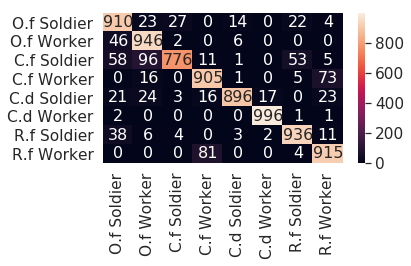

runtime :  20820.897423505783

[90] accuracy: 0.908 loss: 53.195

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 55.7438

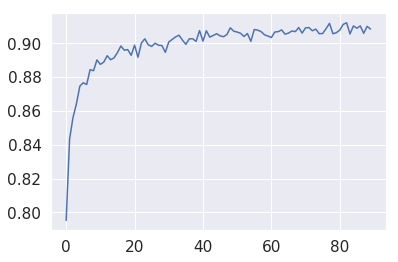

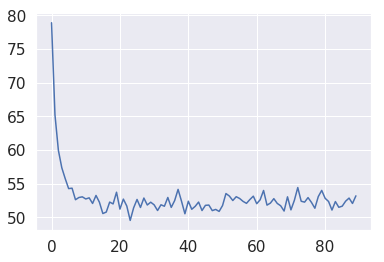

[3, 7, 7, 6, 2, 7, 6, 1, 0, 6, 1, 7, 3, 1, 5, 3, 3, 1, 6, 1, 7, 6, 0, 1, 1, 0, 2, 6, 3, 0, 1, 2, 0, 3, 2, 0, 0, 7, 0, 0, 0, 1, 3, 0, 7, 0, 3, 0, 3, 2, 7, 1, 0, 7, 4, 0, 1, 6, 1, 7, 7, 7, 6, 0, 0, 7, 0, 4, 5, 0, 5, 0, 0, 1, 0, 2, 3, 7, 1, 1, 1, 3, 0, 3, 6, 1, 1, 3, 7, 7, 6, 6, 4, 1, 7, 0, 0, 0, 6, 3, 1, 2, 1, 6, 0, 0, 0, 4, 1, 0, 7, 3, 7, 1, 6, 0, 1, 1, 0, 2, 0, 3, 7, 3, 1, 1, 1, 6, 0, 4, 7, 3, 0, 6, 0, 1, 3, 0, 1, 0, 3, 7, 0, 3, 1, 0, 0, 2, 6, 1, 3, 0, 1, 4, 1, 1, 7, 7, 7, 0, 0, 1, 1, 6, 1, 1, 0, 2, 0, 0, 7, 3, 1, 0, 4, 3, 0, 2, 1, 3, 0, 3, 1, 6, 3, 2, 0, 1, 6, 7, 3, 0, 2, 1, 7, 0, 0, 1, 3, 7, 1, 1, 6, 1, 3, 6, 7, 0, 7, 3, 6, 7, 0, 1, 1, 7, 6, 0, 7, 3, 7, 1, 7, 0, 4, 4, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 3, 2, 1, 3, 6, 3, 3, 6, 6, 1, 6, 7, 0, 2, 0, 3, 7, 7, 3, 1, 1, 6, 0, 1, 5, 7, 0, 7, 7, 2, 7, 0, 6, 3, 1, 2, 6, 6, 6, 4, 2, 6, 5, 1, 0, 7, 1, 3, 3, 0, 0, 7, 3, 1, 7, 7, 1, 6, 3, 3, 4, 0, 1, 3, 1, 2, 1, 7, 0, 2, 1, 3, 3, 3, 3, 3, 1, 0, 3, 2, 7, 1, 1, 0, 0, 1, 0, 6, 1, 1, 2, 3, 3, 3, 3, 2, 3, 

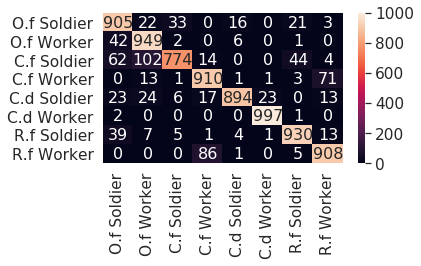

runtime :  21056.65855026245

[91] accuracy: 0.908 loss: 53.760

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694069743156, 

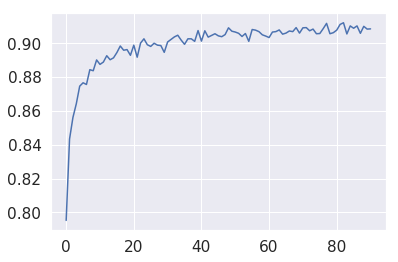

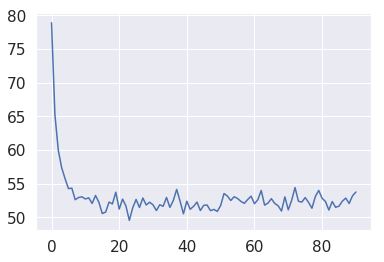

[5, 2, 3, 0, 1, 1, 7, 3, 3, 0, 1, 3, 6, 2, 1, 2, 3, 1, 3, 1, 1, 0, 6, 0, 0, 6, 3, 2, 0, 6, 1, 6, 1, 0, 7, 1, 3, 0, 1, 2, 0, 1, 7, 1, 7, 6, 3, 1, 3, 6, 7, 3, 0, 2, 4, 1, 6, 2, 7, 7, 5, 1, 0, 7, 5, 3, 7, 2, 3, 7, 6, 0, 4, 7, 1, 1, 3, 1, 7, 1, 0, 6, 0, 3, 1, 3, 0, 3, 1, 6, 0, 3, 6, 1, 7, 0, 1, 3, 5, 1, 0, 7, 7, 0, 1, 0, 0, 1, 3, 3, 3, 1, 1, 0, 0, 1, 3, 0, 0, 3, 3, 0, 4, 3, 6, 0, 7, 1, 4, 0, 1, 6, 1, 7, 3, 7, 1, 1, 0, 3, 2, 3, 0, 3, 3, 1, 3, 6, 0, 6, 3, 1, 1, 0, 4, 2, 2, 2, 0, 0, 5, 1, 1, 4, 1, 0, 1, 7, 0, 1, 6, 7, 7, 3, 1, 5, 4, 7, 4, 4, 7, 7, 4, 0, 6, 0, 7, 5, 5, 7, 6, 7, 3, 6, 3, 1, 0, 1, 0, 4, 7, 0, 3, 3, 7, 0, 1, 6, 1, 0, 7, 2, 6, 7, 0, 5, 7, 4, 2, 0, 0, 2, 2, 3, 0, 4, 7, 5, 0, 4, 0, 3, 1, 0, 7, 3, 7, 2, 1, 3, 1, 0, 2, 3, 1, 0, 0, 3, 0, 7, 0, 1, 3, 1, 3, 1, 6, 5, 0, 2, 6, 7, 0, 7, 4, 6, 6, 3, 1, 1, 1, 7, 1, 3, 7, 6, 0, 6, 2, 1, 1, 0, 0, 1, 7, 6, 0, 5, 0, 3, 0, 1, 6, 0, 7, 1, 1, 6, 0, 1, 7, 1, 1, 7, 0, 3, 1, 4, 7, 3, 7, 6, 3, 1, 1, 6, 1, 6, 0, 0, 2, 5, 6, 6, 6, 2, 0, 0, 0, 6, 2, 2, 6, 

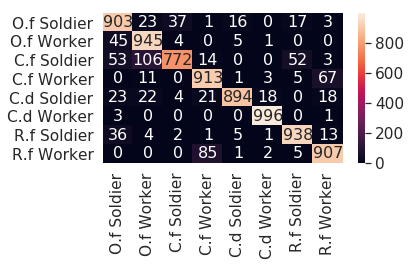

runtime :  21292.563673734665

[92] accuracy: 0.911 loss: 51.850

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 57.362694

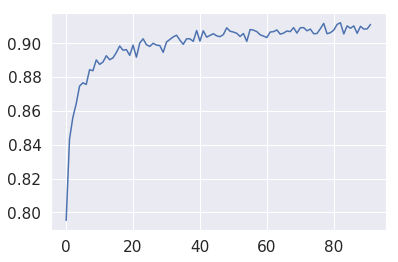

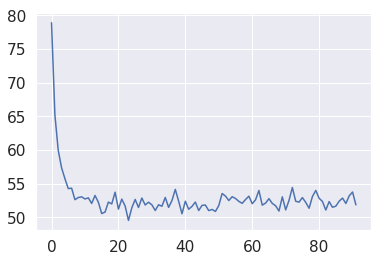

[0, 0, 3, 1, 0, 3, 3, 2, 3, 0, 3, 5, 0, 2, 3, 1, 0, 2, 1, 0, 0, 7, 3, 7, 7, 4, 5, 1, 0, 2, 0, 3, 6, 2, 1, 6, 1, 6, 0, 0, 7, 1, 7, 6, 1, 3, 7, 6, 5, 3, 3, 3, 6, 7, 3, 2, 7, 1, 6, 5, 1, 0, 1, 1, 4, 6, 1, 2, 3, 2, 6, 0, 6, 1, 2, 3, 7, 6, 7, 0, 5, 3, 7, 3, 1, 6, 7, 0, 6, 3, 3, 6, 7, 5, 7, 2, 1, 3, 7, 0, 3, 7, 1, 6, 1, 7, 1, 1, 1, 1, 7, 7, 3, 4, 7, 0, 1, 1, 3, 3, 6, 6, 7, 1, 0, 1, 0, 0, 1, 1, 7, 1, 0, 0, 1, 3, 3, 2, 6, 1, 0, 0, 1, 2, 5, 0, 0, 1, 7, 0, 7, 1, 0, 1, 3, 0, 0, 1, 1, 1, 1, 0, 1, 6, 4, 3, 6, 3, 7, 0, 2, 1, 6, 3, 0, 0, 1, 2, 0, 1, 4, 0, 0, 7, 7, 2, 5, 2, 6, 6, 1, 1, 7, 0, 0, 0, 7, 0, 7, 3, 0, 0, 7, 2, 1, 0, 3, 7, 0, 3, 1, 0, 7, 1, 3, 2, 0, 2, 3, 6, 3, 6, 3, 1, 6, 1, 2, 0, 0, 7, 1, 0, 0, 7, 5, 7, 0, 7, 1, 1, 1, 2, 0, 6, 1, 6, 7, 6, 5, 6, 4, 0, 3, 6, 7, 7, 0, 0, 6, 0, 6, 7, 7, 1, 6, 3, 1, 6, 3, 1, 4, 6, 1, 1, 1, 1, 0, 1, 6, 1, 4, 5, 0, 1, 0, 1, 0, 0, 6, 7, 6, 1, 7, 6, 3, 3, 1, 6, 4, 6, 6, 0, 1, 0, 7, 1, 1, 6, 3, 3, 1, 1, 6, 7, 0, 0, 0, 1, 7, 7, 1, 5, 4, 6, 2, 0, 3, 3, 0, 1, 3, 4, 7, 

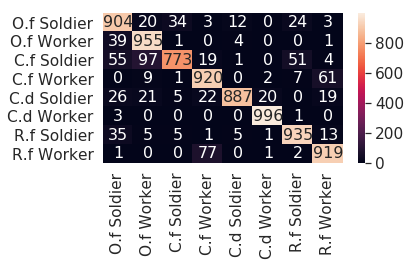

runtime :  21528.268068790436

[93] accuracy: 0.911 loss: 51.738

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125, 0.91075]
[78.90227195620537, 65.22312009334564, 59.95338340103626, 

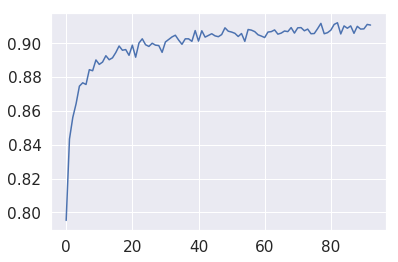

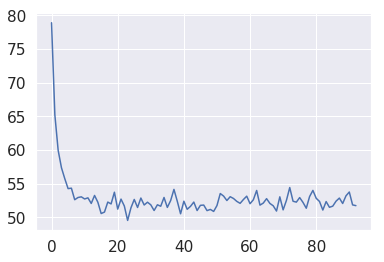

[1, 0, 3, 1, 0, 2, 1, 1, 6, 7, 0, 6, 3, 6, 7, 3, 0, 7, 1, 6, 6, 4, 1, 3, 3, 1, 3, 3, 0, 3, 6, 2, 6, 0, 1, 3, 7, 5, 2, 0, 7, 6, 7, 4, 6, 6, 1, 0, 7, 3, 3, 3, 7, 1, 2, 0, 1, 7, 2, 6, 6, 5, 4, 3, 6, 1, 6, 1, 1, 0, 2, 3, 1, 3, 0, 0, 0, 0, 0, 0, 1, 0, 0, 6, 1, 0, 6, 0, 2, 3, 1, 6, 2, 4, 1, 7, 0, 3, 3, 0, 1, 3, 0, 2, 1, 1, 1, 0, 6, 1, 2, 1, 0, 7, 7, 0, 1, 5, 7, 1, 1, 0, 3, 0, 6, 2, 7, 0, 3, 3, 2, 0, 7, 0, 2, 1, 1, 7, 0, 3, 4, 0, 1, 0, 3, 4, 3, 7, 1, 0, 7, 3, 3, 7, 3, 0, 5, 4, 3, 7, 0, 7, 2, 5, 0, 1, 4, 7, 0, 0, 3, 3, 6, 0, 0, 3, 0, 2, 0, 4, 1, 1, 0, 3, 3, 7, 1, 1, 7, 0, 2, 3, 6, 7, 3, 3, 0, 7, 6, 7, 1, 6, 7, 3, 1, 0, 0, 7, 7, 7, 7, 1, 1, 3, 2, 7, 1, 3, 1, 1, 0, 7, 6, 4, 0, 1, 1, 3, 1, 1, 0, 3, 0, 6, 0, 0, 5, 7, 5, 0, 2, 0, 7, 1, 0, 1, 1, 0, 1, 1, 0, 0, 6, 6, 0, 3, 4, 4, 1, 4, 1, 0, 1, 3, 1, 1, 7, 4, 1, 5, 3, 0, 6, 3, 7, 3, 0, 2, 7, 3, 0, 7, 7, 7, 0, 7, 1, 3, 3, 1, 6, 1, 0, 0, 1, 6, 4, 1, 0, 3, 0, 3, 7, 7, 3, 6, 1, 3, 6, 3, 0, 7, 7, 4, 0, 1, 7, 1, 1, 1, 2, 1, 6, 3, 0, 2, 7, 3, 2, 1, 1, 3, 0, 

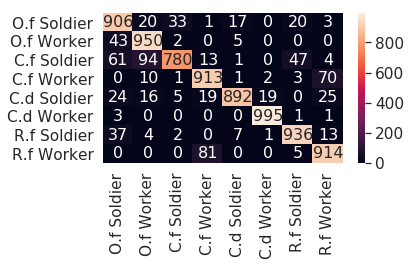

runtime :  21764.051409482956

[94] accuracy: 0.912 loss: 53.556

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125, 0.91075, 0.912125]
[78.90227195620537, 65.22312009334564, 59.953383

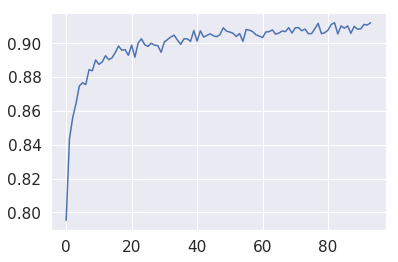

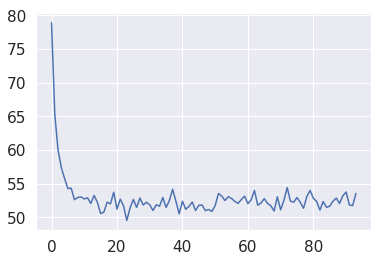

[5, 1, 4, 6, 1, 3, 3, 3, 1, 6, 4, 0, 3, 1, 0, 0, 7, 1, 1, 7, 0, 1, 7, 7, 4, 0, 0, 7, 1, 4, 2, 3, 3, 2, 0, 2, 1, 1, 7, 0, 7, 6, 3, 1, 3, 0, 1, 5, 0, 0, 5, 0, 0, 6, 6, 6, 0, 6, 6, 1, 1, 3, 0, 7, 6, 0, 1, 1, 3, 3, 6, 2, 7, 1, 3, 0, 0, 0, 4, 5, 1, 0, 3, 0, 1, 1, 7, 1, 6, 2, 3, 1, 0, 2, 3, 0, 1, 1, 6, 6, 6, 7, 1, 3, 3, 5, 0, 0, 3, 3, 0, 3, 3, 3, 3, 0, 1, 7, 3, 7, 1, 0, 0, 6, 4, 7, 7, 6, 0, 6, 1, 0, 0, 5, 7, 0, 0, 0, 1, 6, 4, 1, 6, 1, 3, 0, 5, 6, 3, 2, 1, 0, 3, 1, 7, 3, 3, 0, 1, 0, 2, 0, 1, 6, 4, 6, 1, 1, 0, 1, 6, 5, 2, 0, 0, 4, 1, 1, 7, 1, 7, 3, 3, 4, 1, 1, 4, 1, 7, 3, 3, 7, 0, 5, 3, 6, 6, 6, 0, 6, 0, 3, 0, 2, 3, 7, 2, 0, 6, 6, 1, 1, 7, 0, 7, 1, 1, 6, 2, 3, 1, 7, 2, 7, 1, 2, 3, 3, 6, 0, 4, 6, 1, 3, 6, 7, 1, 0, 0, 1, 7, 2, 4, 1, 2, 3, 1, 0, 1, 3, 1, 2, 3, 0, 0, 2, 0, 1, 3, 0, 3, 3, 3, 0, 6, 0, 3, 1, 1, 0, 4, 2, 7, 7, 1, 7, 7, 0, 0, 7, 7, 5, 0, 3, 1, 7, 1, 7, 1, 3, 7, 2, 0, 3, 1, 1, 3, 0, 6, 7, 1, 0, 6, 0, 0, 6, 4, 0, 7, 3, 6, 1, 7, 1, 0, 7, 1, 6, 3, 7, 7, 1, 1, 0, 7, 3, 0, 0, 4, 1, 6, 7, 7, 

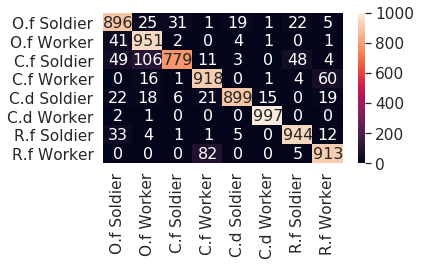

runtime :  21999.06937122345

[95] accuracy: 0.911 loss: 51.900

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125, 0.91075, 0.912125, 0.91075]
[78.90227195620537, 65.22312009334564, 5

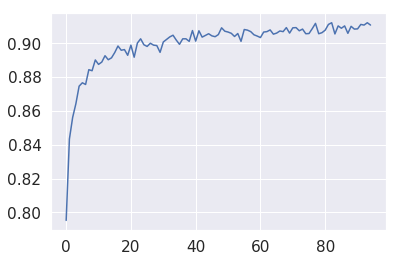

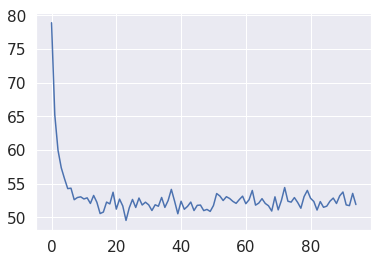

[0, 1, 6, 6, 1, 1, 3, 6, 6, 3, 4, 4, 0, 2, 1, 3, 1, 3, 3, 0, 2, 3, 3, 0, 0, 0, 7, 0, 3, 1, 3, 1, 2, 3, 7, 0, 0, 1, 6, 1, 3, 7, 0, 1, 3, 7, 1, 1, 2, 0, 1, 6, 0, 1, 6, 3, 3, 7, 0, 3, 3, 6, 6, 0, 1, 3, 0, 6, 3, 0, 7, 0, 7, 0, 7, 0, 4, 1, 6, 5, 0, 1, 6, 5, 1, 0, 1, 1, 4, 6, 3, 6, 2, 2, 3, 4, 0, 0, 6, 1, 6, 7, 6, 1, 2, 1, 1, 1, 1, 3, 3, 3, 0, 7, 6, 2, 0, 7, 7, 7, 0, 1, 6, 7, 0, 0, 2, 1, 7, 3, 7, 0, 0, 3, 1, 7, 1, 0, 0, 1, 0, 4, 6, 0, 2, 3, 0, 0, 1, 7, 6, 7, 1, 5, 3, 0, 3, 1, 0, 2, 1, 6, 7, 6, 7, 7, 6, 1, 3, 6, 1, 3, 1, 2, 3, 3, 0, 4, 0, 0, 3, 0, 6, 3, 7, 5, 0, 6, 1, 6, 2, 0, 1, 1, 0, 7, 3, 6, 0, 0, 0, 4, 0, 6, 4, 3, 2, 7, 7, 3, 4, 7, 3, 0, 1, 0, 7, 4, 6, 1, 1, 1, 7, 0, 0, 1, 0, 6, 1, 0, 3, 6, 2, 0, 7, 6, 1, 0, 7, 3, 2, 3, 4, 6, 0, 6, 0, 0, 0, 3, 3, 1, 3, 6, 3, 1, 7, 7, 2, 4, 7, 0, 6, 0, 0, 1, 1, 3, 0, 7, 7, 3, 7, 2, 3, 1, 7, 6, 0, 6, 6, 6, 3, 0, 7, 3, 0, 2, 1, 3, 7, 0, 7, 0, 7, 4, 0, 3, 1, 0, 0, 4, 6, 0, 6, 7, 2, 0, 0, 6, 1, 1, 7, 0, 3, 1, 0, 1, 0, 7, 0, 1, 1, 7, 0, 6, 0, 3, 5, 5, 7, 3, 3, 

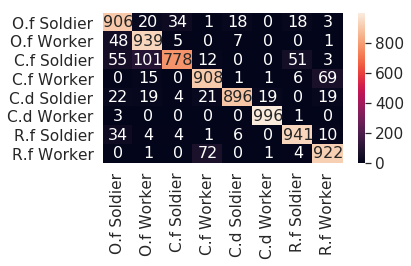

runtime :  22235.616122961044

[96] accuracy: 0.910 loss: 52.468

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125, 0.91075, 0.912125, 0.91075, 0.91025]
[78.90227195620537, 65.2231200

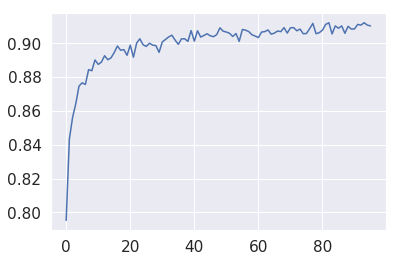

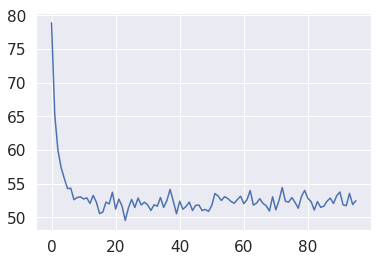

[6, 0, 3, 1, 0, 1, 7, 3, 6, 0, 0, 3, 5, 1, 7, 1, 6, 5, 1, 1, 6, 1, 2, 6, 3, 1, 1, 1, 5, 0, 3, 2, 0, 1, 4, 6, 3, 7, 0, 3, 1, 0, 0, 1, 1, 0, 0, 6, 1, 3, 7, 2, 1, 6, 4, 6, 0, 0, 3, 1, 0, 7, 0, 5, 1, 2, 0, 1, 0, 6, 4, 1, 7, 3, 3, 1, 0, 7, 3, 3, 1, 7, 0, 0, 0, 5, 5, 3, 7, 3, 3, 0, 2, 0, 0, 5, 1, 7, 1, 7, 6, 6, 0, 3, 1, 7, 6, 3, 7, 7, 2, 4, 1, 1, 0, 4, 7, 1, 7, 7, 4, 4, 6, 0, 3, 0, 0, 1, 1, 7, 0, 7, 1, 3, 2, 3, 6, 1, 3, 1, 7, 6, 1, 5, 0, 0, 1, 7, 0, 0, 0, 7, 0, 2, 3, 1, 3, 0, 7, 6, 1, 1, 6, 1, 3, 3, 2, 7, 7, 1, 3, 1, 5, 1, 3, 1, 0, 3, 6, 3, 3, 3, 0, 4, 1, 0, 3, 6, 7, 0, 2, 7, 1, 4, 3, 1, 0, 3, 3, 5, 0, 0, 0, 1, 7, 3, 1, 1, 0, 7, 5, 2, 3, 2, 7, 2, 3, 1, 1, 3, 0, 1, 1, 6, 2, 2, 3, 7, 7, 2, 6, 3, 1, 3, 1, 5, 1, 1, 1, 0, 7, 6, 3, 0, 0, 6, 7, 3, 1, 6, 3, 6, 1, 3, 1, 3, 6, 1, 0, 1, 0, 0, 7, 6, 7, 3, 1, 6, 0, 3, 6, 6, 0, 0, 6, 6, 0, 3, 7, 5, 0, 1, 0, 0, 7, 6, 0, 7, 1, 7, 0, 0, 6, 7, 2, 1, 0, 0, 3, 7, 6, 7, 7, 7, 0, 7, 0, 2, 1, 1, 0, 4, 5, 0, 0, 4, 0, 0, 6, 6, 1, 0, 2, 3, 0, 1, 0, 3, 1, 6, 0, 3, 0, 

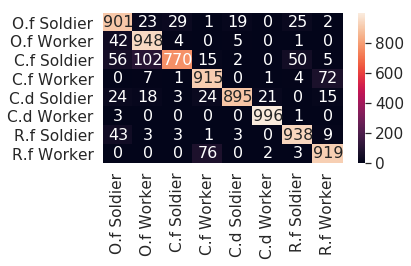

runtime :  22473.78162074089

[97] accuracy: 0.911 loss: 53.102

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125, 0.91075, 0.912125, 0.91075, 0.91025, 0.911375]
[78.90227195620537, 6

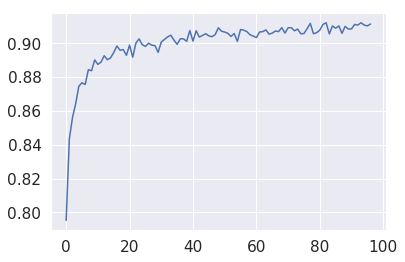

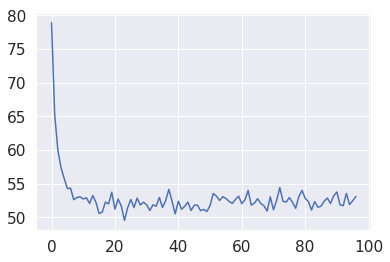

[3, 1, 3, 0, 5, 1, 0, 1, 3, 0, 7, 7, 1, 1, 3, 2, 0, 1, 3, 3, 6, 3, 1, 2, 6, 6, 3, 7, 3, 0, 7, 3, 1, 5, 6, 7, 6, 0, 1, 3, 0, 1, 5, 0, 0, 1, 0, 7, 7, 5, 1, 0, 0, 1, 6, 0, 0, 7, 1, 1, 1, 4, 0, 6, 1, 1, 0, 7, 1, 1, 1, 0, 3, 1, 1, 0, 7, 6, 6, 0, 6, 6, 6, 6, 1, 6, 1, 7, 1, 3, 1, 3, 7, 0, 0, 6, 3, 1, 0, 7, 1, 0, 1, 7, 3, 6, 1, 3, 0, 0, 6, 6, 6, 1, 0, 3, 0, 1, 7, 7, 6, 1, 1, 0, 1, 0, 7, 3, 3, 3, 1, 3, 1, 6, 3, 3, 0, 7, 7, 0, 2, 1, 1, 7, 0, 7, 0, 2, 6, 1, 0, 1, 0, 0, 0, 6, 0, 2, 1, 1, 0, 7, 7, 1, 2, 1, 4, 7, 3, 3, 7, 0, 1, 2, 3, 0, 1, 3, 3, 7, 1, 5, 7, 0, 2, 3, 1, 7, 3, 7, 0, 1, 2, 4, 6, 7, 5, 3, 1, 0, 1, 3, 3, 3, 0, 7, 7, 3, 7, 0, 6, 3, 2, 3, 1, 2, 6, 0, 1, 6, 7, 3, 1, 3, 1, 6, 0, 4, 0, 6, 0, 7, 7, 0, 1, 5, 0, 0, 6, 6, 2, 1, 3, 1, 2, 3, 0, 1, 6, 1, 3, 6, 7, 0, 0, 7, 3, 3, 3, 0, 1, 3, 4, 0, 2, 1, 7, 7, 7, 6, 1, 7, 6, 0, 5, 3, 2, 1, 3, 0, 0, 1, 7, 7, 6, 0, 1, 1, 5, 0, 6, 1, 7, 3, 0, 1, 6, 3, 0, 1, 7, 2, 0, 7, 3, 3, 1, 0, 3, 0, 1, 3, 1, 1, 1, 3, 4, 3, 2, 7, 7, 0, 1, 7, 1, 4, 1, 2, 3, 7, 2, 0, 1, 

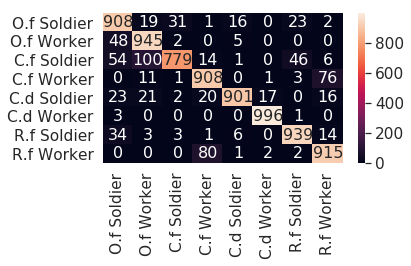

runtime :  22710.15330338478

[98] accuracy: 0.912 loss: 51.070

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125, 0.91075, 0.912125, 0.91075, 0.91025, 0.911375, 0.912125]
[78.9022719

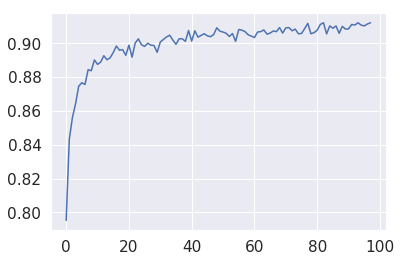

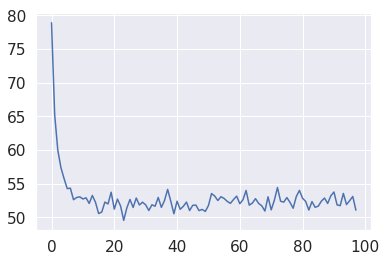

[7, 7, 7, 7, 1, 0, 2, 1, 7, 1, 7, 7, 3, 1, 3, 0, 7, 0, 0, 6, 0, 1, 5, 5, 1, 2, 1, 1, 3, 1, 3, 0, 7, 2, 2, 1, 1, 6, 7, 7, 0, 7, 3, 6, 3, 6, 4, 2, 3, 0, 0, 1, 5, 7, 1, 7, 3, 7, 1, 1, 0, 3, 0, 1, 6, 7, 0, 6, 7, 0, 1, 1, 3, 0, 5, 1, 0, 2, 3, 1, 1, 0, 0, 5, 3, 6, 7, 7, 5, 3, 1, 0, 3, 7, 3, 0, 3, 1, 3, 3, 1, 2, 7, 0, 3, 6, 7, 0, 7, 1, 0, 6, 1, 3, 3, 0, 3, 6, 1, 0, 0, 1, 7, 4, 0, 5, 0, 1, 0, 3, 4, 3, 2, 0, 6, 3, 3, 3, 3, 6, 2, 7, 0, 2, 7, 7, 7, 0, 4, 0, 1, 7, 7, 0, 3, 6, 1, 7, 4, 1, 1, 0, 1, 1, 3, 0, 3, 1, 6, 2, 6, 0, 1, 2, 3, 1, 3, 4, 1, 7, 0, 0, 0, 3, 6, 1, 7, 0, 0, 5, 0, 1, 7, 1, 2, 0, 3, 0, 6, 1, 1, 6, 0, 0, 5, 1, 0, 0, 3, 6, 3, 6, 1, 7, 1, 3, 7, 6, 6, 3, 6, 1, 1, 0, 6, 6, 3, 1, 6, 7, 1, 3, 2, 0, 6, 2, 5, 6, 0, 0, 7, 0, 7, 0, 1, 1, 1, 0, 7, 3, 4, 0, 7, 0, 0, 0, 7, 0, 4, 0, 1, 6, 7, 3, 3, 6, 7, 0, 7, 1, 1, 2, 1, 1, 7, 6, 0, 0, 7, 6, 0, 3, 0, 6, 4, 7, 3, 0, 3, 4, 2, 0, 1, 6, 1, 1, 3, 0, 1, 0, 0, 7, 0, 0, 7, 7, 1, 2, 3, 0, 3, 0, 0, 3, 3, 3, 6, 1, 3, 6, 5, 2, 0, 0, 3, 0, 1, 1, 6, 3, 1, 7, 1, 

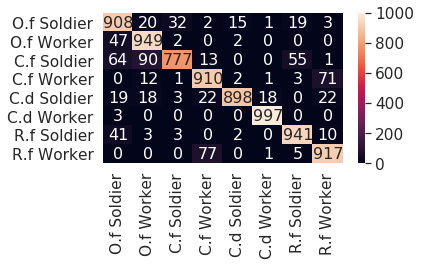

runtime :  22947.05444097519

[99] accuracy: 0.912 loss: 52.361

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125, 0.91075, 0.912125, 0.91075, 0.91025, 0.911375, 0.912125, 0.911875]
[

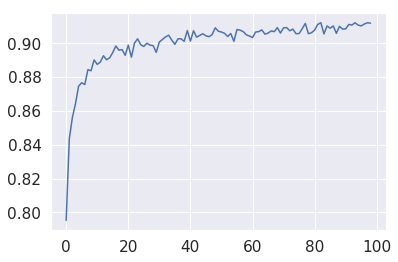

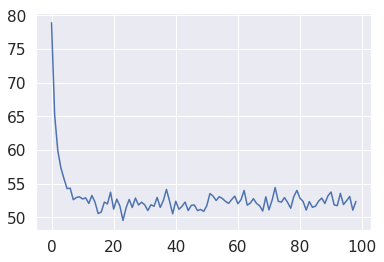

[1, 0, 3, 3, 3, 3, 7, 6, 1, 1, 7, 1, 3, 0, 6, 7, 7, 3, 0, 3, 0, 7, 1, 2, 3, 4, 4, 1, 7, 1, 7, 6, 0, 7, 0, 3, 1, 7, 7, 0, 0, 3, 0, 6, 2, 1, 4, 2, 7, 3, 0, 0, 3, 0, 2, 0, 0, 3, 3, 3, 1, 5, 1, 2, 3, 0, 0, 7, 3, 7, 1, 3, 2, 0, 0, 3, 0, 1, 3, 5, 1, 1, 3, 1, 3, 3, 2, 6, 3, 7, 0, 1, 1, 0, 2, 4, 3, 3, 0, 7, 0, 0, 0, 0, 0, 0, 1, 6, 0, 6, 0, 3, 5, 6, 6, 7, 0, 0, 0, 3, 0, 3, 2, 7, 3, 1, 0, 0, 1, 6, 3, 3, 6, 6, 7, 0, 1, 0, 3, 3, 0, 1, 6, 0, 3, 2, 3, 1, 3, 7, 0, 1, 0, 1, 5, 4, 7, 6, 0, 6, 0, 1, 7, 6, 0, 0, 1, 1, 1, 7, 0, 6, 7, 6, 7, 2, 7, 3, 0, 0, 3, 7, 2, 0, 7, 0, 3, 3, 0, 1, 0, 1, 7, 1, 3, 2, 0, 1, 1, 1, 1, 1, 3, 7, 7, 2, 1, 0, 2, 3, 1, 3, 7, 6, 1, 3, 6, 0, 4, 4, 1, 7, 6, 3, 3, 1, 3, 0, 2, 2, 6, 0, 7, 7, 0, 7, 7, 1, 6, 3, 0, 1, 0, 1, 4, 3, 3, 7, 1, 1, 0, 1, 0, 7, 1, 7, 0, 3, 0, 1, 5, 6, 6, 3, 7, 1, 1, 6, 1, 2, 0, 7, 1, 7, 0, 0, 7, 0, 0, 0, 1, 0, 7, 3, 0, 0, 0, 2, 7, 3, 6, 3, 4, 3, 0, 1, 7, 3, 1, 1, 2, 1, 1, 1, 3, 0, 0, 1, 7, 7, 0, 6, 1, 3, 3, 3, 0, 4, 1, 7, 5, 6, 1, 1, 2, 2, 7, 5, 6, 1, 0, 0, 3, 

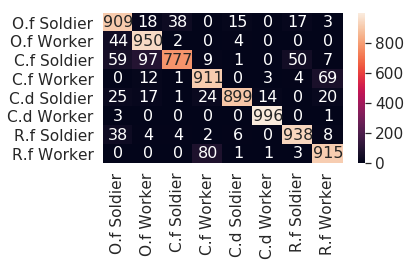

runtime :  23183.276282072067

[100] accuracy: 0.911 loss: 51.706

[0.79525, 0.843375, 0.856125, 0.86425, 0.874625, 0.876625, 0.875625, 0.884375, 0.88375, 0.890125, 0.8875, 0.888875, 0.892625, 0.89025, 0.891375, 0.8945, 0.898375, 0.895875, 0.89625, 0.892875, 0.898875, 0.89175, 0.900125, 0.902625, 0.899125, 0.898125, 0.9, 0.898875, 0.898625, 0.894625, 0.90075, 0.90225, 0.90375, 0.90475, 0.901875, 0.899375, 0.902625, 0.902625, 0.901125, 0.9075, 0.90125, 0.907375, 0.903625, 0.904625, 0.905625, 0.904375, 0.903875, 0.905125, 0.909125, 0.907125, 0.906625, 0.905875, 0.904, 0.90575, 0.901125, 0.908125, 0.90775, 0.906875, 0.905, 0.90425, 0.903375, 0.906625, 0.906875, 0.907875, 0.905375, 0.906, 0.90725, 0.906875, 0.90925, 0.906, 0.909125, 0.90925, 0.907375, 0.908375, 0.905625, 0.90575, 0.908625, 0.91175, 0.905625, 0.90625, 0.90775, 0.911125, 0.912125, 0.9055, 0.91025, 0.908875, 0.91025, 0.905875, 0.91, 0.908375, 0.9085, 0.911125, 0.91075, 0.912125, 0.91075, 0.91025, 0.911375, 0.912125, 0.911875,

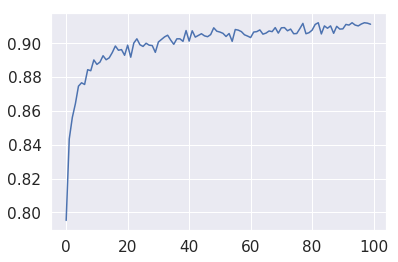

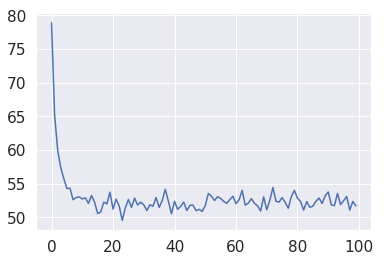

[1, 0, 0, 0, 0, 7, 3, 3, 3, 7, 0, 7, 2, 7, 3, 1, 3, 1, 3, 1, 0, 1, 0, 6, 0, 3, 0, 0, 1, 1, 0, 6, 6, 0, 1, 5, 7, 5, 1, 5, 3, 6, 0, 0, 4, 6, 0, 0, 7, 0, 3, 6, 0, 1, 3, 7, 7, 7, 6, 7, 1, 2, 7, 1, 1, 6, 0, 4, 6, 2, 1, 2, 0, 2, 1, 0, 4, 7, 0, 7, 2, 0, 0, 1, 2, 6, 0, 3, 1, 3, 1, 7, 1, 7, 0, 3, 6, 1, 6, 3, 7, 0, 1, 1, 3, 1, 7, 2, 7, 0, 0, 7, 3, 0, 7, 1, 0, 1, 7, 7, 0, 0, 1, 1, 1, 1, 0, 2, 7, 2, 1, 4, 0, 1, 0, 0, 7, 0, 6, 6, 1, 1, 7, 7, 7, 7, 0, 1, 3, 1, 0, 0, 3, 4, 3, 3, 3, 6, 3, 1, 1, 2, 6, 3, 0, 7, 7, 1, 7, 1, 3, 6, 7, 1, 2, 3, 1, 0, 3, 3, 0, 0, 0, 3, 1, 0, 3, 3, 1, 3, 4, 1, 1, 5, 6, 7, 7, 3, 3, 1, 6, 7, 0, 0, 5, 1, 1, 0, 4, 7, 0, 0, 7, 0, 0, 2, 0, 0, 3, 0, 6, 0, 7, 0, 1, 7, 1, 0, 7, 3, 0, 2, 0, 1, 0, 2, 0, 0, 6, 4, 7, 7, 3, 1, 0, 3, 0, 1, 3, 0, 0, 0, 1, 7, 6, 1, 0, 2, 1, 6, 4, 1, 0, 3, 3, 0, 7, 1, 0, 3, 0, 1, 1, 6, 1, 1, 1, 2, 7, 2, 7, 7, 1, 3, 6, 0, 1, 1, 5, 3, 0, 3, 7, 7, 1, 1, 3, 3, 3, 1, 3, 2, 2, 1, 2, 6, 7, 2, 4, 7, 7, 7, 3, 3, 3, 1, 7, 1, 7, 1, 4, 0, 3, 0, 4, 0, 0, 3, 7, 7, 6, 0, 1, 

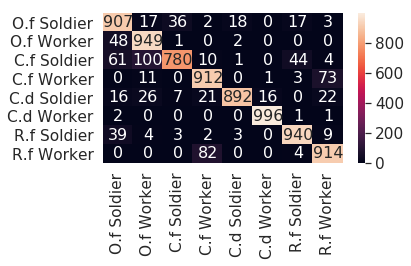

runtime :  23418.259513139725


In [37]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
test_acc = []
test_loss = []
# classes2 = ["O. formosanus Worker","C. formosanus Worker", "C. domesticus Worker", "R. flaviceps Worker"]
import time
start = time.time()
for model_num in range(1, EPOCH+1):
    wrong_images = []
    wrong_answer = []
    actual_answer = []
    weight_path = model_directory + "%03d_weights.pt" % (model_num)
    state_dict = torch.load(weight_path)
    model.load_state_dict(state_dict)
    running_loss = 0.0
    total = 0
    correct = 0
    confusion_matrix = torch.zeros(len(classes), len(classes))
    for step, (labels, images, paths) in enumerate(testloader):
        optimizer.zero_grad()
        images = images.detach().cuda()
        labels = labels.detach().cuda()
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        # append to the wrong list (test log file)
        for i in range(len(predicted)):
            if predicted[i] != labels[i]:
#                 print(paths[i], predicted[i], labels[i])
                wrong_images.append(paths[i])
                wrong_answer.append(predicted[i].item())
                actual_answer.append(labels[i].item())
        loss = criterion(outputs, labels)
        running_loss += loss.item()
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        for t, p in zip(labels.view(-1), predicted.view(-1)):
#             print(t.item(), p.item())
#             mapp = { 1: 0,
#                     3: 1,
#                     5: 2,
#                     6: 3}
#             confusion_matrix[mapp[t.item()], mapp[p.item()]] += 1
            confusion_matrix[t.item(), p.item()] += 1
    
    running_acc = correct / total
    print('\n[%d] accuracy: %.3f loss: %.3f\n' % (model_num, running_acc, running_loss))
    
    test_acc.append(running_acc)
    test_loss.append(running_loss)
    print(test_acc)
    print(test_loss)
    plt.figure()
    plt.plot(range(0,model_num), test_acc)
    plt.savefig(temp_directory + "test_acc_E%03d.jpg" % (model_num), dpi=500)
    plt.show()
    plt.figure()
    plt.plot(range(0,model_num), test_loss)
    plt.savefig(temp_directory + "test_loss_E%03d.jpg" % (model_num), dpi=500)
    plt.show()
    
    
    print(wrong_answer)
    with open(temp_directory + "%03d_wrong.txt" % (model_num), 'w') as wrong:
#         c = zip(wrong_images, wrong_answer, actual_answer)
#         c = sorted(c)
#         (wrong_images, wrong_answer, actual_answer) = zip(*c)
#         print(wrong_images)
        for i in range(len(wrong_images)):
            wrong.write(wrong_images[i] + " " + classes[wrong_answer[i]] + " " + classes[actual_answer[i]])
#             print(wrong_images[i] + " " + classes[wrong_answer[i]] + " " + classes[actual_answer[i]])
            wrong.write("\n")
        wrong.close()
#     print(confusion_matrix)
    confusion_matrix = confusion_matrix.numpy().astype(int)
#     print(confusion_matrix)
    df_cm = pd.DataFrame(confusion_matrix, index = [i for i in classes],
                  columns = [i for i in classes])
    print(df_cm)
    sn.set(font_scale=1.4)#for label size
#     print(classes)
    img = sn.heatmap(df_cm, annot=True,annot_kws={"size": 16}, fmt="d")
    figure = img.get_figure()
    plt.tight_layout()
    plt.savefig(temp_directory + "confusion_matrix_%03d.jpg" % (model_num), dpi=500)
    plt.show()
    runtime = time.time() - start
    print("runtime : ", runtime)

In [38]:
print("runtime : ", runtime)
resultfile = open(model_directory+"test_results.txt", "a")
resultfile.write("test")
resultfile.write("\n")
resultfile.write(str(test_acc))
resultfile.write("\n")
resultfile.write(str(test_loss))
resultfile.write("\n")
resultfile.close()


runtime :  23418.259513139725
